<a href="https://colab.research.google.com/github/MedeirosN/PUBH5357/blob/main/SIT2STAND__STANFORD.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
install.packages("/path/to/dataClean", repos = NULL) # Install package from local source.

library(dataClean) # Load the package.

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Warning message in install.packages("/path/to/dataClean", repos = NULL):
“installation of package ‘/path/to/dataClean’ had non-zero exit status”


ERROR: Error in library(dataClean): there is no package called ‘dataClean’


In [ ]:
# Load required libraries
library(ggplot2)
library(dplyr)
library(readr)

# Load the dataset
data <- read_csv("/mnt/data/dataClean.csv")

# Check column names to find the correct age group variable
colnames(data)

# If 'ageGroup' exists and is the correct column, proceed
# Create bar chart
ggplot(data, aes(x = ageGroup)) +
  geom_bar(fill = "skyblue", color = "black") +
  labs(title = "Distribution of Age Groups",
       x = "Age Group",
       y = "Frequency") +
  theme_minimal()


ERROR: Error: '/mnt/data/dataClean.csv' does not exist.


In [ ]:
# Load necessary libraries
library(ggplot2)
library(dplyr)
library(readr)

# Load the dataset
df <- read_csv("/mnt/data/dataClean_text.csv")

# If AgeGroup variable does not exist, create it based on Age
# Adjust the breaks and labels if needed
df <- df %>%
  mutate(ageGroup = cut(Age,
                        breaks = c(17, 29, 39, 49, 59, 69, Inf),
                        labels = c("18-29", "30-39", "40-49", "50-59", "60-69", "70+"),
                        right = TRUE))

# Create bar chart
ggplot(df, aes(x = ageGroup)) +
  geom_bar(fill = "skyblue", color = "black") +
  labs(title = "Distribution of Participants by Age Group",
       x = "Age Group",
       y = "Count") +
  theme_minimal()


ERROR: Error: '/mnt/data/dataClean_text.csv' does not exist.


In [ ]:
# Load necessary libraries
library(ggplot2)
library(dplyr)
library(readr)

# Adjust this path to where the CSV is located on your machine
df <- read_csv("C:/Users/YourName/Downloads/dataClean_text.csv")

# Create age groups if not already in the data
df <- df %>%
  mutate(ageGroup = cut(Age,
                        breaks = c(17, 29, 39, 49, 59, 69, Inf),
                        labels = c("18-29", "30-39", "40-49", "50-59", "60-69", "70+"),
                        right = TRUE))

# Plot
ggplot(df, aes(x = ageGroup)) +
  geom_bar(fill = "skyblue", color = "black") +
  labs(title = "Distribution of Participants by Age Group",
       x = "Age Group",
       y = "Count") +
  theme_minimal()


ERROR: Error: 'C:/Users/YourName/Downloads/dataClean_text.csv' does not exist.


In [ ]:
C:/Users/nmedeiros/Downloads/dataClean_text.csv


ERROR: Error in parse(text = input): <text>:1:3: unexpected '/'
1: C:/
      ^


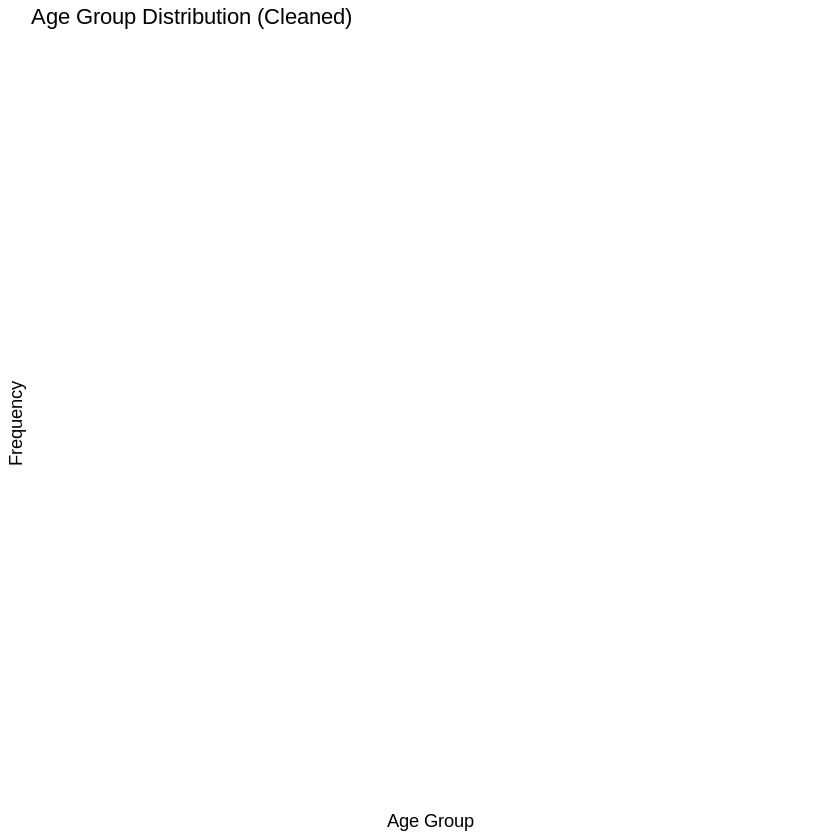

In [ ]:
# Frequency table
age_freq <- dataClean_text %>%
  count(AgeGroup) %>%
  mutate(Percentage = round(100 * n / sum(n), 1))

# Plot
ggplot(age_freq, aes(x = reorder(AgeGroup, -n), y = n, fill = AgeGroup)) +
  geom_bar(stat = "identity", color = "white") +
  geom_text(aes(label = paste0(Percentage, "%")), vjust = -0.5) +
  scale_fill_brewer(palette = "Set3") +
  labs(title = "Age Group Distribution (Cleaned)", x = "Age Group", y = "Frequency") +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1),
        legend.position = "none")


In [ ]:
unique(dataClean_text$AgeGroup)


character(0)

In [ ]:
str(dataClean_text$AgeGroup)
table(dataClean_text$AgeGroup, useNA = "always")


 chr(0) 



<NA> 
   0 

In [ ]:
# Check if Age variable exists
summary(dataClean_text$Age)

# Recreate AgeGroup based on Age
dataClean_text$AgeGroup <- cut(
  dataClean_text$Age,
  breaks = c(-Inf, 18, 30, 40, 50, 60, Inf),
  labels = c("0-18", "19-30", "31-40", "41-50", "51-60", "61+"),
  right = TRUE
)


   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
                                                

In [ ]:
unique(dataClean_text$AgeGroup)


character(0)

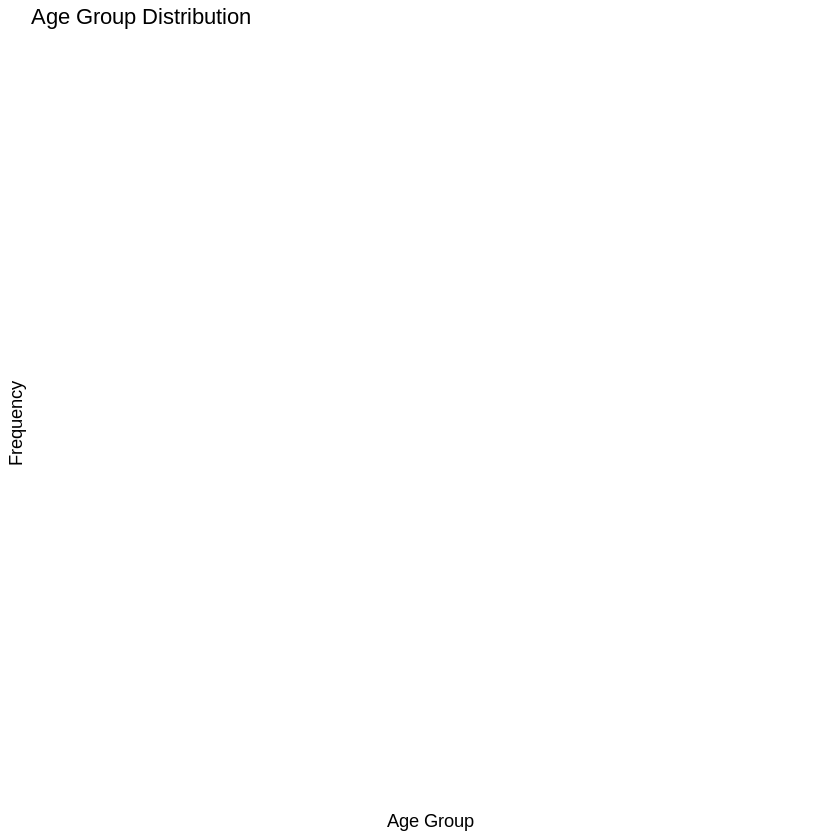

In [ ]:
library(dplyr)
library(ggplot2)

age_freq <- dataClean_text %>%
  count(AgeGroup) %>%
  mutate(Percentage = round(100 * n / sum(n), 1))

ggplot(age_freq, aes(x = AgeGroup, y = n, fill = AgeGroup)) +
  geom_bar(stat = "identity", color = "white") +
  geom_text(aes(label = paste0(Percentage, "%")), vjust = -0.5) +
  scale_fill_brewer(palette = "Set3") +
  labs(title = "Age Group Distribution", x = "Age Group", y = "Frequency") +
  theme_minimal() +
  theme(legend.position = "none", axis.text.x = element_text(angle = 45, hjust = 1))


In [ ]:
dataClean_text$AgeGroup <- cut(
  dataClean_text$Age,
  breaks = c(-Inf, 18, 30, 40, 50, 60, Inf),
  labels = c("0-18", "19-30", "31-40", "41-50", "51-60", "61+"),
  right = TRUE
)


In [ ]:
# Load libraries
library(dplyr)
library(ggplot2)

# Recode Ethnicity based on your confirmed logic
dataClean_text$Ethnicity <- tolower(trimws(dataClean_text$Ethnicity))

dataClean_text$Ethnicity_grouped <- case_when(
  dataClean_text$Ethnicity %in% c(
    "white",
    "white,hispanic",
    "white,asian",
    "white,other",
    "white,african american",
    "white,american indian or alaskan native"
  ) ~ "White",
  grepl("hispanic", dataClean_text$Ethnicity) ~ "Hispanic",
  grepl("african american|black", dataClean_text$Ethnicity) ~ "African American",
  grepl("asian", dataClean_text$Ethnicity) ~ "Asian",
  TRUE ~ "Other"
)

# Convert to factor with defined order
dataClean_text$Ethnicity_grouped <- factor(
  dataClean_text$Ethnicity_grouped,
  levels = c("White", "Hispanic", "Asian", "African American", "Other")
)

# Create frequency table
ethnicity_freq <- dataClean_text %>%
  count(Ethnicity_grouped) %>%
  mutate(Percentage = round(100 * n / sum(n), 1))

# Plot
ggplot(ethnicity_freq, aes(x = Ethnicity_grouped, y = n, fill = Ethnicity_grouped)) +
  geom_bar(stat = "identity", color = "white") +
  geom_text(aes(label = paste0(Percentage, "%")), vjust = -0.5, size = 4) +
  scale_fill_brewer(palette = "Pastel2") +
  labs(title = "Ethnicity Distribution (Grouped)", x = "Ethnicity", y = "Frequency") +
  theme_minimal() +
  theme(legend.position = "none", axis.text.x = element_text(angle = 45, hjust = 1))



Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




ERROR: Error: object 'dataClean_text' not found


In [ ]:
# Load the dataset (adjust the path if needed)
dataClean_text <- read.csv("dataClean_text.csv", stringsAsFactors = FALSE)


<ggproto object: Class ScaleDiscrete, Scale, gg>
    aesthetics: fill
    axis_order: function
    break_info: function
    break_positions: function
    breaks: waiver
    call: call
    clone: function
    dimension: function
    drop: TRUE
    expand: waiver
    get_breaks: function
    get_breaks_minor: function
    get_labels: function
    get_limits: function
    get_transformation: function
    guide: legend
    is_discrete: function
    is_empty: function
    labels: waiver
    limits: NULL
    make_sec_title: function
    make_title: function
    map: function
    map_df: function
    n.breaks.cache: NULL
    na.translate: TRUE
    na.value: NA
    name: waiver
    palette: function
    palette.cache: NULL
    position: left
    range: environment
    rescale: function
    reset: function
    train: function
    train_df: function
    transform: function
    transform_df: function
    super:  <ggproto object: Class ScaleDiscrete, Scale, gg>

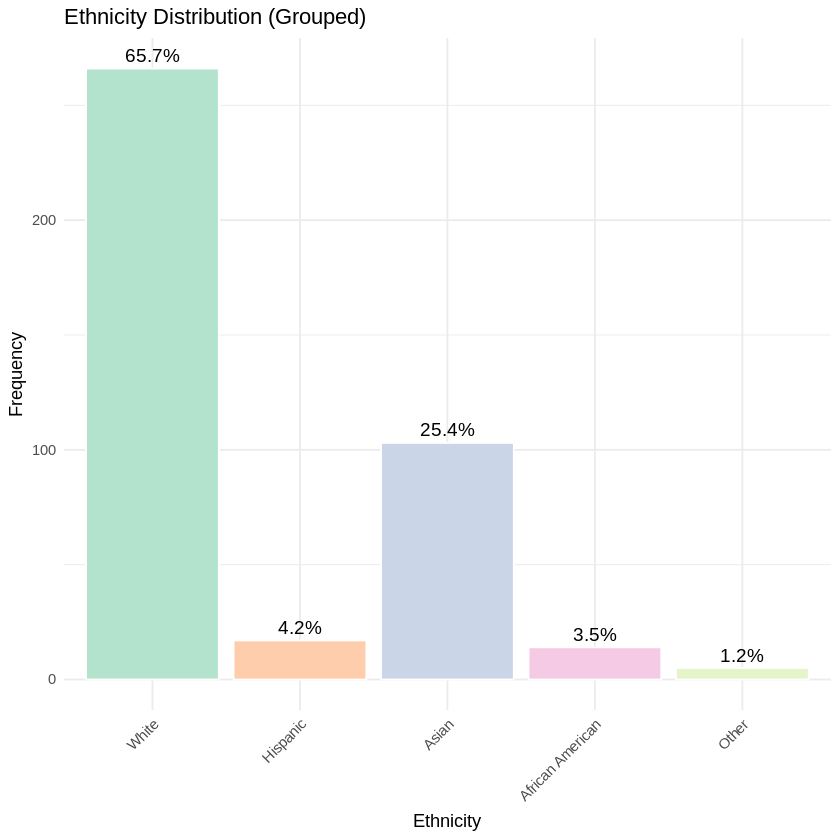

In [ ]:
# Load libraries
library(dplyr)
library(ggplot2)

# Clean and recode Ethnicity
dataClean_text$Ethnicity <- tolower(trimws(dataClean_text$Ethnicity))

dataClean_text$Ethnicity_grouped <- case_when(
  dataClean_text$Ethnicity %in% c(
    "white",
    "white,hispanic",
    "white,asian",
    "white,other",
    "white,african american",
    "white,american indian or alaskan native"
  ) ~ "White",
  grepl("hispanic", dataClean_text$Ethnicity) ~ "Hispanic",
  grepl("african american|black", dataClean_text$Ethnicity) ~ "African American",
  grepl("asian", dataClean_text$Ethnicity) ~ "Asian",
  TRUE ~ "Other"
)

# Factor with specific order
dataClean_text$Ethnicity_grouped <- factor(
  dataClean_text$Ethnicity_grouped,
  levels = c("White", "Hispanic", "Asian", "African American", "Other")
)

# Frequency table
ethnicity_freq <- dataClean_text %>%
  count(Ethnicity_grouped) %>%
  mutate(Percentage = round(100 * n / sum(n), 1))

# Plot
ggplot(ethnicity_freq, aes(x = Ethnicity_grouped, y = n, fill = Ethnicity_grouped)) +
  geom_bar(stat = "identity", color = "white") +
  geom_text(aes(label = paste0(Percentage, "%")), vjust = -0.5, size = 4) +
  scale_fill_brewer(palette = "Pastel2") +
  labs(title = "Ethnicity Distribution (Grouped)", x = "Ethnicity", y = "Frequency") +
  theme_minimal() +
  theme(legend.position = "none", axis.text.x = element_text(angle = 45, hjust = 1))
scale_fill_brewer(palette = "Pastel2")


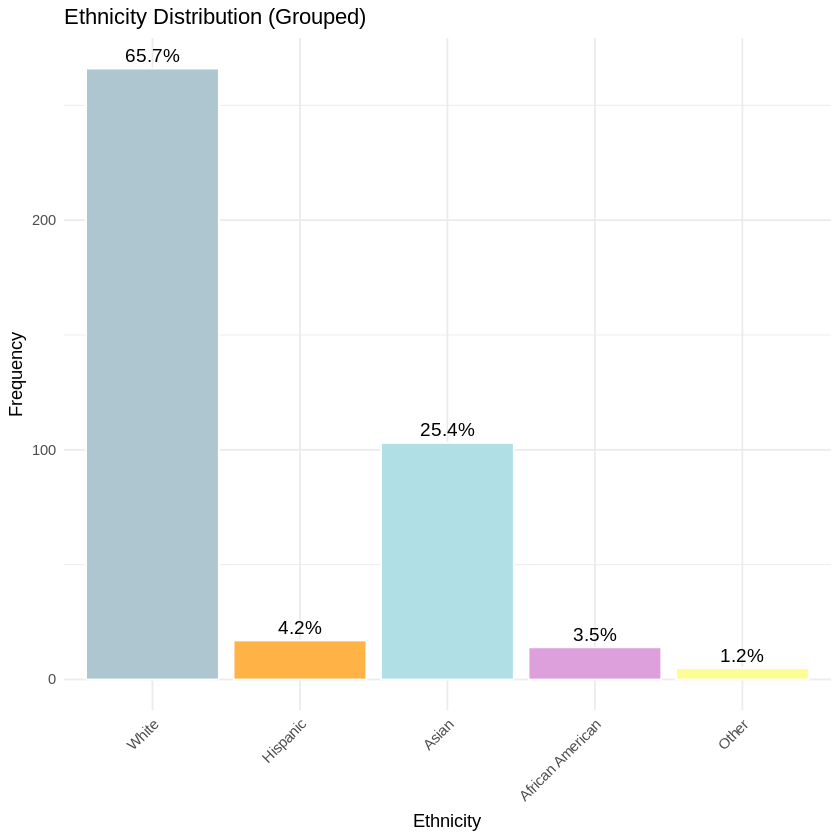

In [ ]:
ggplot(ethnicity_freq, aes(x = Ethnicity_grouped, y = n, fill = Ethnicity_grouped)) +
  geom_bar(stat = "identity", color = "white") +
  geom_text(aes(label = paste0(Percentage, "%")), vjust = -0.5, size = 4) +
  scale_fill_manual(values = c(
    "White" = "#aec6cf",
    "Hispanic" = "#ffb347",
    "Asian" = "#b0e0e6",
    "African American" = "#dda0dd",
    "Other" = "#fdfd96"
  )) +
  labs(title = "Ethnicity Distribution (Grouped)", x = "Ethnicity", y = "Frequency") +
  theme_minimal() +
  theme(legend.position = "none", axis.text.x = element_text(angle = 45, hjust = 1))


In [ ]:
# Load required libraries
library(ggplot2)
library(dplyr)

# Make sure AgeGroup is character and recode 0-18 to 19-30
dataClean_text$AgeGroup <- as.character(dataClean_text$AgeGroup)
dataClean_text$AgeGroup[dataClean_text$AgeGroup == "0-18"] <- "19-30"

# Optional: convert to factor with desired order
dataClean_text$AgeGroup <- factor(dataClean_text$AgeGroup,
                                  levels = c("19-30", "31-40", "41-50", "51-60", "61+", "Other"))

# Create frequency table
age_freq <- dataClean_text %>%
  count(AgeGroup) %>%
  mutate(Percentage = round(100 * n / sum(n), 1))

# Plot bar chart
ggplot(age_freq, aes(x = AgeGroup, y = n, fill = AgeGroup)) +
  geom_bar(stat = "identity", color = "white") +
  geom_text(aes(label = paste0(Percentage, "%")), vjust = -0.5, size = 4) +
  scale_fill_brewer(palette = "Pastel2") +



ERROR: Error in parse(text = input): <text>:25:0: unexpected end of input
23:   
24: 
   ^


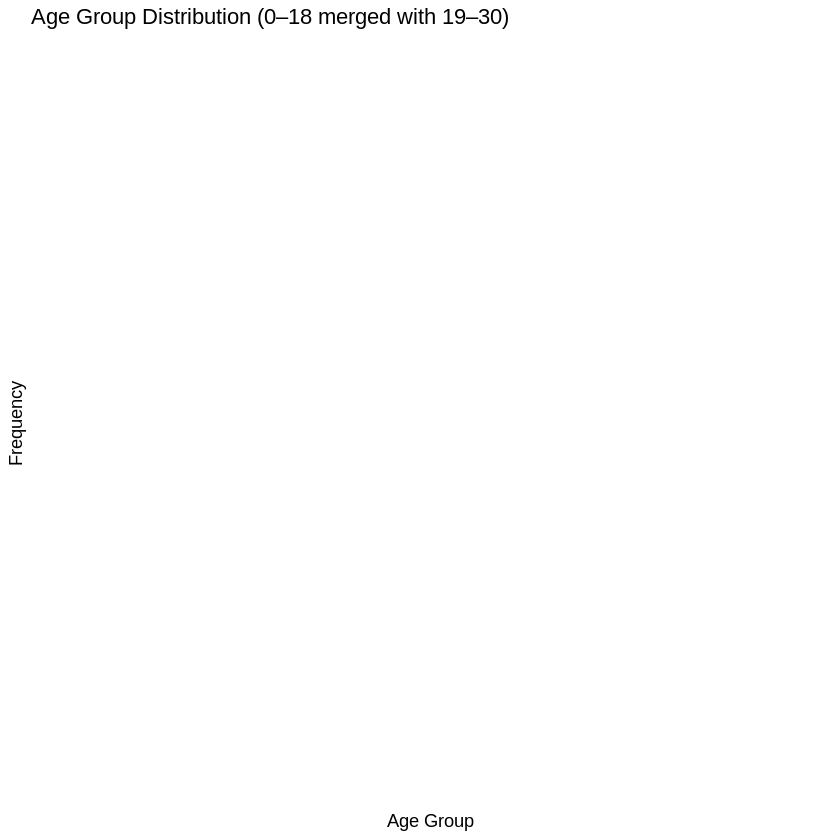

In [ ]:
library(ggplot2)
library(dplyr)

# Clean and recode
dataClean_text$AgeGroup <- as.character(dataClean_text$AgeGroup)
dataClean_text$AgeGroup[dataClean_text$AgeGroup == "0-18"] <- "19-30"

# Re-factor without forcing levels
dataClean_text$AgeGroup <- factor(dataClean_text$AgeGroup)

# Count and plot
age_freq <- dataClean_text %>%
  filter(!is.na(AgeGroup)) %>%
  count(AgeGroup) %>%
  mutate(Percentage = round(100 * n / sum(n), 1))

ggplot(age_freq, aes(x = AgeGroup, y = n, fill = AgeGroup)) +
  geom_bar(stat = "identity", color = "white") +
  geom_text(aes(label = paste0(Percentage, "%")), vjust = -0.5) +
  scale_fill_brewer(palette = "Pastel1") +
  labs(title = "Age Group Distribution (0–18 merged with 19–30)",
       x = "Age Group", y = "Frequency") +
  theme_minimal() +
  theme(legend.position = "none", axis.text.x = element_text(angle = 45, hjust = 1))


In [ ]:
# Load required libraries
library(ggplot2)
library(dplyr)

# Ensure AgeGroup is treated as character (raw values preserved)
dataClean_text$AgeGroup_raw <- as.character(dataClean_text$ageGroup)  # use actual column name

# Create frequency table with percentages
age_freq_raw <- dataClean_text %>%
  filter(!is.na(AgeGroup_raw)) %>%
  count(AgeGroup_raw) %>%
  mutate(Percentage = round(100 * n / sum(n), 1))

# Plot raw AgeGroup frequencies
ggplot(age_freq_raw, aes(x = reorder(AgeGroup_raw, -n), y = n, fill = AgeGroup_raw)) +
  geom_bar(stat = "identity", color = "white") +
  geom_text(aes(label = paste0(Percentage, "%")), vjust = -0.5, size = 4) +
  labs(title = "All AgeGroup Frequencies (Raw Values)",
       x = "Age Group", y = "Frequency") +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1),
        legend.position = "none") +
  scale_fill_brewer(palette = "Set3")  # colorful pastel palette


ERROR: Error in `$<-.data.frame`(`*tmp*`, AgeGroup_raw, value = character(0)): replacement has 0 rows, data has 405


In [ ]:
# Load required libraries
library(dplyr)
library(ggplot2)

# Convert to character to ensure consistency
dataClean_text$ageGroup <- as.character(dataClean_text$ageGroup)

# Create frequency table
age_freq <- dataClean_text %>%
  filter(!is.na(ageGroup)) %>%
  count(ageGroup) %>%
  mutate(Percentage = round(100 * n / sum(n), 1))

# Plot the bar chart
ggplot(age_freq, aes(x = reorder(ageGroup, -n), y = n, fill = ageGroup)) +
  geom_bar(stat = "identity", color = "white") +
  geom_text(aes(label = paste0(Percentage, "%")), vjust = -0.5, size = 4) +
  scale_fill_brewer(palette = "Set3") +
  labs(title = "Frequency of All Age Groups (Raw Values)",
       x = "Age Group", y = "Frequency") +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1),
        legend.position = "none")


ERROR: Error in `$<-.data.frame`(`*tmp*`, ageGroup, value = character(0)): replacement has 0 rows, data has 405


In [ ]:
names(dataClean_text)


[1] "X"                                      
  [2] "subjectid"                              
  [3] "orientation"                            
  [4] "framerate"                              
  [5] "n"                                      
  [6] "time"                                   
  [7] "time_diff"                              
  [8] "speed"                                  
  [9] "time_sd"                                
 [10] "speed_sd"                               
 [11] "n_sit2stand"                            
 [12] "time_sit2stand"                         
 [13] "time_diff_sit2stand"                    
 [14] "speed_sit2stand"                        
 [15] "time_sd_sit2stand"                      
 [16] "speed_sd_sit2stand"                     
 [17] "n_stand2sit"                            
 [18] "time_stand2sit"                         
 [19] "time_diff_stand2sit"                    
 [20] "speed_stand2sit"                        
 [21] "time_sd_stand2sit"                      
 [22] "speed_sd_stand2sit"                     
 [23] "left_knee_range_mean"                   
 [24] "left_knee_sd"                           
 [25] "left_knee_max"                          
 [26] "left_knee_min"                          
 [27] "left_knee_max_mean"                     
 [28] "left_knee_min_mean"                     
 [29] "left_knee_max_sd"                       
 [30] "left_knee_min_sd"                       
 [31] "left_knee_ang_vel"                      
 [32] "left_knee_ang_acc"                      
 [33] "left_knee_max_ang_vel"                  
 [34] "left_knee_max_ang_acc"                  
 [35] "left_knee_min_ang_vel"                  
 [36] "left_knee_min_ang_acc"                  
 [37] "right_knee_range_mean"                  
 [38] "right_knee_sd"                          
 [39] "right_knee_max"                         
 [40] "right_knee_min"                         
 [41] "right_knee_max_mean"                    
 [42] "right_knee_min_mean"                    
 [43] "right_knee_max_sd"                      
 [44] "right_knee_min_sd"                      
 [45] "right_knee_ang_vel"                     
 [46] "right_knee_ang_acc"                     
 [47] "right_knee_max_ang_vel"                 
 [48] "right_knee_max_ang_acc"                 
 [49] "right_knee_min_ang_vel"                 
 [50] "right_knee_min_ang_acc"                 
 [51] "left_hip_range_mean"                    
 [52] "left_hip_sd"                            
 [53] "left_hip_max"                           
 [54] "left_hip_min"                           
 [55] "left_hip_max_mean"                      
 [56] "left_hip_min_mean"                      
 [57] "left_hip_max_sd"                        
 [58] "left_hip_min_sd"                        
 [59] "left_hip_ang_vel"                       
 [60] "left_hip_ang_acc"                       
 [61] "left_hip_max_ang_vel"                   
 [62] "left_hip_max_ang_acc"                   
 [63] "left_hip_min_ang_vel"                   
 [64] "left_hip_min_ang_acc"                   
 [65] "right_hip_range_mean"                   
 [66] "right_hip_sd"                           
 [67] "right_hip_max"                          
 [68] "right_hip_min"                          
 [69] "right_hip_max_mean"                     
 [70] "right_hip_min_mean"                     
 [71] "right_hip_max_sd"                       
 [72] "right_hip_min_sd"                       
 [73] "right_hip_ang_vel"                      
 [74] "right_hip_ang_acc"                      
 [75] "right_hip_max_ang_vel"                  
 [76] "right_hip_max_ang_acc"                  
 [77] "right_hip_min_ang_vel"                  
 [78] "right_hip_min_ang_acc"                  
 [79] "left_ankle_range_mean"                  
 [80] "left_ankle_sd"                          
 [81] "left_ankle_max"                         
 [82] "left_ankle_min"                         
 [83] "left_ankle_max_mean"                    
 [84] "left_ankle_

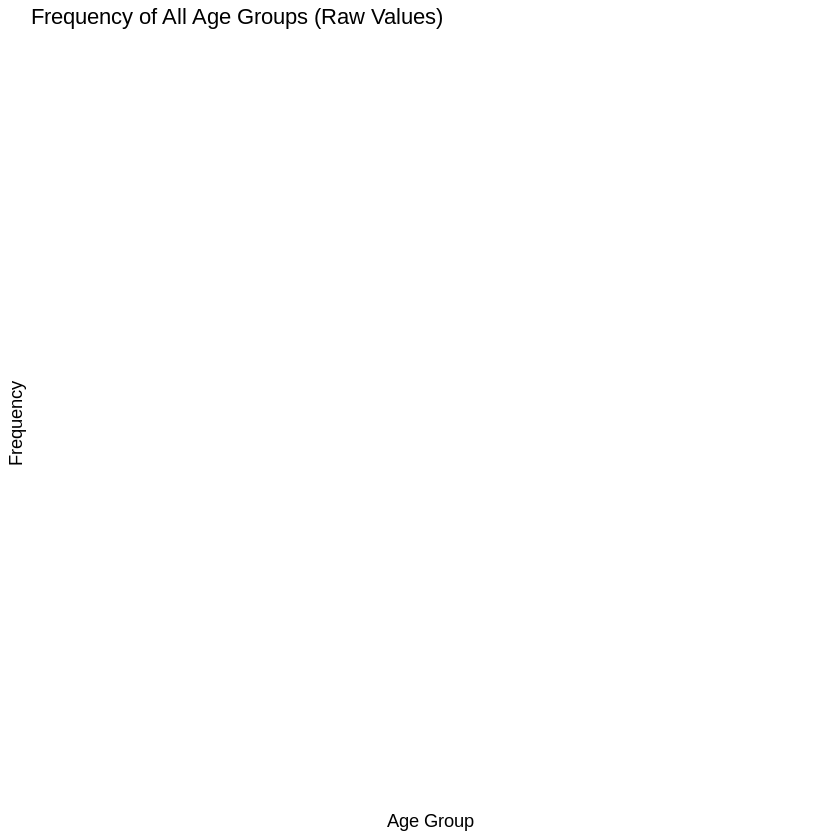

In [ ]:
# Load required libraries
library(dplyr)
library(ggplot2)

# Ensure AgeGroup is character to preserve formatting
dataClean_text$AgeGroup <- as.character(dataClean_text$AgeGroup)

# Create frequency table with percentages
age_freq <- dataClean_text %>%
  filter(!is.na(AgeGroup)) %>%
  count(AgeGroup) %>%
  mutate(Percentage = round(100 * n / sum(n), 1))

# Bar chart
ggplot(age_freq, aes(x = reorder(AgeGroup, -n), y = n, fill = AgeGroup)) +
  geom_bar(stat = "identity", color = "white") +
  geom_text(aes(label = paste0(Percentage, "%")), vjust = -0.5, size = 4) +
  scale_fill_brewer(palette = "Set3") +
  labs(title = "Frequency of All Age Groups (Raw Values)",
       x = "Age Group", y = "Frequency") +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1),
        legend.position = "none")


In [ ]:
# Convert to character and clean
dataClean_text$AgeGroup <- tolower(trimws(as.character(dataClean_text$AgeGroup)))

# Remove empty or NA entries
dataClean_text <- dataClean_text %>%
  filter(!is.na(AgeGroup) & AgeGroup != "")


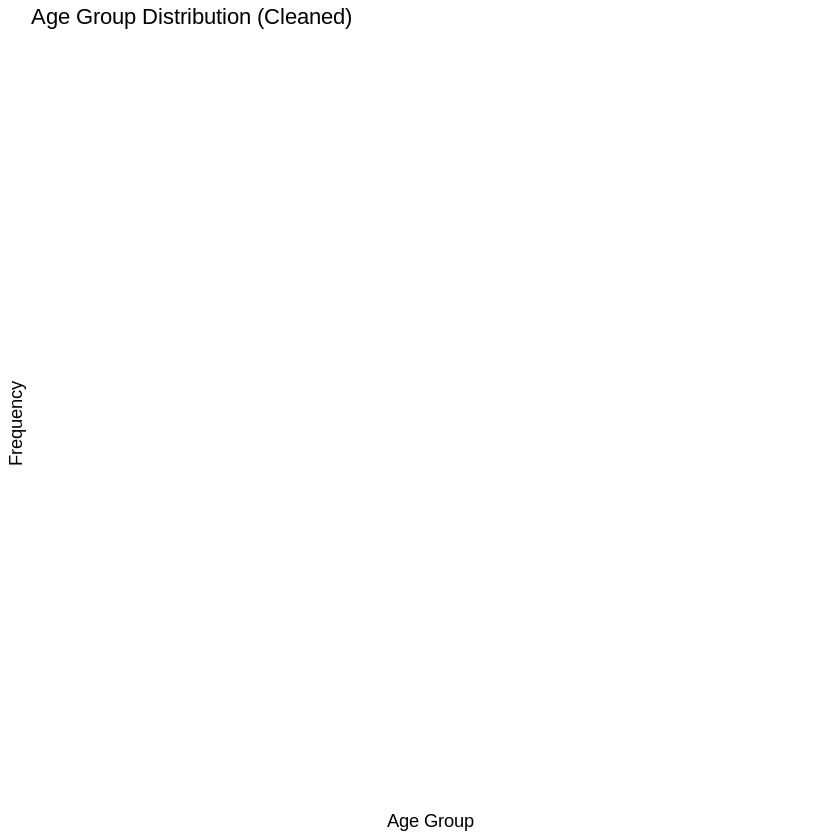

In [ ]:
# Frequency table
age_freq <- dataClean_text %>%
  count(AgeGroup) %>%
  mutate(Percentage = round(100 * n / sum(n), 1))

# Plot
ggplot(age_freq, aes(x = reorder(AgeGroup, -n), y = n, fill = AgeGroup)) +
  geom_bar(stat = "identity", color = "white") +
  geom_text(aes(label = paste0(Percentage, "%")), vjust = -0.5) +
  scale_fill_brewer(palette = "Set3") +
  labs(title = "Age Group Distribution (Cleaned)", x = "Age Group", y = "Frequency") +
  theme_minimal() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1),
        legend.position = "none")


In [ ]:
table(dataClean_text$AgeGroup, useNA = "always")



<NA> 
 405 

In [ ]:
# Ensure AgeGroup is character
dataClean_text$AgeGroup <- as.character(dataClean_text$AgeGroup)

# Combine 0-18 into 19-30
dataClean_text$AgeGroup[dataClean_text$AgeGroup == "0-18"] <- "19-30"

# Optional: convert back to factor with desired order
dataClean_text$AgeGroup <- factor(dataClean_text$AgeGroup,
                                  levels = c("19-30", "31-40", "41-50", "51-60", "61+", "Other"))


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependency ‘magick’


Warning message in install.packages("kableExtra", dependencies = TRUE):
“installation of package ‘magick’ had non-zero exit status”
Warning message in cor(numeric_data[, knee_vars], numeric_data, use = "complete.obs"):
“the standard deviation is zero”


<table class="table table-striped" style="width: auto !important; margin-left: auto; margin-right: auto;">
 <thead>
  <tr>
   <th style="text-align:left;"> Knee Variable </th>
   <th style="text-align:left;"> Other Variable </th>
   <th style="text-align:right;"> Correlation </th>
  </tr>
 </thead>
<tbody>
  <tr>
   <td style="text-align:left;"> left_knee_range_mean </td>
   <td style="text-align:left;"> left_knee_range_mean </td>
   <td style="text-align:right;"> 1.0000000 </td>
  </tr>
  <tr>
   <td style="text-align:left;"> left_knee_sd </td>
   <td style="text-align:left;"> left_knee_range_mean </td>
   <td style="text-align:right;"> 0.9027966 </td>
  </tr>
  <tr>
   <td style="text-align:left;"> left_knee_max </td>
   <td style="text-align:left;"> left_knee_range_mean </td>
   <td style="text-align:right;"> 0.8932517 </td>
  </tr>
  <tr>
   <td style="text-align:left;"> left_knee_min </td>
   <td style="text-align:left;"> left_knee_range_mean </td>
   <td style="text-align:right;"

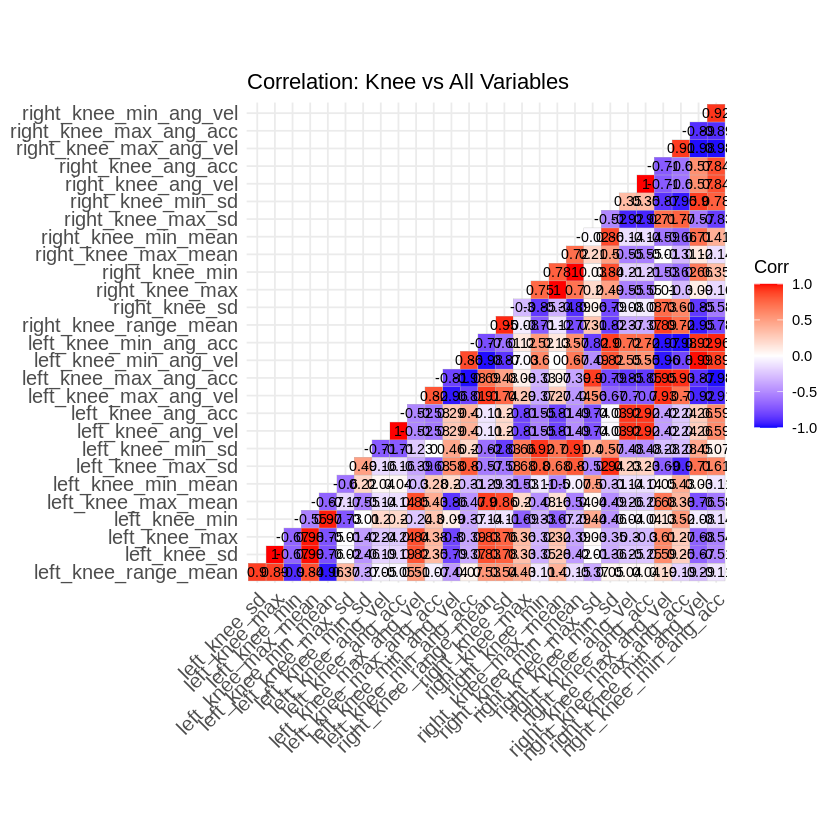

In [ ]:
# Load necessary libraries
install.packages("ggplot2", dependencies = TRUE) # If not installed
install.packages("ggcorrplot", dependencies = TRUE) # If not installed
install.packages("reshape2", dependencies = TRUE) # If not installed
install.packages("kableExtra", dependencies = TRUE) # If not installed

library(ggplot2)
library(ggcorrplot)
library(reshape2)
library(kableExtra)

# Load the dataset
data <- read.csv("dataClean.csv", header = TRUE, sep = ",")

# Define knee variables
knee_vars <- c("left_knee_range_mean", "left_knee_sd", "left_knee_max", "left_knee_min", "left_knee_max_mean",
               "left_knee_min_mean", "left_knee_max_sd", "left_knee_min_sd", "left_knee_ang_vel", "left_knee_ang_acc",
               "left_knee_max_ang_vel", "left_knee_max_ang_acc", "left_knee_min_ang_vel", "left_knee_min_ang_acc",
               "right_knee_range_mean", "right_knee_sd", "right_knee_max", "right_knee_min", "right_knee_max_mean",
               "right_knee_min_mean", "right_knee_max_sd", "right_knee_min_sd", "right_knee_ang_vel", "right_knee_ang_acc",
               "right_knee_max_ang_vel", "right_knee_max_ang_acc", "right_knee_min_ang_vel", "right_knee_min_ang_acc")

# Define all variables (including knee variables)
all_vars <- unique(c(knee_vars, colnames(data)))

# Filter numeric selected variables
numeric_data <- data[, all_vars]
numeric_data <- numeric_data[, sapply(numeric_data, is.numeric)]
numeric_data <- numeric_data[, apply(numeric_data, 2, function(x) ifelse(sd(x, na.rm = TRUE) > 0 & length(unique(na.omit(x))) > 1, TRUE, FALSE))]
numeric_data <- numeric_data[, sapply(numeric_data, function(x) length(unique(x[!is.na(x)])) > 1)]  # Remove identical-value columns
numeric_data <- numeric_data[, colSums(!is.na(numeric_data)) > 1]  # Ensure at least 2 non-NA values
if (ncol(numeric_data) == 0) stop("Error: No numeric columns with non-zero variance found.")  # Remove constant columns

# Compute correlation matrix for knee variables against all variables
cor_matrix <- cor(numeric_data[, knee_vars], numeric_data, use = "complete.obs")
cor_matrix[is.na(cor_matrix)] <- 0

# Save correlation matrix to CSV
write.csv(as.data.frame(cor_matrix), "correlation_knee_vs_all.csv", row.names = TRUE)

# Display correlation table
cor_table <- as.data.frame(as.table(cor_matrix))
names(cor_table) <- c("Knee Variable", "Other Variable", "Correlation")
kable(cor_table) %>%
  kable_styling("striped", full_width = FALSE)

# Generate correlation heatmap
ggcorrplot(cor_matrix, method = "square", type = "lower", lab = TRUE, lab_size = 3,
           colors = c("blue", "white", "red"), title = "Correlation: Knee vs All Variables", ggtheme = theme_minimal())


In [ ]:
# Install the package from the correct local path
install.packages("/path/to/dataClean/dataClean_1.0.tar.gz", repos = NULL, type = "source")

# Print the library paths to check where packages are installed
.libPaths()

# If the package installation directory is not in the library path, add it:
# .libPaths(c(.libPaths(), "/path/to/your/package/directory"))

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Warning message in install.packages("/path/to/dataClean/dataClean_1.0.tar.gz", repos = NULL, :
“installation of package ‘/path/to/dataClean/dataClean_1.0.tar.gz’ had non-zero exit status”


[1] "/usr/local/lib/R/site-library" "/usr/lib/R/site-library"      
[3] "/usr/lib/R/library"

In [ ]:
names(data)

[1] "X"                                      
  [2] "subjectid"                              
  [3] "orientation"                            
  [4] "framerate"                              
  [5] "time"                                   
  [6] "time_diff"                              
  [7] "speed"                                  
  [8] "time_sd"                                
  [9] "speed_sd"                               
 [10] "n_sit2stand"                            
 [11] "time_sit2stand"                         
 [12] "time_diff_sit2stand"                    
 [13] "speed_sit2stand"                        
 [14] "time_sd_sit2stand"                      
 [15] "speed_sd_sit2stand"                     
 [16] "n_stand2sit"                            
 [17] "time_stand2sit"                         
 [18] "time_diff_stand2sit"                    
 [19] "speed_stand2sit"                        
 [20] "time_sd_stand2sit"                      
 [21] "speed_sd_stand2sit"                     
 [22] "left_knee_range_mean"                   
 [23] "left_knee_sd"                           
 [24] "left_knee_max"                          
 [25] "left_knee_min"                          
 [26] "left_knee_max_mean"                     
 [27] "left_knee_min_mean"                     
 [28] "left_knee_max_sd"                       
 [29] "left_knee_min_sd"                       
 [30] "left_knee_ang_vel"                      
 [31] "left_knee_ang_acc"                      
 [32] "left_knee_max_ang_vel"                  
 [33] "left_knee_max_ang_acc"                  
 [34] "left_knee_min_ang_vel"                  
 [35] "left_knee_min_ang_acc"                  
 [36] "right_knee_range_mean"                  
 [37] "right_knee_sd"                          
 [38] "right_knee_max"                         
 [39] "right_knee_min"                         
 [40] "right_knee_max_mean"                    
 [41] "right_knee_min_mean"                    
 [42] "right_knee_max_sd"                      
 [43] "right_knee_min_sd"                      
 [44] "right_knee_ang_vel"                     
 [45] "right_knee_ang_acc"                     
 [46] "right_knee_max_ang_vel"                 
 [47] "right_knee_max_ang_acc"                 
 [48] "right_knee_min_ang_vel"                 
 [49] "right_knee_min_ang_acc"                 
 [50] "left_hip_range_mean"                    
 [51] "left_hip_sd"                            
 [52] "left_hip_max"                           
 [53] "left_hip_min"                           
 [54] "left_hip_max_mean"                      
 [55] "left_hip_min_mean"                      
 [56] "left_hip_max_sd"                        
 [57] "left_hip_min_sd"                        
 [58] "left_hip_ang_vel"                       
 [59] "left_hip_ang_acc"                       
 [60] "left_hip_max_ang_vel"                   
 [61] "left_hip_max_ang_acc"                   
 [62] "left_hip_min_ang_vel"                   
 [63] "left_hip_min_ang_acc"                   
 [64] "right_hip_range_mean"                   
 [65] "right_hip_sd"                           
 [66] "right_hip_max"                          
 [67] "right_hip_min"                          
 [68] "right_hip_max_mean"                     
 [69] "right_hip_min_mean"                     
 [70] "right_hip_max_sd"                       
 [71] "right_hip_min_sd"                       
 [72] "right_hip_ang_vel"                      
 [73] "right_hip_ang_acc"                      
 [74] "right_hip_max_ang_vel"                  
 [75] "right_hip_max_ang_acc"                  
 [76] "right_hip_min_ang_vel"                  
 [77] "right_hip_min_ang_acc"                  
 [78] "left_ankle_range_mean"                  
 [79] "left_ankle_sd"                          
 [80] "left_ankle_max"                         
 [81] "left_ankle_min"                         
 [82] "left_ankle_max_mean"                    
 [83] "left_ankle_min_mean"                    
 [84] "left_ankle_

In [ ]:
# Load necessary library
library(dplyr)

# Load the dataset
data <- read.csv("dataClean.csv")

# Define the variables
target_vars <- c("left_knee_range_mean", "left_knee_sd", "left_knee_max", "left_knee_min",
                 "left_knee_max_mean", "left_knee_min_mean", "left_knee_max_sd", "left_knee_min_sd",
                 "left_knee_ang_vel", "left_knee_ang_acc", "left_knee_max_ang_vel", "left_knee_max_ang_acc",
                 "left_knee_min_ang_vel", "left_knee_min_ang_acc", "right_knee_range_mean", "right_knee_sd",
                 "right_knee_max", "right_knee_min", "right_knee_max_mean", "right_knee_min_mean", "right_knee_max_sd",
                 "right_knee_min_sd", "right_knee_ang_vel", "right_knee_ang_acc", "right_knee_max_ang_vel", "right_knee_max_ang_acc",
                 "right_knee_min_ang_vel", "right_knee_min_ang_acc") # Add more variables as needed

# Compute correlations independently
cor_results <- data.frame(Variable = character(), Correlation_Time = numeric(), Correlation_Speed = numeric(), stringsAsFactors = FALSE)

for (var in target_vars) {
  if (var %in% names(data)) {
    cor_time <- cor(data$time_stand2si, data[[var]], use = "complete.obs")
    cor_speed <- cor(data$speed_stand2sit, data[[var]], use = "complete.obs")
    cor_results <- rbind(cor_results, data.frame(Variable = var, Correlation_Time = cor_time, Correlation_Speed = cor_speed))
  }
}

# Print the correlation results
print(cor_results)



Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Warning message in file(file, "rt"):
“cannot open file 'dataClean.csv': No such file or directory”


ERROR: Error in file(file, "rt"): cannot open the connection


In [ ]:
getwd()


[1] "/content"

In [ ]:
setwd("C:/path_to_your_file/")  # Change to the directory where the file is located
data <- read.csv("dataClean.csv")


ERROR: Error in setwd("C:/path_to_your_file/"): cannot change working directory


In [ ]:
# Load necessary library
library(dplyr)

# Load the dataset
data <- read.csv("dataClean.csv")

# Define the variables
target_vars <- c("left_knee_range_mean", "left_knee_sd", "left_knee_max", "left_knee_min",
                 "left_knee_max_mean", "left_knee_min_mean", "left_knee_max_sd", "left_knee_min_sd",
                 "left_knee_ang_vel", "left_knee_ang_a

ERROR: Error in parse(text = input): <text>:10:39: unexpected INCOMPLETE_STRING
9:                  "left_knee_max_mean", "left_knee_min_mean", "left_knee_max_sd", "left_knee_min_sd", 
10:                  "left_knee_ang_vel", "left_knee_ang_a
                                          ^


In [ ]:
# Load necessary library
library(dplyr)

# Load the dataset
data <- read.csv("dataClean.csv")

# Define the variables
target_vars <- c("left_knee_range_mean", "left_knee_sd", "left_knee_max", "left_knee_min",
                 "left_knee_max_mean", "left_knee_min_mean", "left_knee_max_sd", "left_knee_min_sd",
                 "left_knee_ang_vel", "left_knee_ang_acc", "left_knee_max_ang_vel", "left_knee_max_ang_acc",
                 "left_knee_min_ang_vel", "left_knee_min_ang_acc", "right_knee_range_mean", "right_knee_sd",
                 "right_knee_max", "right_knee_min", "right_knee_max_mean", "right_knee_min_mean", "right_knee_max_sd",
                 "right_knee_min_sd", "right_knee_ang_vel", "right_knee_ang_acc", "right_knee_max_ang_vel", "right_knee_max_ang_acc",
                 "right_knee_min_ang_vel", "right_knee_min_ang_acc", "left_hip_range_mean", "left_hip_sd", "left_hip_max", "left_hip_min",
                 "left_hip_max_mean", "left_hip_min_mean", "left_hip_max_sd", "left_hip_min_sd", "left_hip_ang_vel", "left_hip_ang_acc",
                 "left_hip_max_ang_vel", "left_hip_max_ang_acc", "left_hip_min_ang_vel", "left_hip_min_ang_acc", "right_hip_range_mean", "right_hip_sd",
                 "right_hip_max", "right_hip_min", "right_hip_max_mean", "right_hip_min_mean", "right_hip_max_sd", "right_hip_min_sd", "right_hip_ang_vel",
                 "right_hip_ang_acc", "right_hip_max_ang_vel", "right_hip_max_ang_acc", "right_hip_min_ang_vel", "right_hip_min_ang_acc") # Add more variables as needed

# Compute correlations independently
cor_results <- data.frame(Variable = character(), Correlation_Time = numeric(), Correlation_Speed = numeric(), stringsAsFactors = FALSE)

for (var in target_vars) {
  if (var %in% names(data)) {
    cor_time <- cor(data$time_stand2si, data[[var]], use = "complete.obs")
    cor_speed <- cor(data$speed_stand2sit, data[[var]], use = "complete.obs")
    cor_results <- rbind(cor_results, data.frame(Variable = var, Correlation_Time = cor_time, Correlation_Speed = cor_speed))
  }
}

# Print the correlation results
print(cor_results)


                 Variable Correlation_Time Correlation_Speed
1    left_knee_range_mean      0.020676027      -0.045143661
2            left_knee_sd      0.072333347      -0.132136559
3           left_knee_max      0.044817888      -0.108729969
4           left_knee_min     -0.013969628      -0.017911879
5      left_knee_max_mean      0.034112608      -0.138229709
6      left_knee_min_mean     -0.003278366      -0.026650762
7        left_knee_max_sd      0.026121255      -0.001070435
8        left_knee_min_sd      0.083631733      -0.054957712
9       left_knee_ang_vel      0.015130615       0.030179162
10      left_knee_ang_acc      0.015130615       0.030179162
11  left_knee_max_ang_vel     -0.611134444       0.658415422
12  left_knee_max_ang_acc     -0.294694084       0.368835624
13  left_knee_min_ang_vel      0.628597683      -0.664327507
14  left_knee_min_ang_acc      0.415703946      -0.558173766
15  right_knee_range_mean      0.049111748      -0.046007671
16          right_knee_s

In [ ]:
# Load necessary library
library(dplyr)

# Load the dataset
data <- read.csv("dataClean.csv")

# Define the variables
target_vars <- c("left_knee_range_mean", "left_knee_sd", "left_knee_max", "left_knee_min",
                 "left_knee_max_mean", "left_knee_min_mean", "left_knee_max_sd", "left_knee_min_sd",
                 "left_knee_ang_vel", "left_knee_ang_acc", "left_knee_max_ang_vel", "left_knee_max_ang_acc",
                 "left_knee_min_ang_vel", "left_knee_min_ang_acc", "right_knee_range_mean", "right_knee_sd",
                 "right_knee_max", "right_knee_min", "right_knee_max_mean", "right_knee_min_mean", "right_knee_max_sd",
                 "right_knee_min_sd", "right_knee_ang_vel", "right_knee_ang_acc", "right_knee_max_ang_vel", "right_knee_max_ang_acc",
                 "right_knee_min_ang_vel", "right_knee_min_ang_acc", "left_hip_range_mean", "left_hip_sd", "left_hip_max", "left_hip_min",
                 "left_hip_max_mean", "left_hip_min_mean", "left_hip_max_sd", "left_hip_min_sd", "left_hip_ang_vel", "left_hip_ang_acc",
                 "left_hip_max_ang_vel", "left_hip_max_ang_acc", "left_hip_min_ang_vel", "left_hip_min_ang_acc", "right_hip_range_mean", "right_hip_sd",
                 "right_hip_max", "right_hip_min", "right_hip_max_mean", "right_hip_min_mean", "right_hip_max_sd", "right_hip_min_sd", "right_hip_ang_vel",
                 "right_hip_ang_acc", "right_hip_max_ang_vel", "right_hip_max_ang_acc", "right_hip_min_ang_vel", "right_hip_min_ang_acc") # Add more variables as needed

# Compute correlations independently
cor_results <- data.frame(Variable = character(), Correlation_Time = numeric(), Correlation_Speed = numeric(), stringsAsFactors = FALSE)

for (var in target_vars) {
  if (var %in% names(data)) {
    cor_time <- cor(data$time_stand2si, data[[var]], use = "complete.obs")
    cor_speed <- cor(data$speed_stand2sit, data[[var]], use = "complete.obs")
    cor_results <- rbind(cor_results, data.frame(Variable = var, Correlation_Time = cor_time, Correlation_Speed = cor_speed))
  }
}

# Print the correlation results as a table
print(cor_results)
library(knitr)
kable(cor_results, format = "markdown")


                 Variable Correlation_Time Correlation_Speed
1    left_knee_range_mean      0.020676027      -0.045143661
2            left_knee_sd      0.072333347      -0.132136559
3           left_knee_max      0.044817888      -0.108729969
4           left_knee_min     -0.013969628      -0.017911879
5      left_knee_max_mean      0.034112608      -0.138229709
6      left_knee_min_mean     -0.003278366      -0.026650762
7        left_knee_max_sd      0.026121255      -0.001070435
8        left_knee_min_sd      0.083631733      -0.054957712
9       left_knee_ang_vel      0.015130615       0.030179162
10      left_knee_ang_acc      0.015130615       0.030179162
11  left_knee_max_ang_vel     -0.611134444       0.658415422
12  left_knee_max_ang_acc     -0.294694084       0.368835624
13  left_knee_min_ang_vel      0.628597683      -0.664327507
14  left_knee_min_ang_acc      0.415703946      -0.558173766
15  right_knee_range_mean      0.049111748      -0.046007671
16          right_knee_s



|Variable               | Correlation_Time| Correlation_Speed|
|:----------------------|----------------:|-----------------:|
|left_knee_range_mean   |        0.0206760|        -0.0451437|
|left_knee_sd           |        0.0723333|        -0.1321366|
|left_knee_max          |        0.0448179|        -0.1087300|
|left_knee_min          |       -0.0139696|        -0.0179119|
|left_knee_max_mean     |        0.0341126|        -0.1382297|
|left_knee_min_mean     |       -0.0032784|        -0.0266508|
|left_knee_max_sd       |        0.0261213|        -0.0010704|
|left_knee_min_sd       |        0.0836317|        -0.0549577|
|left_knee_ang_vel      |        0.0151306|         0.0301792|
|left_knee_ang_acc      |        0.0151306|         0.0301792|
|left_knee_max_ang_vel  |       -0.6111344|         0.6584154|
|left_knee_max_ang_acc  |       -0.2946941|         0.3688356|
|left_knee_min_ang_vel  |        0.6285977|        -0.6643275|
|left_knee_min_ang_acc  |        0.4157039|        -0

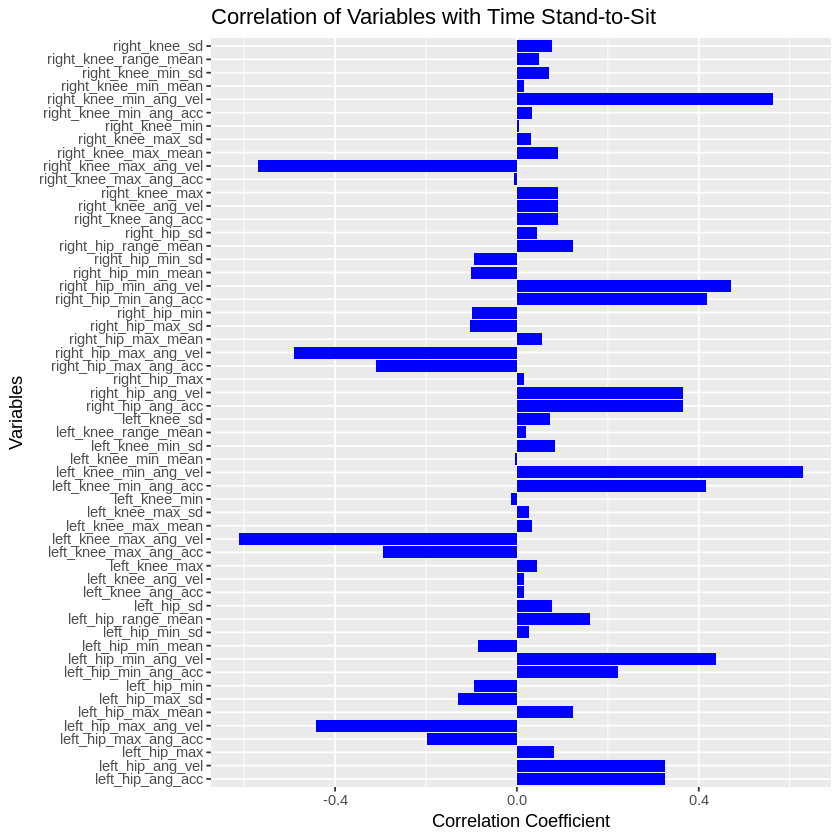

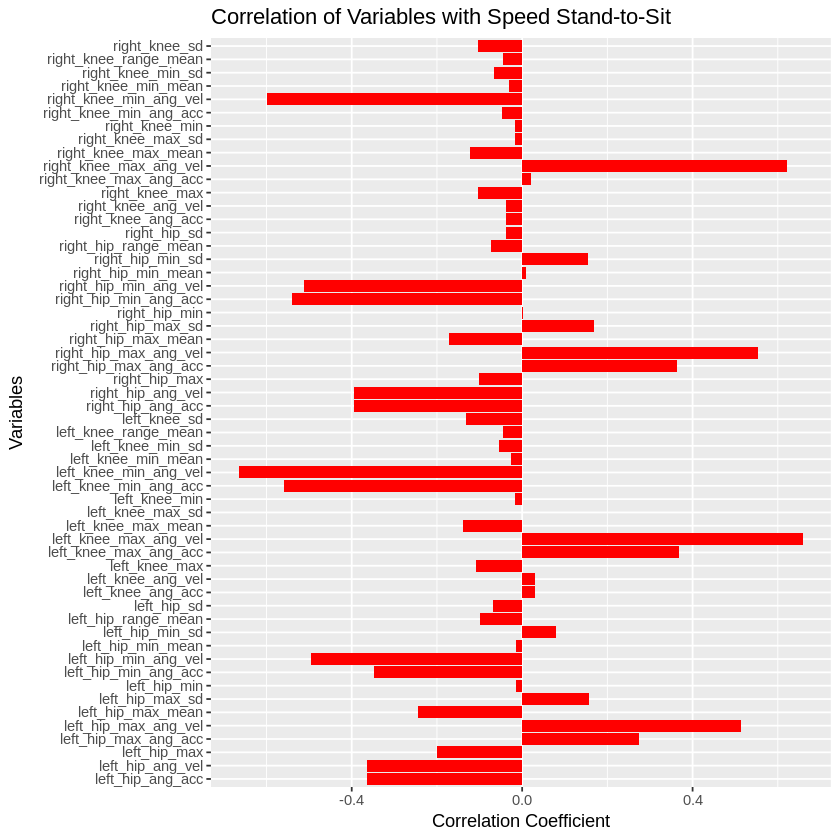

In [ ]:
# Create correlation plots
ggplot(cor_results, aes(x = Variable, y = Correlation_Time)) +
  geom_bar(stat = "identity", fill = "blue") +
  coord_flip() +
  ggtitle("Correlation of Variables with Time Stand-to-Sit") +
  xlab("Variables") +
  ylab("Correlation Coefficient")

ggplot(cor_results, aes(x = Variable, y = Correlation_Speed)) +
  geom_bar(stat = "identity", fill = "red") +
  coord_flip() +
  ggtitle("Correlation of Variables with Speed Stand-to-Sit") +
  xlab("Variables") +
  ylab("Correlation Coefficient")

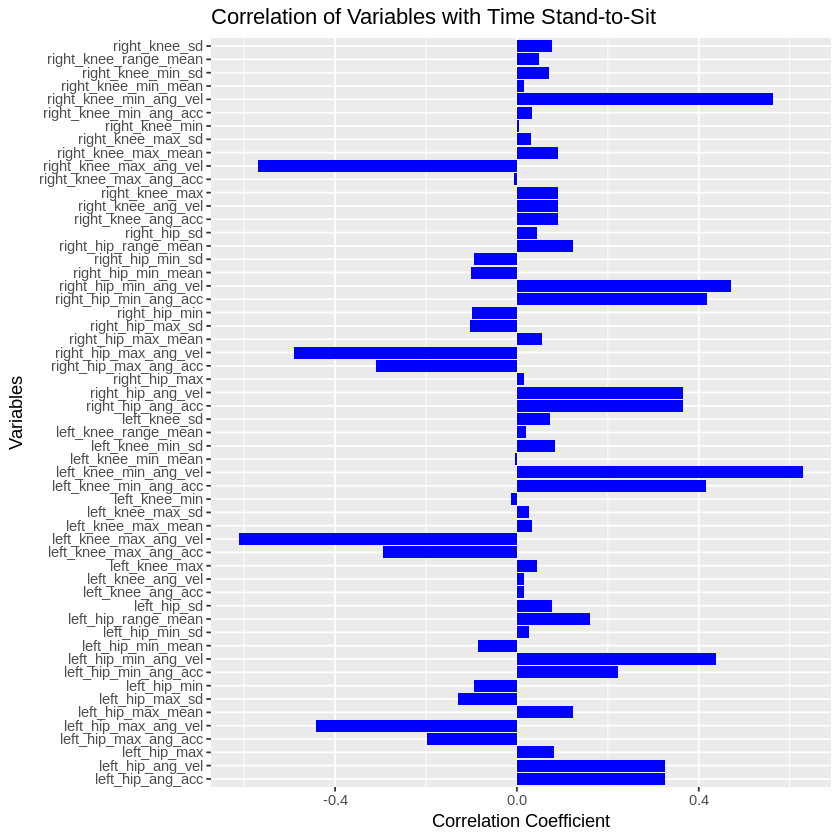

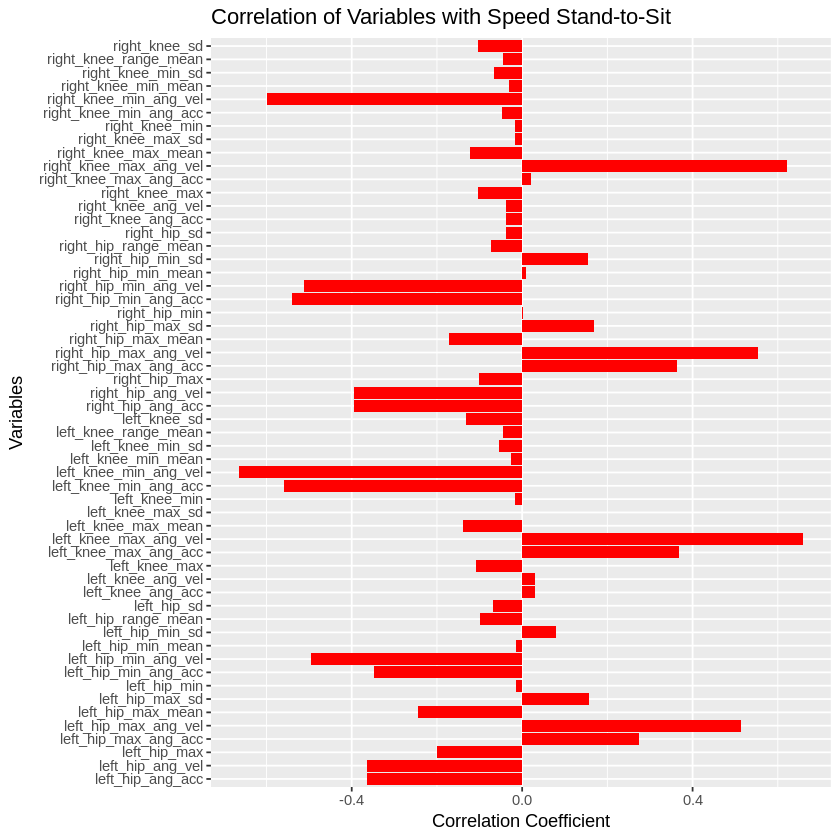

In [ ]:
# Create correlation plots

ggplot(cor_results, aes(x = Variable, y = Correlation_Time)) +
  geom_bar(stat = "identity", fill = "blue") +
  coord_flip() +
  ggtitle("Correlation of Variables with Time Stand-to-Sit") +
  xlab("Variables") +
  ylab("Correlation Coefficient")


ggplot(cor_results, aes(x = Variable, y = Correlation_Speed)) +
  geom_bar(stat = "identity", fill = "red") +
  coord_flip() +
  ggtitle("Correlation of Variables with Speed Stand-to-Sit") +
  xlab("Variables") +
  ylab("Correlation Coefficient")

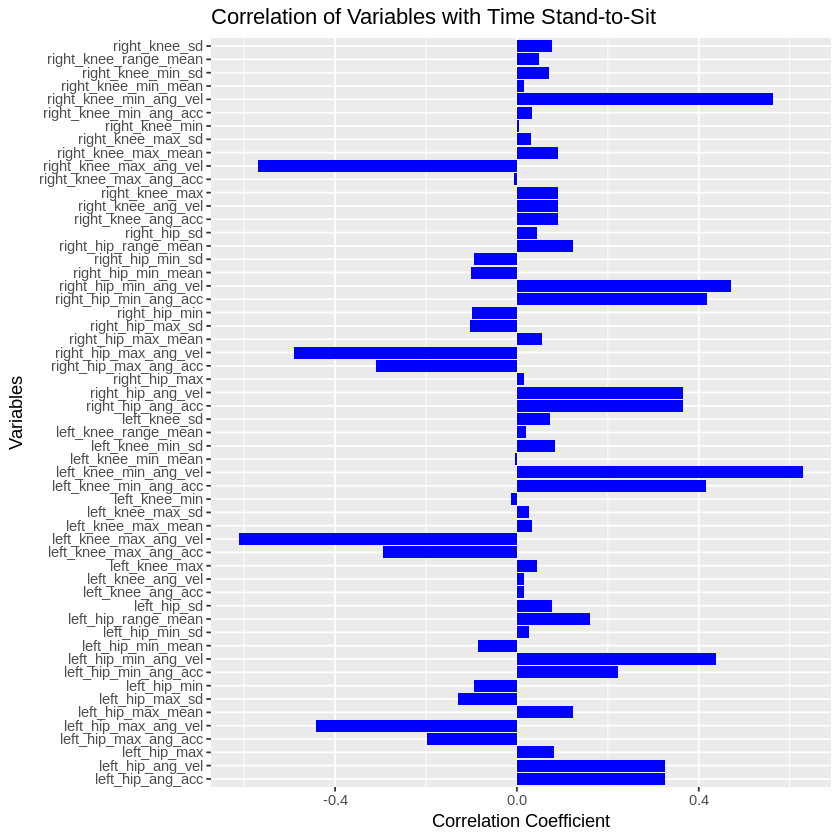

`geom_smooth()` using formula = 'y ~ x'


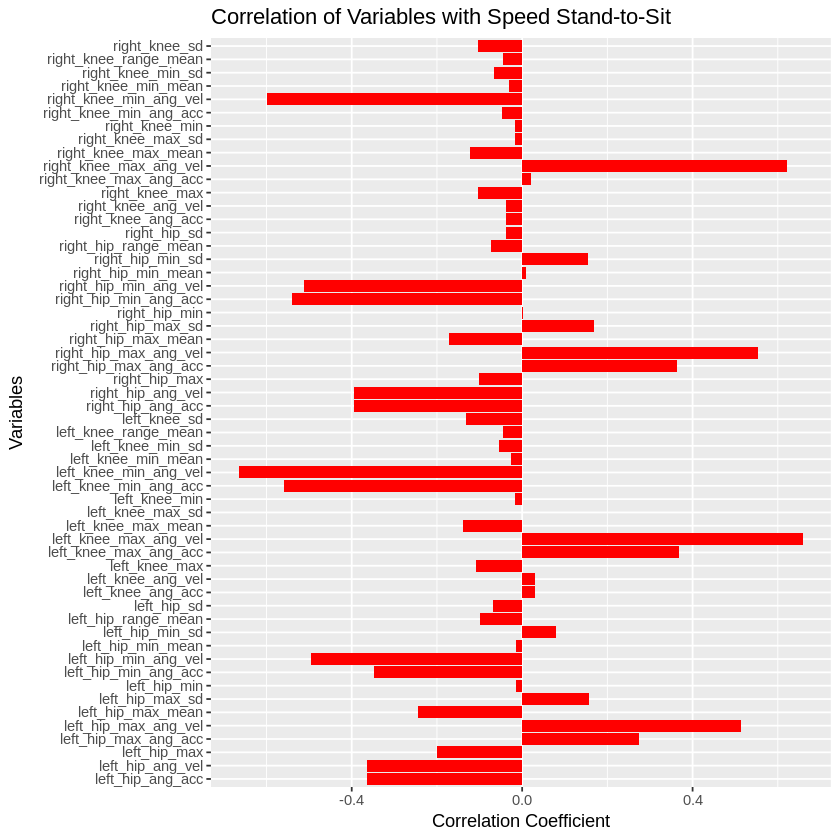

ERROR: Error in `[.data.frame`(data, , c("time_stand2si", "speed_stand2sit", : undefined columns selected


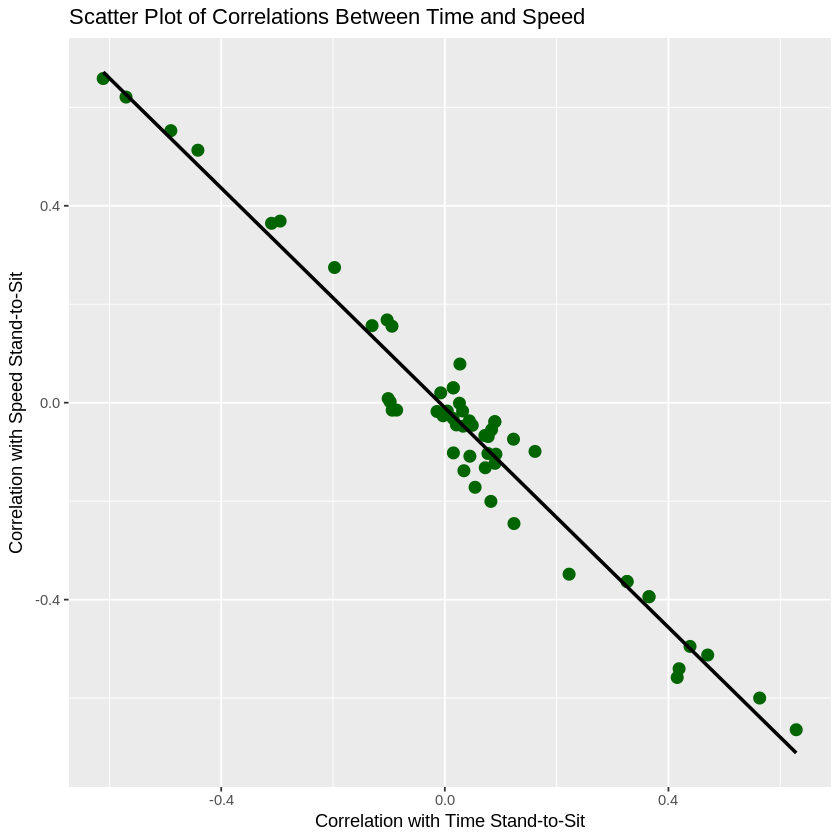

In [ ]:
# Bar plots
ggplot(cor_results, aes(x = Variable, y = Correlation_Time)) +
  geom_bar(stat = "identity", fill = "blue") +
  coord_flip() +
  ggtitle("Correlation of Variables with Time Stand-to-Sit") +
  xlab("Variables") +
  ylab("Correlation Coefficient")


ggplot(cor_results, aes(x = Variable, y = Correlation_Speed)) +
  geom_bar(stat = "identity", fill = "red") +
  coord_flip() +
  ggtitle("Correlation of Variables with Speed Stand-to-Sit") +
  xlab("Variables") +
  ylab("Correlation Coefficient")


# Scatter plot with trend lines
ggplot(cor_results, aes(x = Correlation_Time, y = Correlation_Speed)) +
  geom_point(color = "darkgreen", size = 3) +
  geom_smooth(method = "lm", color = "black", se = FALSE) +
  ggtitle("Scatter Plot of Correlations Between Time and Speed") +
  xlab("Correlation with Time Stand-to-Sit") +
  ylab("Correlation with Speed Stand-to-Sit")


# Heatmap of correlation values
library(reshape2)
cor_matrix <- cor(data[, c("time_stand2si", "speed_stand2sit", target_vars)], use = "complete.obs")
cor_melt <- melt(cor_matrix)
ggplot(cor_melt, aes(Var1, Var2, fill = value)) +
  geom_tile() +
  scale_fill_gradient2(low = "blue", high = "red", mid = "white", midpoint = 0) +
  theme(axis.text.x = element_text(angle = 90, hjust = 1)) +
  ggtitle("Heatmap of Correlation Coefficients")

In [ ]:
# Create correlation plots

# Bar plots
ggplot(cor_results, aes(x = Variable, y = Correlation_Time, fill = Time_Correlation_Category)) +
  geom_bar(stat = "identity") +
  coord_flip() +
  ggtitle("Categorized Correlation of Variables with Time Stand-to-Sit") +
  xlab("Variables") +
  ylab("Correlation Coefficient") +
  scale_fill_brewer(palette = "Blues")


ggplot(cor_results, aes(x = Variable, y = Correlation_Speed, fill = Speed_Correlation_Category)) +
  geom_bar(stat = "identity") +
  coord_flip() +
  ggtitle("Categorized Correlation of Variables with Speed Stand-to-Sit") +
  xlab("Variables") +
  ylab("Correlation Coefficient") +
  scale_fill_brewer(palette = "Reds")


# Scatter plot with trend lines
ggplot(cor_results, aes(x = Correlation_Time, y = Correlation_Speed, color = Time_Correlation_Category)) +
  geom_point(size = 3) +
  geom_smooth(method = "lm", color = "black", se = FALSE) +
  ggtitle("Scatter Plot of Categorized Correlations Between Time and Speed") +
  xlab("Correlation with Time Stand-to-Sit") +
  ylab("Correlation with Speed Stand-to-Sit") +
  scale_color_brewer(palette = "Set1")


# Heatmap of correlation values
library(reshape2)
cor_matrix <- cor(data[, c("time_stand2si", "speed_stand2sit", target_vars)], use = "complete.obs")
cor_melt <- melt(cor_matrix)
ggplot(cor_melt, aes(Var1, Var2, fill = value)) +
  geom_tile() +
  scale_fill_gradient2(low = "blue", high = "red", mid = "white", midpoint = 0) +
  theme(axis.text.x = element_text(angle = 90, hjust = 1)) +
  ggtitle("Heatmap of Categorized Correlation Coefficients")

ERROR while rich displaying an object: Error in `geom_bar()`:
! Problem while computing aesthetics.
ℹ Error occurred in the 1st layer.
Caused by error:
! object 'Time_Correlation_Category' not found

Traceback:
1. sapply(x, f, simplify = simplify)
2. lapply(X = X, FUN = FUN, ...)
3. FUN(X[[i]], ...)
4. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
5. tryCatchList(expr, classes, parentenv, handlers)
6. tryCatchOne(expr, names, parentenv, handlers[[1L]])
7. doTryCatch(return(expr), name, parentenv, handler)
8. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (

ERROR: Error in `[.data.frame`(data, , c("time_stand2si", "speed_stand2sit", : undefined columns selected


                 Variable Correlation_Time Correlation_Speed
1    left_knee_range_mean      0.020676027      -0.045143661
2            left_knee_sd      0.072333347      -0.132136559
3           left_knee_max      0.044817888      -0.108729969
4           left_knee_min     -0.013969628      -0.017911879
5      left_knee_max_mean      0.034112608      -0.138229709
6      left_knee_min_mean     -0.003278366      -0.026650762
7        left_knee_max_sd      0.026121255      -0.001070435
8        left_knee_min_sd      0.083631733      -0.054957712
9       left_knee_ang_vel      0.015130615       0.030179162
10      left_knee_ang_acc      0.015130615       0.030179162
11  left_knee_max_ang_vel     -0.611134444       0.658415422
12  left_knee_max_ang_acc     -0.294694084       0.368835624
13  left_knee_min_ang_vel      0.628597683      -0.664327507
14  left_knee_min_ang_acc      0.415703946      -0.558173766
15  right_knee_range_mean      0.049111748      -0.046007671
16          right_knee_s



|Variable               | Correlation_Time| Correlation_Speed|Time_Correlation_Category     |Speed_Correlation_Category    |
|:----------------------|----------------:|-----------------:|:-----------------------------|:-----------------------------|
|left_knee_range_mean   |        0.0206760|        -0.0451437|Weak or no correlation        |Weak or no correlation        |
|left_knee_sd           |        0.0723333|        -0.1321366|Weak or no correlation        |Weak or no correlation        |
|left_knee_max          |        0.0448179|        -0.1087300|Weak or no correlation        |Weak or no correlation        |
|left_knee_min          |       -0.0139696|        -0.0179119|Weak or no correlation        |Weak or no correlation        |
|left_knee_max_mean     |        0.0341126|        -0.1382297|Weak or no correlation        |Weak or no correlation        |
|left_knee_min_mean     |       -0.0032784|        -0.0266508|Weak or no correlation        |Weak or no correlation        

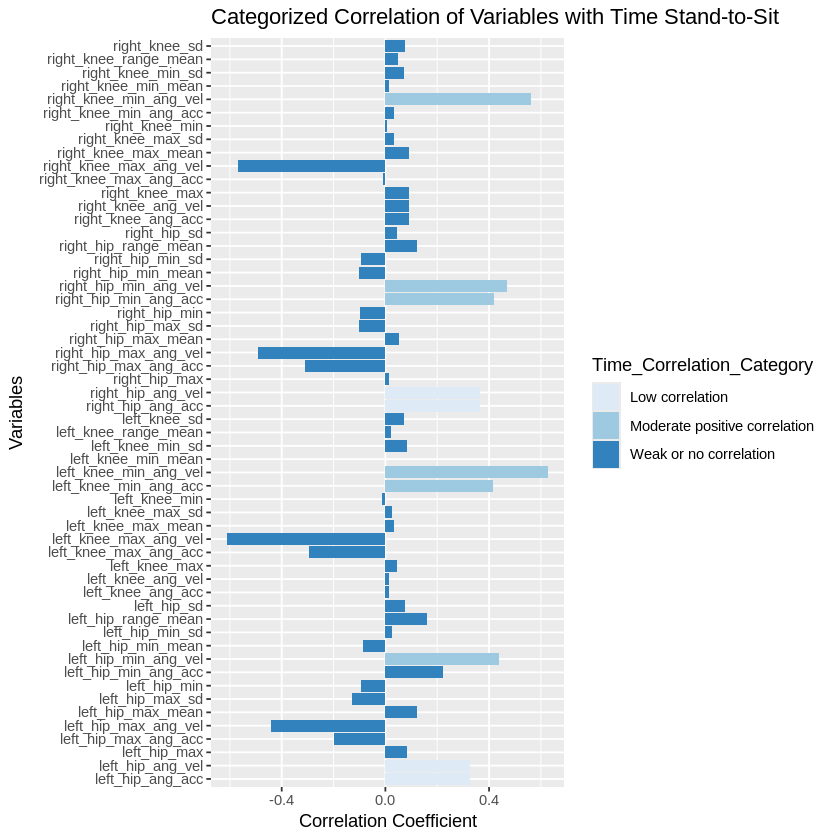

`geom_smooth()` using formula = 'y ~ x'


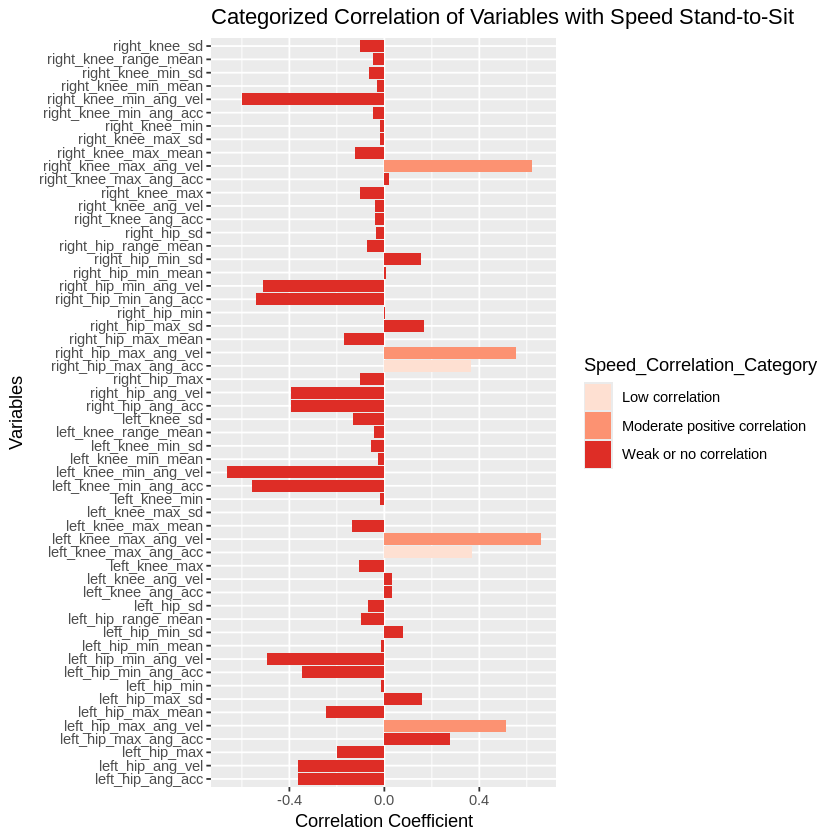

ERROR: Error in `[.data.frame`(data, , c("time_stand2si", "speed_stand2sit", : undefined columns selected


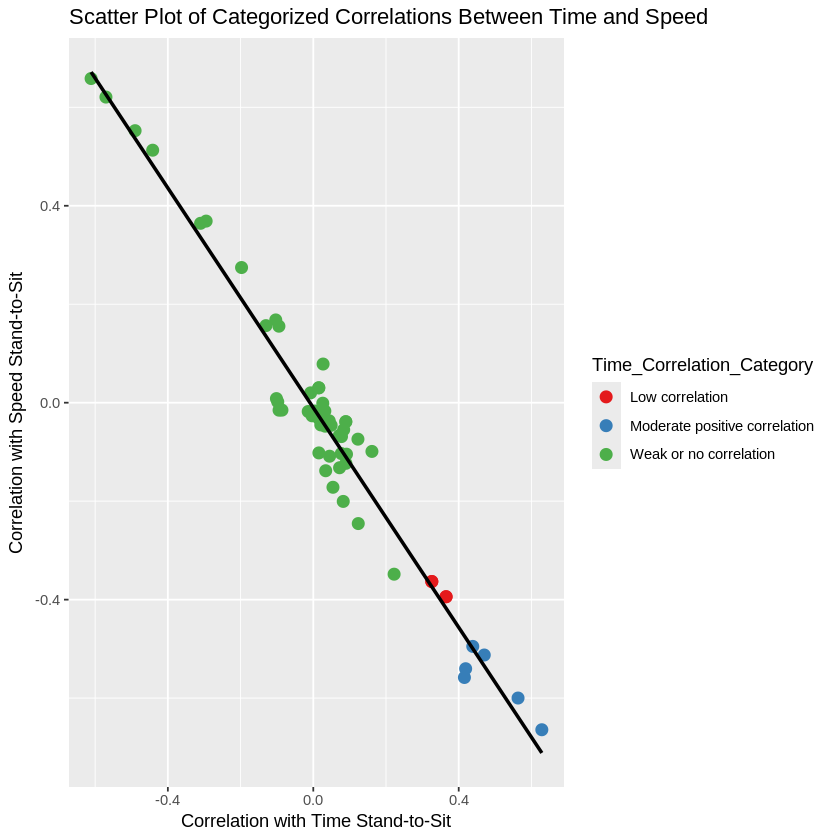

In [ ]:
# Load necessary library

library(dplyr)

library(ggplot2)

library(knitr)


# Load the dataset

data <- read.csv("dataClean.csv")


# Define the variables

target_vars <- c("left_knee_range_mean", "left_knee_sd", "left_knee_max", "left_knee_min",
                 "left_knee_max_mean", "left_knee_min_mean", "left_knee_max_sd", "left_knee_min_sd",
                 "left_knee_ang_vel", "left_knee_ang_acc", "left_knee_max_ang_vel", "left_knee_max_ang_acc",
                 "left_knee_min_ang_vel", "left_knee_min_ang_acc", "right_knee_range_mean", "right_knee_sd",
                 "right_knee_max", "right_knee_min", "right_knee_max_mean", "right_knee_min_mean", "right_knee_max_sd",
                 "right_knee_min_sd", "right_knee_ang_vel", "right_knee_ang_acc", "right_knee_max_ang_vel", "right_knee_max_ang_acc",
                 "right_knee_min_ang_vel", "right_knee_min_ang_acc", "left_hip_range_mean", "left_hip_sd", "left_hip_max", "left_hip_min",
                 "left_hip_max_mean", "left_hip_min_mean", "left_hip_max_sd", "left_hip_min_sd", "left_hip_ang_vel", "left_hip_ang_acc",
                 "left_hip_max_ang_vel", "left_hip_max_ang_acc", "left_hip_min_ang_vel", "left_hip_min_ang_acc", "right_hip_range_mean", "right_hip_sd",
                 "right_hip_max", "right_hip_min", "right_hip_max_mean", "right_hip_min_mean", "right_hip_max_sd", "right_hip_min_sd", "right_hip_ang_vel",
                 "right_hip_ang_acc", "right_hip_max_ang_vel", "right_hip_max_ang_acc", "right_hip_min_ang_vel", "right_hip_min_ang_acc") # Add more variables as needed


# Compute correlations independently

cor_results <- data.frame(Variable = character(), Correlation_Time = numeric(), Correlation_Speed = numeric(), stringsAsFactors = FALSE)

for (var in target_vars) {
  if (var %in% names(data)) {
    cor_time <- cor(data$time_stand2si, data[[var]], use = "complete.obs")
    cor_speed <- cor(data$speed_stand2sit, data[[var]], use = "complete.obs")
    cor_results <- rbind(cor_results, data.frame(Variable = var, Correlation_Time = cor_time, Correlation_Speed = cor_speed))
  }
}


# Categorize correlations
cor_results <- cor_results %>%
  mutate(Time_Correlation_Category = case_when(
    Correlation_Time >= 0.8 ~ "Very strong positive correlation",
    Correlation_Time >= 0.7 ~ "Strong positive correlation",
    Correlation_Time >= 0.4 ~ "Moderate positive correlation",
    Correlation_Time >= 0.3 ~ "Low correlation",
    TRUE ~ "Weak or no correlation"
  ),
  Speed_Correlation_Category = case_when(
    Correlation_Speed >= 0.8 ~ "Very strong positive correlation",
    Correlation_Speed >= 0.7 ~ "Strong positive correlation",
    Correlation_Speed >= 0.4 ~ "Moderate positive correlation",
    Correlation_Speed >= 0.3 ~ "Low correlation",
    TRUE ~ "Weak or no correlation"
  ))


# Print the categorized correlation results as a table

print(cor_results)
kable(cor_results, format = "markdown")


# Create correlation plots

# Bar plots
ggplot(cor_results, aes(x = Variable, y = Correlation_Time, fill = Time_Correlation_Category)) +
  geom_bar(stat = "identity") +
  coord_flip() +
  ggtitle("Categorized Correlation of Variables with Time Stand-to-Sit") +
  xlab("Variables") +
  ylab("Correlation Coefficient") +
  scale_fill_brewer(palette = "Blues")


ggplot(cor_results, aes(x = Variable, y = Correlation_Speed, fill = Speed_Correlation_Category)) +
  geom_bar(stat = "identity") +
  coord_flip() +
  ggtitle("Categorized Correlation of Variables with Speed Stand-to-Sit") +
  xlab("Variables") +
  ylab("Correlation Coefficient") +
  scale_fill_brewer(palette = "Reds")


# Scatter plot with trend lines
ggplot(cor_results, aes(x = Correlation_Time, y = Correlation_Speed, color = Time_Correlation_Category)) +
  geom_point(size = 3) +
  geom_smooth(method = "lm", color = "black", se = FALSE) +
  ggtitle("Scatter Plot of Categorized Correlations Between Time and Speed") +
  xlab("Correlation with Time Stand-to-Sit") +
  ylab("Correlation with Speed Stand-to-Sit") +
  scale_color_brewer(palette = "Set1")


# Heatmap of correlation values
library(reshape2)
cor_matrix <- cor(data[, c("time_stand2si", "speed_stand2sit", target_vars)], use = "complete.obs")
cor_melt <- melt(cor_matrix)
ggplot(cor_melt, aes(Var1, Var2, fill = value)) +
  geom_tile() +
  scale_fill_gradient2(low = "blue", high = "red", mid = "white", midpoint = 0) +
  theme(axis.text.x = element_text(angle = 90, hjust = 1)) +
  ggtitle("Heatmap of Categorized Correlation Coefficients")


In [ ]:
# Compute correlations independently

cor_results <- data.frame(Variable = character(), Correlation_Time = numeric(), Correlation_Speed = numeric(), stringsAsFactors = FALSE)

for (var in target_vars) {
  if (var %in% names(data)) {
    cor_time <- cor(data$time_stand2si, data[[var]], use = "complete.obs")
    cor_speed <- cor(data$speed_stand2sit, data[[var]], use = "complete.obs")
    cor_results <- rbind(cor_results, data.frame(Variable = var, Correlation_Time = cor_time, Correlation_Speed = cor_speed))
  }
}


# Filter moderate to high correlations
moderate_high_correlation <- cor_results %>%
  filter(Correlation_Time >= 0.4 | Correlation_Speed >= 0.4)

# Print the moderate to high correlation results
print(moderate_high_correlation)
kable(moderate_high_correlation, format = "markdown")

                 Variable Correlation_Time Correlation_Speed
1   left_knee_max_ang_vel       -0.6111344         0.6584154
2   left_knee_min_ang_vel        0.6285977        -0.6643275
3   left_knee_min_ang_acc        0.4157039        -0.5581738
4  right_knee_max_ang_vel       -0.5702960         0.6207459
5  right_knee_min_ang_vel        0.5631982        -0.5999279
6    left_hip_max_ang_vel       -0.4417692         0.5128332
7    left_hip_min_ang_vel        0.4386399        -0.4950487
8   right_hip_max_ang_vel       -0.4901355         0.5524853
9   right_hip_min_ang_vel        0.4702625        -0.5125358
10  right_hip_min_ang_acc        0.4190767        -0.5403876




|Variable               | Correlation_Time| Correlation_Speed|
|:----------------------|----------------:|-----------------:|
|left_knee_max_ang_vel  |       -0.6111344|         0.6584154|
|left_knee_min_ang_vel  |        0.6285977|        -0.6643275|
|left_knee_min_ang_acc  |        0.4157039|        -0.5581738|
|right_knee_max_ang_vel |       -0.5702960|         0.6207459|
|right_knee_min_ang_vel |        0.5631982|        -0.5999279|
|left_hip_max_ang_vel   |       -0.4417692|         0.5128332|
|left_hip_min_ang_vel   |        0.4386399|        -0.4950487|
|right_hip_max_ang_vel  |       -0.4901355|         0.5524853|
|right_hip_min_ang_vel  |        0.4702625|        -0.5125358|
|right_hip_min_ang_acc  |        0.4190767|        -0.5403876|

In [ ]:
# Filter high correlations (≥ 0.7)
high_correlation <- cor_results %>%
  filter(Correlation_Time >= 0.7 | Correlation_Speed >= 0.7)

# Print the high correlation results
print(high_correlation)
kable(high_correlation, format = "markdown")


[1] Variable          Correlation_Time  Correlation_Speed
<0 rows> (or 0-length row.names)




|Variable | Correlation_Time| Correlation_Speed|
|:--------|----------------:|-----------------:|

In [ ]:
# Filter moderate to high correlations
moderate_high_correlation <- cor_results %>%
  filter(Correlation_Time >= 0.4 | Correlation_Speed >= 0.4)

# Print the moderate to high correlation results
print(moderate_high_correlation)
kable(moderate_high_correlation, format = "markdown")

# Export the results to a CSV file
write.csv(moderate_high_correlation, "moderate_high_correlation_results.csv", row.names = FALSE)

                 Variable Correlation_Time Correlation_Speed
1   left_knee_max_ang_vel       -0.6111344         0.6584154
2   left_knee_min_ang_vel        0.6285977        -0.6643275
3   left_knee_min_ang_acc        0.4157039        -0.5581738
4  right_knee_max_ang_vel       -0.5702960         0.6207459
5  right_knee_min_ang_vel        0.5631982        -0.5999279
6    left_hip_max_ang_vel       -0.4417692         0.5128332
7    left_hip_min_ang_vel        0.4386399        -0.4950487
8   right_hip_max_ang_vel       -0.4901355         0.5524853
9   right_hip_min_ang_vel        0.4702625        -0.5125358
10  right_hip_min_ang_acc        0.4190767        -0.5403876




|Variable               | Correlation_Time| Correlation_Speed|
|:----------------------|----------------:|-----------------:|
|left_knee_max_ang_vel  |       -0.6111344|         0.6584154|
|left_knee_min_ang_vel  |        0.6285977|        -0.6643275|
|left_knee_min_ang_acc  |        0.4157039|        -0.5581738|
|right_knee_max_ang_vel |       -0.5702960|         0.6207459|
|right_knee_min_ang_vel |        0.5631982|        -0.5999279|
|left_hip_max_ang_vel   |       -0.4417692|         0.5128332|
|left_hip_min_ang_vel   |        0.4386399|        -0.4950487|
|right_hip_max_ang_vel  |       -0.4901355|         0.5524853|
|right_hip_min_ang_vel  |        0.4702625|        -0.5125358|
|right_hip_min_ang_acc  |        0.4190767|        -0.5403876|

now with trunk angles

In [ ]:
# Load necessary library

library(dplyr)

library(ggplot2)

library(knitr)


# Load the dataset

data <- read.csv("dataClean.csv")


# Define the variables

target_vars <- c("left_knee_range_mean", "left_knee_sd", "left_knee_max", "left_knee_min",
                 "left_knee_max_mean", "left_knee_min_mean", "left_knee_max_sd", "left_knee_min_sd",
                 "left_knee_ang_vel", "left_knee_ang_acc", "left_knee_max_ang_vel", "left_knee_max_ang_acc",
                 "left_knee_min_ang_vel", "left_knee_min_ang_acc", "right_knee_range_mean", "right_knee_sd",
                 "right_knee_max", "right_knee_min", "right_knee_max_mean", "right_knee_min_mean", "right_knee_max_sd",
                 "right_knee_min_sd", "right_knee_ang_vel", "right_knee_ang_acc", "right_knee_max_ang_vel", "right_knee_max_ang_acc",
                 "right_knee_min_ang_vel", "right_knee_min_ang_acc", "left_hip_range_mean", "left_hip_sd", "left_hip_max", "left_hip_min",
                 "left_hip_max_mean", "left_hip_min_mean", "left_hip_max_sd", "left_hip_min_sd", "left_hip_ang_vel", "left_hip_ang_acc",
                 "left_hip_max_ang_vel", "left_hip_max_ang_acc", "left_hip_min_ang_vel", "left_hip_min_ang_acc", "right_hip_range_mean", "right_hip_sd",
                 "right_hip_max", "right_hip_min", "right_hip_max_mean", "right_hip_min_mean", "right_hip_max_sd", "right_hip_min_sd", "right_hip_ang_vel",
                 "right_hip_ang_acc", "right_hip_max_ang_vel", "right_hip_max_ang_acc", "right_hip_min_ang_vel", "right_hip_min_ang_acc",
                 "trunk_lean_range_mean", "trunk_lean_sd", "trunk_lean_max", "trunk_lean_min", "trunk_lean_max_mean", "trunk_lean_min_mean",
                 "trunk_lean_max_sd", "trunk_lean_min_sd", "trunk_lean_ang_vel", "trunk_lean_ang_acc", "trunk_lean_max_ang_vel",
                 "trunk_lean_max_ang_acc", "trunk_lean_min_ang_vel", "trunk_lean_min_ang_acc") # Added trunk and ankle angle variables


# Compute correlations independently

cor_results <- data.frame(Variable = character(), Correlation_Time = numeric(), Correlation_Speed = numeric(), stringsAsFactors = FALSE)

for (var in target_vars) {
  if (var %in% names(data)) {
    cor_time <- cor(data$time_stand2si, data[[var]], use = "complete.obs")
    cor_speed <- cor(data$speed_stand2sit, data[[var]], use = "complete.obs")
    cor_results <- rbind(cor_results, data.frame(Variable = var, Correlation_Time = cor_time, Correlation_Speed = cor_speed))
  }
}


# Filter moderate to high correlations
moderate_high_correlation <- cor_results %>%
  filter(Correlation_Time >= 0.4 | Correlation_Speed >= 0.4)

# Print the moderate to high correlation results
print(moderate_high_correlation)
kable(moderate_high_correlation, format = "markdown")

# Export the results to a CSV file
write.csv(moderate_high_correlation, "moderate_high_correlation_results.csv", row.names = FALSE)


Warning message in file(file, "rt"):
“cannot open file 'dataClean.csv': No such file or directory”


ERROR: Error in file(file, "rt"): cannot open the connection


                 Variable Correlation_Time Correlation_Speed
1   left_knee_max_ang_vel       -0.6111344         0.6584154
2   left_knee_min_ang_vel        0.6285977        -0.6643275
3   left_knee_min_ang_acc        0.4157039        -0.5581738
4  right_knee_max_ang_vel       -0.5702960         0.6207459
5  right_knee_min_ang_vel        0.5631982        -0.5999279
6    left_hip_max_ang_vel       -0.4417692         0.5128332
7    left_hip_min_ang_vel        0.4386399        -0.4950487
8   right_hip_max_ang_vel       -0.4901355         0.5524853
9   right_hip_min_ang_vel        0.4702625        -0.5125358
10  right_hip_min_ang_acc        0.4190767        -0.5403876
11  trunk_lean_range_mean        0.4117055        -0.2466863
12          trunk_lean_sd        0.4249463        -0.2470616
13     trunk_lean_ang_vel       -0.3421961         0.5141931
14     trunk_lean_ang_acc       -0.3421961         0.5141931




|Variable               | Correlation_Time| Correlation_Speed|
|:----------------------|----------------:|-----------------:|
|left_knee_max_ang_vel  |       -0.6111344|         0.6584154|
|left_knee_min_ang_vel  |        0.6285977|        -0.6643275|
|left_knee_min_ang_acc  |        0.4157039|        -0.5581738|
|right_knee_max_ang_vel |       -0.5702960|         0.6207459|
|right_knee_min_ang_vel |        0.5631982|        -0.5999279|
|left_hip_max_ang_vel   |       -0.4417692|         0.5128332|
|left_hip_min_ang_vel   |        0.4386399|        -0.4950487|
|right_hip_max_ang_vel  |       -0.4901355|         0.5524853|
|right_hip_min_ang_vel  |        0.4702625|        -0.5125358|
|right_hip_min_ang_acc  |        0.4190767|        -0.5403876|
|trunk_lean_range_mean  |        0.4117055|        -0.2466863|
|trunk_lean_sd          |        0.4249463|        -0.2470616|
|trunk_lean_ang_vel     |       -0.3421961|         0.5141931|
|trunk_lean_ang_acc     |       -0.3421961|         0

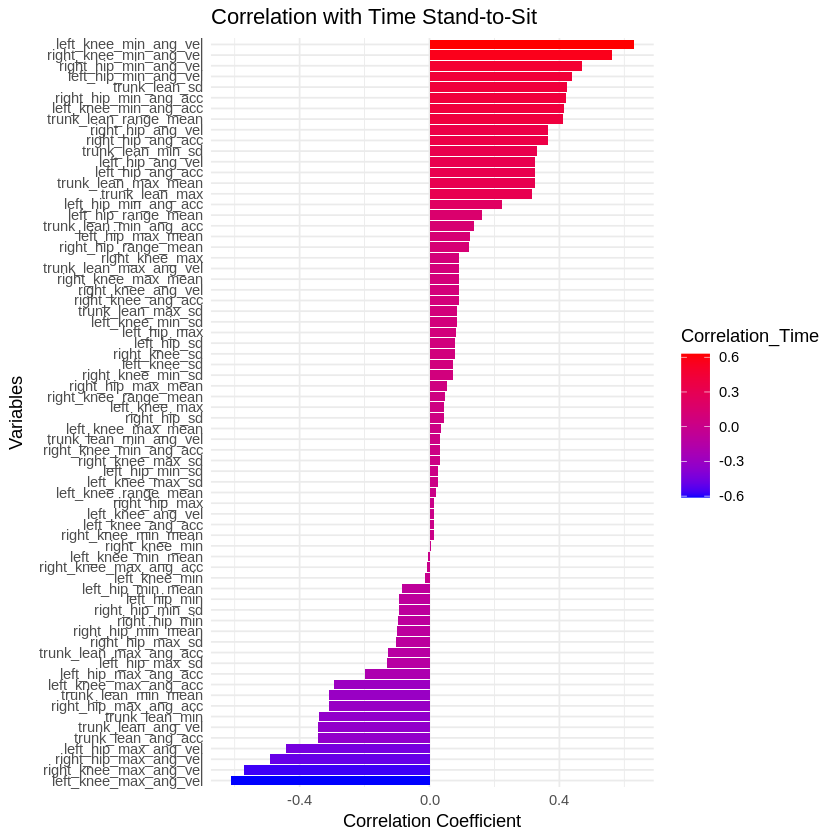

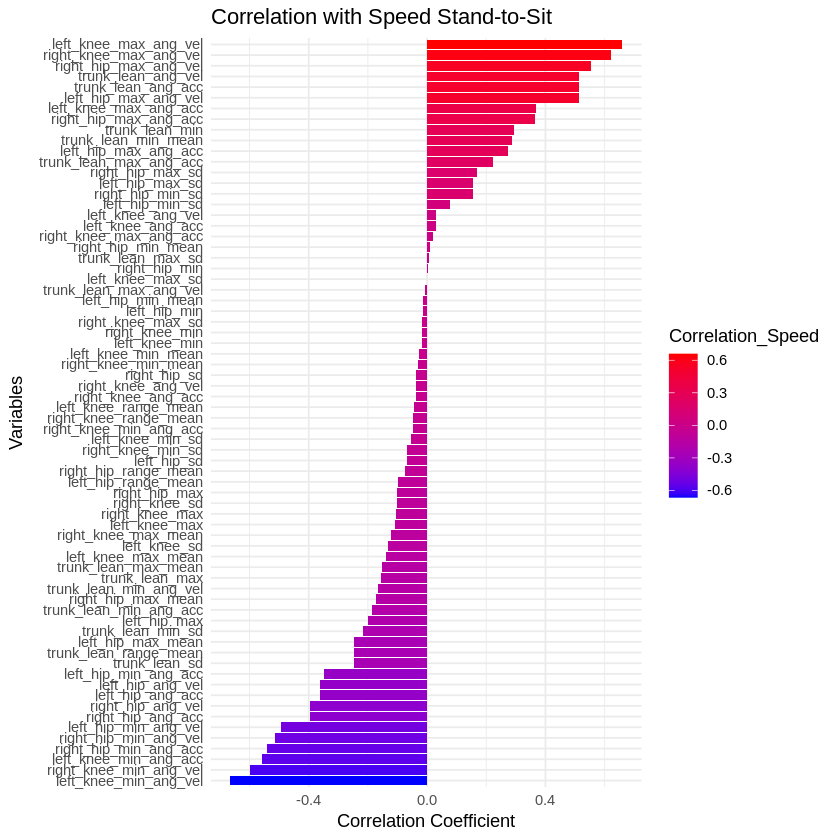

ERROR: Error in `[.data.frame`(data, , c("time_stand2si", "speed_stand2sit", : undefined columns selected


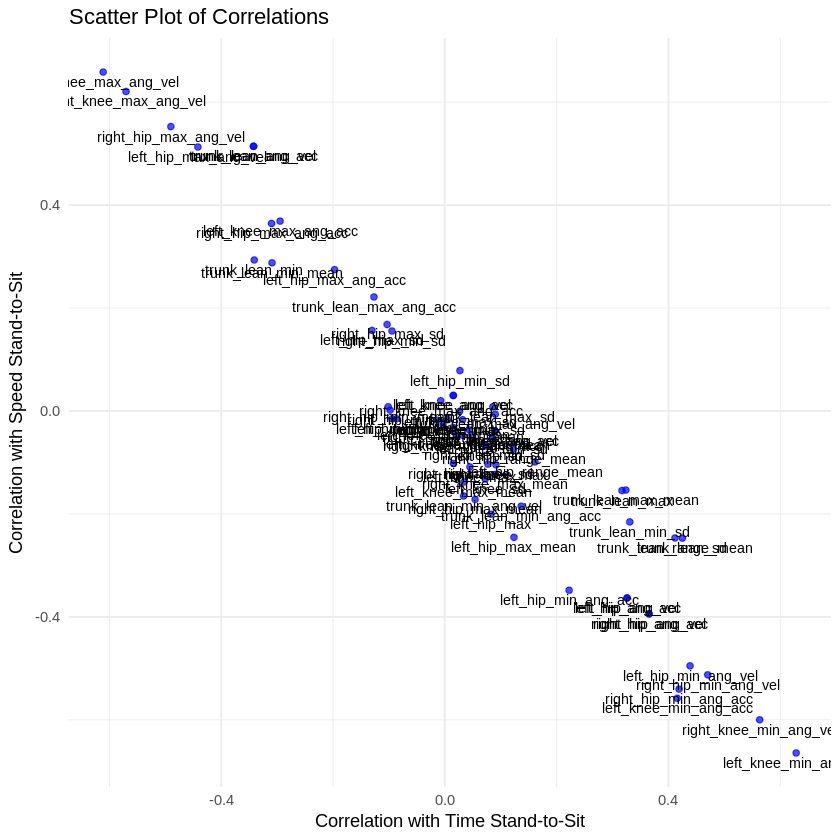

In [ ]:
# Load necessary library

library(dplyr)

library(ggplot2)

library(knitr)


# Load the dataset

data <- read.csv("dataClean.csv")


# Define the variables

target_vars <- c("left_knee_range_mean", "left_knee_sd", "left_knee_max", "left_knee_min",
                 "left_knee_max_mean", "left_knee_min_mean", "left_knee_max_sd", "left_knee_min_sd",
                 "left_knee_ang_vel", "left_knee_ang_acc", "left_knee_max_ang_vel", "left_knee_max_ang_acc",
                 "left_knee_min_ang_vel", "left_knee_min_ang_acc", "right_knee_range_mean", "right_knee_sd",
                 "right_knee_max", "right_knee_min", "right_knee_max_mean", "right_knee_min_mean", "right_knee_max_sd",
                 "right_knee_min_sd", "right_knee_ang_vel", "right_knee_ang_acc", "right_knee_max_ang_vel", "right_knee_max_ang_acc",
                 "right_knee_min_ang_vel", "right_knee_min_ang_acc", "left_hip_range_mean", "left_hip_sd", "left_hip_max", "left_hip_min",
                 "left_hip_max_mean", "left_hip_min_mean", "left_hip_max_sd", "left_hip_min_sd", "left_hip_ang_vel", "left_hip_ang_acc",
                 "left_hip_max_ang_vel", "left_hip_max_ang_acc", "left_hip_min_ang_vel", "left_hip_min_ang_acc", "right_hip_range_mean", "right_hip_sd",
                 "right_hip_max", "right_hip_min", "right_hip_max_mean", "right_hip_min_mean", "right_hip_max_sd", "right_hip_min_sd", "right_hip_ang_vel",
                 "right_hip_ang_acc", "right_hip_max_ang_vel", "right_hip_max_ang_acc", "right_hip_min_ang_vel", "right_hip_min_ang_acc",
                 "trunk_lean_range_mean", "trunk_lean_sd", "trunk_lean_max", "trunk_lean_min", "trunk_lean_max_mean", "trunk_lean_min_mean",
                 "trunk_lean_max_sd", "trunk_lean_min_sd", "trunk_lean_ang_vel", "trunk_lean_ang_acc", "trunk_lean_max_ang_vel",
                 "trunk_lean_max_ang_acc", "trunk_lean_min_ang_vel", "trunk_lean_min_ang_acc")


# Compute correlations independently

cor_results <- data.frame(Variable = character(), Correlation_Time = numeric(), Correlation_Speed = numeric(), stringsAsFactors = FALSE)

for (var in target_vars) {
  if (var %in% names(data)) {
    cor_time <- cor(data$time_stand2si, data[[var]], use = "complete.obs")
    cor_speed <- cor(data$speed_stand2sit, data[[var]], use = "complete.obs")
    cor_results <- rbind(cor_results, data.frame(Variable = var, Correlation_Time = cor_time, Correlation_Speed = cor_speed))
  }
}


# Filter moderate to high correlations
moderate_high_correlation <- cor_results %>%
  filter(Correlation_Time >= 0.4 | Correlation_Speed >= 0.4)

# Print the moderate to high correlation results
print(moderate_high_correlation)
kable(moderate_high_correlation, format = "markdown")

# Export the results to a CSV file
write.csv(moderate_high_correlation, "moderate_high_correlation_results.csv", row.names = FALSE)


# Create correlation plots

# Bar plot for correlation with time_stand2si
ggplot(cor_results, aes(x = reorder(Variable, Correlation_Time), y = Correlation_Time, fill = Correlation_Time)) +
  geom_bar(stat = "identity") +
  coord_flip() +
  theme_minimal() +
  labs(title = "Correlation with Time Stand-to-Sit", x = "Variables", y = "Correlation Coefficient") +
  scale_fill_gradient(low = "blue", high = "red")


# Bar plot for correlation with speed_stand2sit
ggplot(cor_results, aes(x = reorder(Variable, Correlation_Speed), y = Correlation_Speed, fill = Correlation_Speed)) +
  geom_bar(stat = "identity") +
  coord_flip() +
  theme_minimal() +
  labs(title = "Correlation with Speed Stand-to-Sit", x = "Variables", y = "Correlation Coefficient") +
  scale_fill_gradient(low = "blue", high = "red")


# Scatter plot to compare both correlations
ggplot(cor_results, aes(x = Correlation_Time, y = Correlation_Speed, label = Variable)) +
  geom_point(color = "blue", alpha = 0.7) +
  geom_text(size = 3, vjust = 1.5) +
  theme_minimal() +
  labs(title = "Scatter Plot of Correlations", x = "Correlation with Time Stand-to-Sit", y = "Correlation with Speed Stand-to-Sit")


# Heatmap of correlation values
library(reshape2)
cor_matrix <- cor(data[, c("time_stand2si", "speed_stand2sit", target_vars)], use = "complete.obs")
cor_melt <- melt(cor_matrix)
ggplot(cor_melt, aes(Var1, Var2, fill = value)) +
  geom_tile() +
  scale_fill_gradient2(low = "blue", high = "red", mid = "white", midpoint = 0) +
  theme(axis.text.x = element_text(angle = 90, hjust = 1)) +
  labs(title = "Heatmap of Correlation Coefficients", x = "Variables", y = "Variables")


                 Variable Correlation_Time Correlation_Speed
1   left_knee_max_ang_vel       -0.6111344         0.6584154
2   left_knee_min_ang_vel        0.6285977        -0.6643275
3   left_knee_min_ang_acc        0.4157039        -0.5581738
4  right_knee_max_ang_vel       -0.5702960         0.6207459
5  right_knee_min_ang_vel        0.5631982        -0.5999279
6    left_hip_max_ang_vel       -0.4417692         0.5128332
7    left_hip_min_ang_vel        0.4386399        -0.4950487
8   right_hip_max_ang_vel       -0.4901355         0.5524853
9   right_hip_min_ang_vel        0.4702625        -0.5125358
10  right_hip_min_ang_acc        0.4190767        -0.5403876
11  trunk_lean_range_mean        0.4117055        -0.2466863
12          trunk_lean_sd        0.4249463        -0.2470616
13     trunk_lean_ang_vel       -0.3421961         0.5141931
14     trunk_lean_ang_acc       -0.3421961         0.5141931




|Variable               | Correlation_Time| Correlation_Speed|
|:----------------------|----------------:|-----------------:|
|left_knee_max_ang_vel  |       -0.6111344|         0.6584154|
|left_knee_min_ang_vel  |        0.6285977|        -0.6643275|
|left_knee_min_ang_acc  |        0.4157039|        -0.5581738|
|right_knee_max_ang_vel |       -0.5702960|         0.6207459|
|right_knee_min_ang_vel |        0.5631982|        -0.5999279|
|left_hip_max_ang_vel   |       -0.4417692|         0.5128332|
|left_hip_min_ang_vel   |        0.4386399|        -0.4950487|
|right_hip_max_ang_vel  |       -0.4901355|         0.5524853|
|right_hip_min_ang_vel  |        0.4702625|        -0.5125358|
|right_hip_min_ang_acc  |        0.4190767|        -0.5403876|
|trunk_lean_range_mean  |        0.4117055|        -0.2466863|
|trunk_lean_sd          |        0.4249463|        -0.2470616|
|trunk_lean_ang_vel     |       -0.3421961|         0.5141931|
|trunk_lean_ang_acc     |       -0.3421961|         0

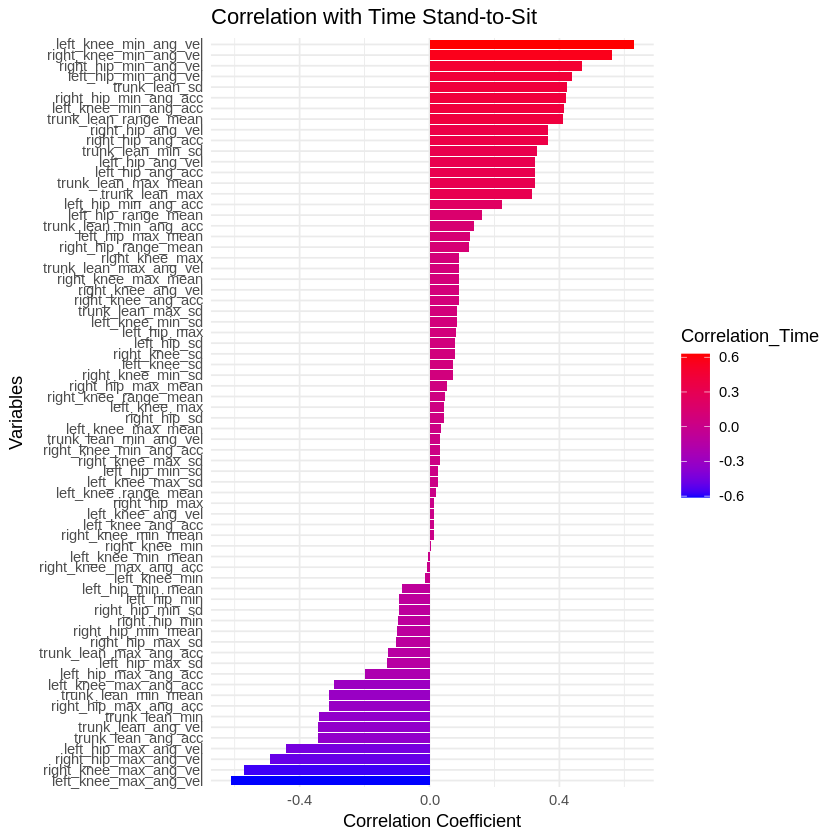

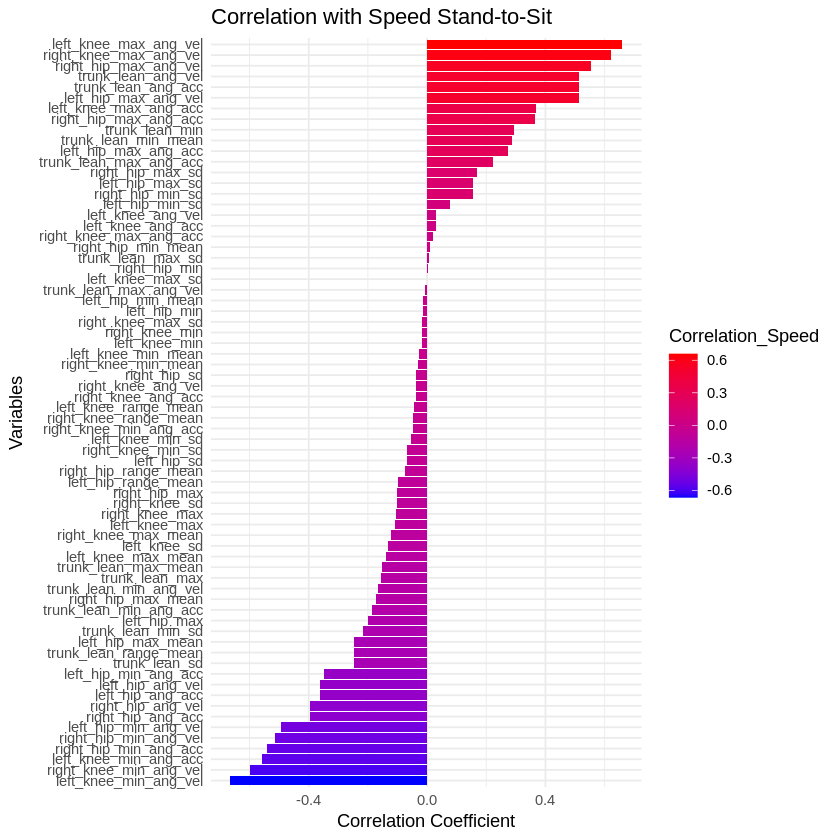

ERROR: Error in `[.data.frame`(data, , c("time_stand2si", "speed_stand2sit", : undefined columns selected


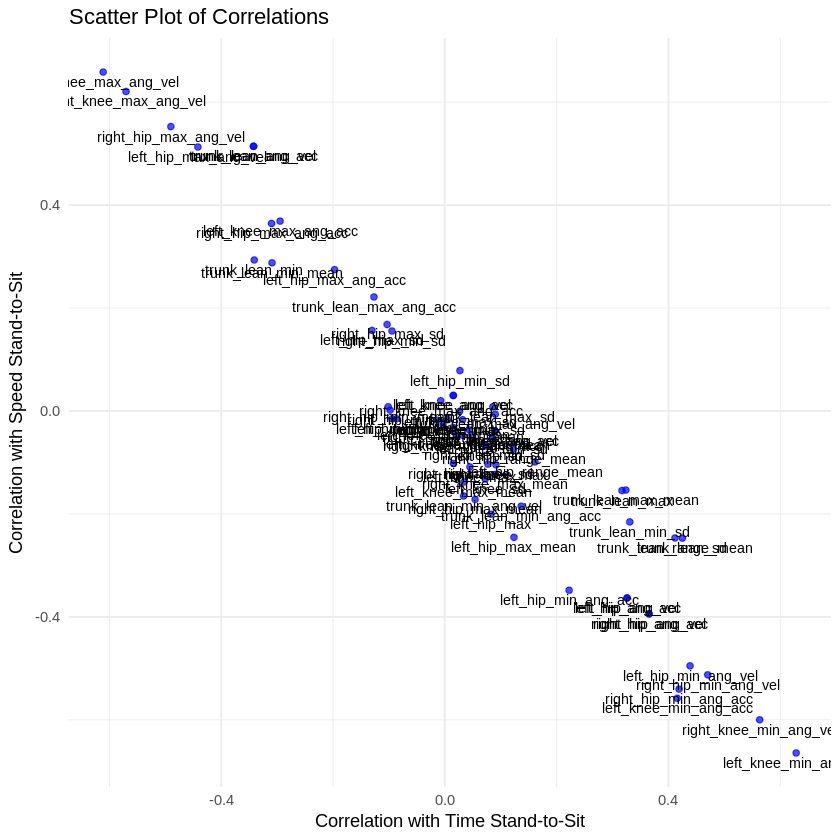

In [ ]:
# Load necessary libraries

library(dplyr)

library(ggplot2)

library(knitr)

library(reshape2)


# Load the dataset

data <- read.csv("dataClean.csv")


# Define the variables

existing_vars <- target_vars[target_vars %in% names(data)]


# Compute correlations independently

cor_results <- data.frame(Variable = character(), Correlation_Time = numeric(), Correlation_Speed = numeric(), stringsAsFactors = FALSE)

for (var in existing_vars) {
  cor_time <- cor(data$time_stand2si, data[[var]], use = "complete.obs")
  cor_speed <- cor(data$speed_stand2sit, data[[var]], use = "complete.obs")
  cor_results <- rbind(cor_results, data.frame(Variable = var, Correlation_Time = cor_time, Correlation_Speed = cor_speed))
}


# Filter moderate to high correlations
moderate_high_correlation <- cor_results %>%
  filter(Correlation_Time >= 0.4 | Correlation_Speed >= 0.4)

# Print the moderate to high correlation results
print(moderate_high_correlation)
kable(moderate_high_correlation, format = "markdown")

# Export the results to a CSV file
write.csv(moderate_high_correlation, "moderate_high_correlation_results.csv", row.names = FALSE)


# Create correlation plots

# Bar plot for correlation with time_stand2si
ggplot(cor_results, aes(x = reorder(Variable, Correlation_Time), y = Correlation_Time, fill = Correlation_Time)) +
  geom_bar(stat = "identity") +
  coord_flip() +
  theme_minimal() +
  labs(title = "Correlation with Time Stand-to-Sit", x = "Variables", y = "Correlation Coefficient") +
  scale_fill_gradient(low = "blue", high = "red")


# Bar plot for correlation with speed_stand2sit
ggplot(cor_results, aes(x = reorder(Variable, Correlation_Speed), y = Correlation_Speed, fill = Correlation_Speed)) +
  geom_bar(stat = "identity") +
  coord_flip() +
  theme_minimal() +
  labs(title = "Correlation with Speed Stand-to-Sit", x = "Variables", y = "Correlation Coefficient") +
  scale_fill_gradient(low = "blue", high = "red")


# Scatter plot to compare both correlations
ggplot(cor_results, aes(x = Correlation_Time, y = Correlation_Speed, label = Variable)) +
  geom_point(color = "blue", alpha = 0.7) +
  geom_text(size = 3, vjust = 1.5) +
  theme_minimal() +
  labs(title = "Scatter Plot of Correlations", x = "Correlation with Time Stand-to-Sit", y = "Correlation with Speed Stand-to-Sit")


# Heatmap of correlation values
cor_matrix <- cor(data[, c("time_stand2si", "speed_stand2sit", existing_vars)], use = "complete.obs")
cor_melt <- melt(cor_matrix)
ggplot(cor_melt, aes(Var1, Var2, fill = value)) +
  geom_tile() +
  scale_fill_gradient2(low = "blue", high = "red", mid = "white", midpoint = 0) +
  theme(axis.text.x = element_text(angle = 90, hjust = 1)) +
  labs(title = "Heatmap of Correlation Coefficients", x = "Variables", y = "Variables")


               Variable Correlation_Time Correlation_Speed
1 trunk_lean_range_mean        0.4117055        -0.2466863
2         trunk_lean_sd        0.4249463        -0.2470616
3    trunk_lean_ang_vel       -0.3421961         0.5141931
4    trunk_lean_ang_acc       -0.3421961         0.5141931
5              trunk_sd        0.4023304        -0.2474006
6          trunk_max_sd        0.4545949        -0.2668847




|Variable              | Correlation_Time| Correlation_Speed|
|:---------------------|----------------:|-----------------:|
|trunk_lean_range_mean |        0.4117055|        -0.2466863|
|trunk_lean_sd         |        0.4249463|        -0.2470616|
|trunk_lean_ang_vel    |       -0.3421961|         0.5141931|
|trunk_lean_ang_acc    |       -0.3421961|         0.5141931|
|trunk_sd              |        0.4023304|        -0.2474006|
|trunk_max_sd          |        0.4545949|        -0.2668847|

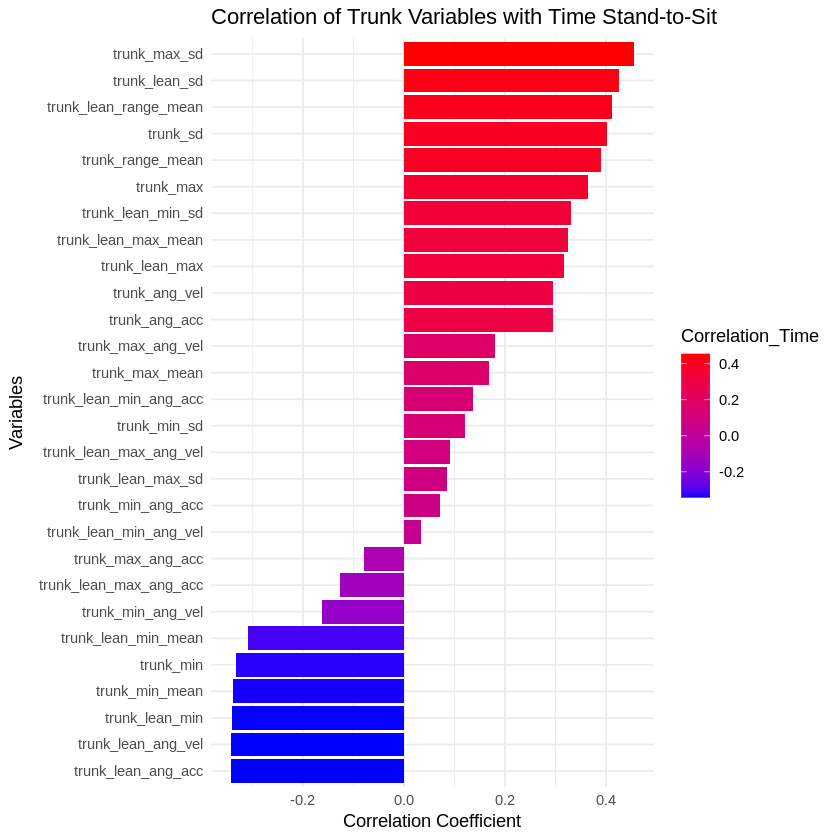

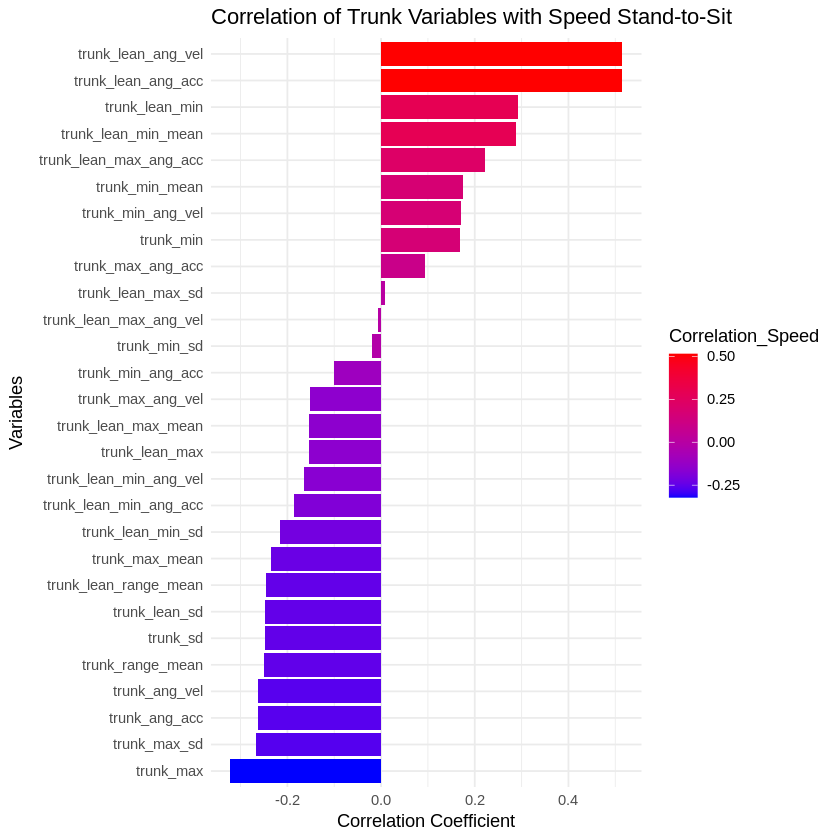

ERROR: Error in `[.data.frame`(data, , c("time_stand2si", "speed_stand2sit", : undefined columns selected


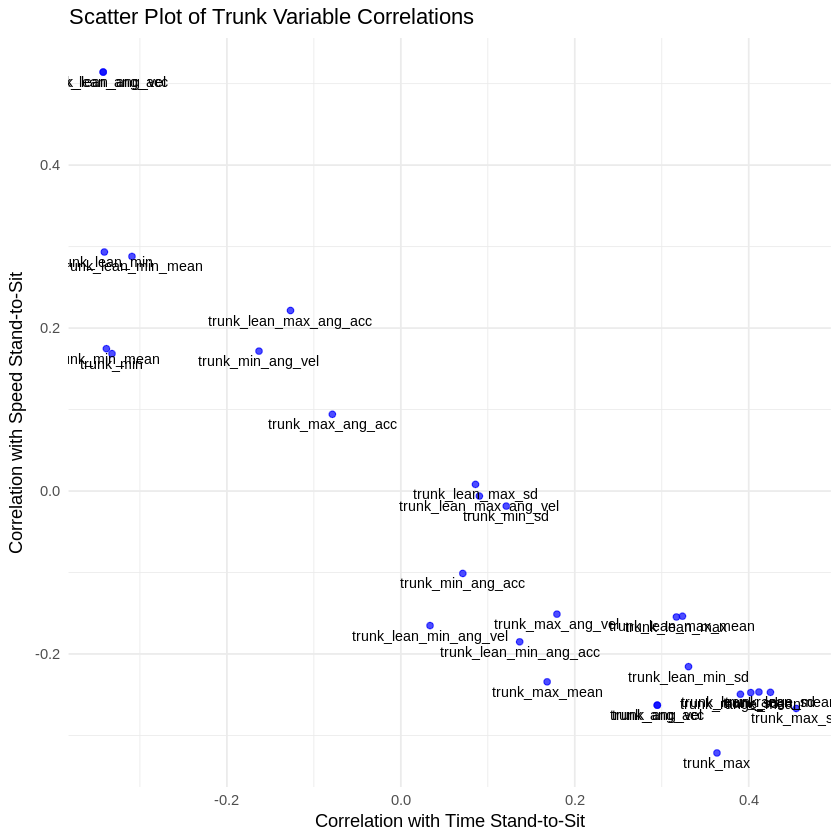

In [ ]:
# Load necessary libraries

library(dplyr)

library(ggplot2)

library(knitr)

library(reshape2)


# Load the dataset

data <- read.csv("dataClean.csv")


# Define the trunk variables

trunk_vars <- c("trunk_lean_range_mean", "trunk_lean_sd", "trunk_lean_max", "trunk_lean_min", "trunk_lean_max_mean",
                "trunk_lean_min_mean", "trunk_lean_max_sd", "trunk_lean_min_sd", "trunk_lean_ang_vel", "trunk_lean_ang_acc",
                "trunk_lean_max_ang_vel", "trunk_lean_max_ang_acc", "trunk_lean_min_ang_vel", "trunk_lean_min_ang_acc",
                "trunk_range_mean", "trunk_sd", "trunk_max", "trunk_min", "trunk_max_mean", "trunk_min_mean",
                "trunk_max_sd", "trunk_min_sd", "trunk_ang_vel", "trunk_ang_acc", "trunk_max_ang_vel", "trunk_max_ang_acc",
                "trunk_min_ang_vel", "trunk_min_ang_acc")

# Filter only existing trunk variables
existing_trunk_vars <- trunk_vars[trunk_vars %in% names(data)]

# Compute correlations independently

cor_trunk_results <- data.frame(Variable = character(), Correlation_Time = numeric(), Correlation_Speed = numeric(), stringsAsFactors = FALSE)

for (var in existing_trunk_vars) {
  cor_time <- cor(data$time_stand2si, data[[var]], use = "complete.obs")
  cor_speed <- cor(data$speed_stand2sit, data[[var]], use = "complete.obs")
  cor_trunk_results <- rbind(cor_trunk_results, data.frame(Variable = var, Correlation_Time = cor_time, Correlation_Speed = cor_speed))
}


# Filter moderate to high correlations
moderate_high_trunk_correlation <- cor_trunk_results %>%
  filter(Correlation_Time >= 0.4 | Correlation_Speed >= 0.4)

# Print the moderate to high correlation results
print(moderate_high_trunk_correlation)
kable(moderate_high_trunk_correlation, format = "markdown")

# Export the results to a CSV file
write.csv(moderate_high_trunk_correlation, "moderate_high_trunk_correlation_results.csv", row.names = FALSE)


# Create correlation plots

# Bar plot for correlation with time_stand2si
ggplot(cor_trunk_results, aes(x = reorder(Variable, Correlation_Time), y = Correlation_Time, fill = Correlation_Time)) +
  geom_bar(stat = "identity") +
  coord_flip() +
  theme_minimal() +
  labs(title = "Correlation of Trunk Variables with Time Stand-to-Sit", x = "Variables", y = "Correlation Coefficient") +
  scale_fill_gradient(low = "blue", high = "red")


# Bar plot for correlation with speed_stand2sit
ggplot(cor_trunk_results, aes(x = reorder(Variable, Correlation_Speed), y = Correlation_Speed, fill = Correlation_Speed)) +
  geom_bar(stat = "identity") +
  coord_flip() +
  theme_minimal() +
  labs(title = "Correlation of Trunk Variables with Speed Stand-to-Sit", x = "Variables", y = "Correlation Coefficient") +
  scale_fill_gradient(low = "blue", high = "red")


# Scatter plot to compare both correlations
ggplot(cor_trunk_results, aes(x = Correlation_Time, y = Correlation_Speed, label = Variable)) +
  geom_point(color = "blue", alpha = 0.7) +
  geom_text(size = 3, vjust = 1.5) +
  theme_minimal() +
  labs(title = "Scatter Plot of Trunk Variable Correlations", x = "Correlation with Time Stand-to-Sit", y = "Correlation with Speed Stand-to-Sit")


# Heatmap of correlation values
cor_trunk_matrix <- cor(data[, c("time_stand2si", "speed_stand2sit", existing_trunk_vars)], use = "complete.obs")
cor_trunk_melt <- melt(cor_trunk_matrix)
ggplot(cor_trunk_melt, aes(Var1, Var2, fill = value)) +
  geom_tile() +
  scale_fill_gradient2(low = "blue", high = "red", mid = "white", midpoint = 0) +
  theme(axis.text.x = element_text(angle = 90, hjust = 1)) +
  labs(title = "Heatmap of Trunk Variable Correlation Coefficients", x = "Variables", y = "Variables")

                       trunk_lean_range_mean trunk_lean_sd trunk_lean_max
trunk_lean_range_mean            1.000000000    0.97618203     0.87114959
trunk_lean_sd                    0.976182030    1.00000000     0.87796787
trunk_lean_max                   0.871149587    0.87796787     1.00000000
trunk_lean_min                  -0.305602897   -0.31157057     0.05332117
trunk_lean_max_mean              0.878346172    0.89127486     0.96938867
trunk_lean_min_mean             -0.246172599   -0.24778667     0.15554687
trunk_lean_max_sd                0.441769587    0.42304701     0.62156284
trunk_lean_min_sd                0.373045556    0.40727764     0.32853700
trunk_lean_ang_vel              -0.080760883   -0.08801370    -0.06516831
trunk_lean_ang_acc              -0.080760883   -0.08801370    -0.06516831
trunk_lean_max_ang_vel           0.805206255    0.81354662     0.75160413
trunk_lean_max_ang_acc           0.387955790    0.37092862     0.42827014
trunk_lean_min_ang_vel          -0.767



|                       | trunk_lean_range_mean| trunk_lean_sd| trunk_lean_max| trunk_lean_min| trunk_lean_max_mean| trunk_lean_min_mean| trunk_lean_max_sd| trunk_lean_min_sd| trunk_lean_ang_vel| trunk_lean_ang_acc| trunk_lean_max_ang_vel| trunk_lean_max_ang_acc| trunk_lean_min_ang_vel| trunk_lean_min_ang_acc| trunk_range_mean|   trunk_sd|  trunk_max|  trunk_min| trunk_max_mean| trunk_min_mean| trunk_max_sd| trunk_min_sd| trunk_ang_vel| trunk_ang_acc| trunk_max_ang_vel| trunk_max_ang_acc| trunk_min_ang_vel| trunk_min_ang_acc|
|:----------------------|---------------------:|-------------:|--------------:|--------------:|-------------------:|-------------------:|-----------------:|-----------------:|------------------:|------------------:|----------------------:|----------------------:|----------------------:|----------------------:|----------------:|----------:|----------:|----------:|--------------:|--------------:|------------:|------------:|-------------:|-------------:|-----------

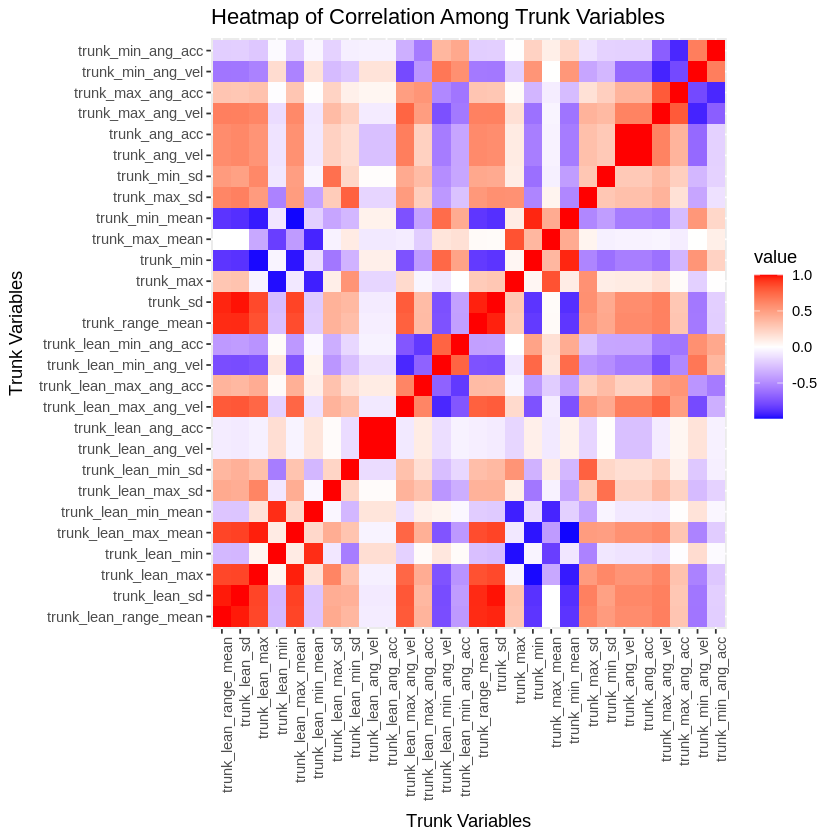

In [ ]:
# Load necessary libraries

library(dplyr)

library(ggplot2)

library(knitr)

library(reshape2)


# Load the dataset

data <- read.csv("dataClean.csv")


# Define the trunk variables

trunk_vars <- c("trunk_lean_range_mean", "trunk_lean_sd", "trunk_lean_max", "trunk_lean_min", "trunk_lean_max_mean",
                "trunk_lean_min_mean", "trunk_lean_max_sd", "trunk_lean_min_sd", "trunk_lean_ang_vel", "trunk_lean_ang_acc",
                "trunk_lean_max_ang_vel", "trunk_lean_max_ang_acc", "trunk_lean_min_ang_vel", "trunk_lean_min_ang_acc",
                "trunk_range_mean", "trunk_sd", "trunk_max", "trunk_min", "trunk_max_mean", "trunk_min_mean",
                "trunk_max_sd", "trunk_min_sd", "trunk_ang_vel", "trunk_ang_acc", "trunk_max_ang_vel", "trunk_max_ang_acc",
                "trunk_min_ang_vel", "trunk_min_ang_acc")

# Filter only existing trunk variables
existing_trunk_vars <- trunk_vars[trunk_vars %in% names(data)]

# Compute correlations among trunk variables
cor_trunk_matrix <- cor(data[, existing_trunk_vars], use = "complete.obs")

# Convert correlation matrix to a long format for visualization
cor_trunk_melt <- melt(cor_trunk_matrix)

# Print the correlation matrix
print(cor_trunk_matrix)
kable(cor_trunk_matrix, format = "markdown")

# Export the correlation matrix to a CSV file
write.csv(cor_trunk_matrix, "trunk_variable_correlation_matrix.csv", row.names = TRUE)

# Heatmap of correlation values among trunk variables
ggplot(cor_trunk_melt, aes(Var1, Var2, fill = value)) +
  geom_tile() +
  scale_fill_gradient2(low = "blue", high = "red", mid = "white", midpoint = 0) +
  theme(axis.text.x = element_text(angle = 90, hjust = 1)) +
  labs(title = "Heatmap of Correlation Among Trunk Variables", x = "Trunk Variables", y = "Trunk Variables")


                       trunk_lean_range_mean trunk_lean_sd trunk_lean_max
trunk_lean_range_mean            1.000000000    0.97618203     0.87114959
trunk_lean_sd                    0.976182030    1.00000000     0.87796787
trunk_lean_max                   0.871149587    0.87796787     1.00000000
trunk_lean_min                  -0.305602897   -0.31157057     0.05332117
trunk_lean_max_mean              0.878346172    0.89127486     0.96938867
trunk_lean_min_mean             -0.246172599   -0.24778667     0.15554687
trunk_lean_max_sd                0.441769587    0.42304701     0.62156284
trunk_lean_min_sd                0.373045556    0.40727764     0.32853700
trunk_lean_ang_vel              -0.080760883   -0.08801370    -0.06516831
trunk_lean_ang_acc              -0.080760883   -0.08801370    -0.06516831
trunk_lean_max_ang_vel           0.805206255    0.81354662     0.75160413
trunk_lean_max_ang_acc           0.387955790    0.37092862     0.42827014
trunk_lean_min_ang_vel          -0.767



|                       | trunk_lean_range_mean| trunk_lean_sd| trunk_lean_max| trunk_lean_min| trunk_lean_max_mean| trunk_lean_min_mean| trunk_lean_max_sd| trunk_lean_min_sd| trunk_lean_ang_vel| trunk_lean_ang_acc| trunk_lean_max_ang_vel| trunk_lean_max_ang_acc| trunk_lean_min_ang_vel| trunk_lean_min_ang_acc| trunk_range_mean|   trunk_sd|  trunk_max|  trunk_min| trunk_max_mean| trunk_min_mean| trunk_max_sd| trunk_min_sd| trunk_ang_vel| trunk_ang_acc| trunk_max_ang_vel| trunk_max_ang_acc| trunk_min_ang_vel| trunk_min_ang_acc|
|:----------------------|---------------------:|-------------:|--------------:|--------------:|-------------------:|-------------------:|-----------------:|-----------------:|------------------:|------------------:|----------------------:|----------------------:|----------------------:|----------------------:|----------------:|----------:|----------:|----------:|--------------:|--------------:|------------:|------------:|-------------:|-------------:|-----------

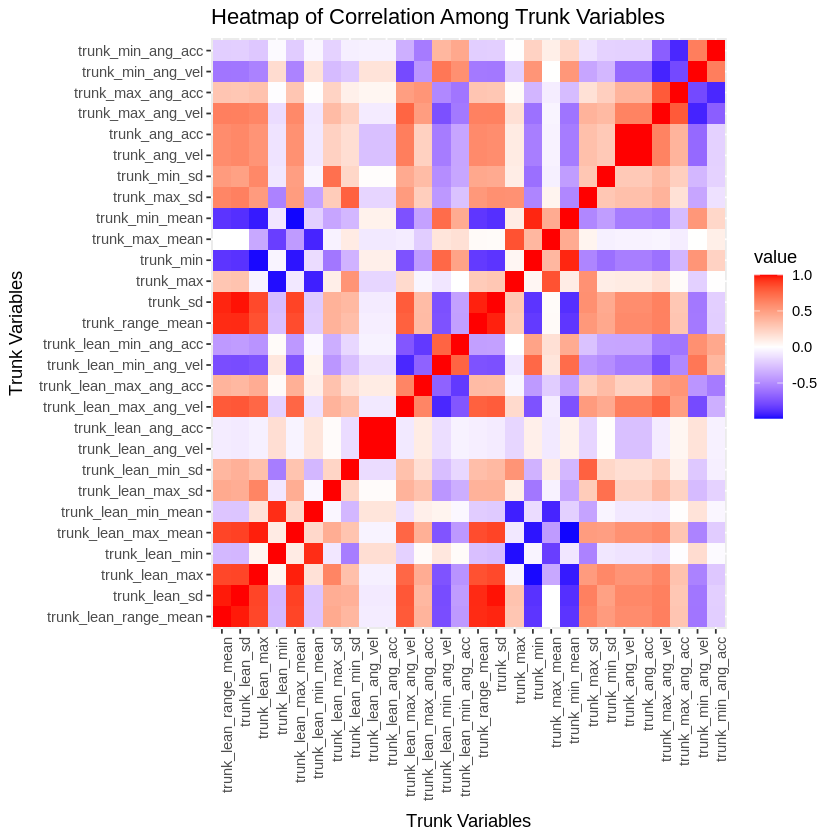

In [ ]:
# Load necessary libraries

library(dplyr)

library(ggplot2)

library(knitr)

library(reshape2)


# Load the dataset

data <- read.csv("dataClean.csv")


# Define the trunk variables

trunk_vars <- c("trunk_lean_range_mean", "trunk_lean_sd", "trunk_lean_max", "trunk_lean_min", "trunk_lean_max_mean",
                "trunk_lean_min_mean", "trunk_lean_max_sd", "trunk_lean_min_sd", "trunk_lean_ang_vel", "trunk_lean_ang_acc",
                "trunk_lean_max_ang_vel", "trunk_lean_max_ang_acc", "trunk_lean_min_ang_vel", "trunk_lean_min_ang_acc",
                "trunk_range_mean", "trunk_sd", "trunk_max", "trunk_min", "trunk_max_mean", "trunk_min_mean",
                "trunk_max_sd", "trunk_min_sd", "trunk_ang_vel", "trunk_ang_acc", "trunk_max_ang_vel", "trunk_max_ang_acc",
                "trunk_min_ang_vel", "trunk_min_ang_acc")

# Filter only existing trunk variables
existing_trunk_vars <- trunk_vars[trunk_vars %in% names(data)]

# Compute correlations among trunk variables
cor_trunk_matrix <- cor(data[, existing_trunk_vars], use = "complete.obs")

# Convert correlation matrix to a long format for visualization
cor_trunk_melt <- melt(cor_trunk_matrix)

# Print the correlation matrix
print(cor_trunk_matrix)
kable(cor_trunk_matrix, format = "markdown")

# Export the correlation matrix to a CSV file
write.csv(cor_trunk_matrix, "trunk_variable_correlation_matrix.csv", row.names = TRUE)

# Heatmap of correlation values among trunk variables
ggplot(cor_trunk_melt, aes(Var1, Var2, fill = value)) +
  geom_tile() +
  scale_fill_gradient2(low = "blue", high = "red", mid = "white", midpoint = 0) +
  theme(axis.text.x = element_text(angle = 90, hjust = 1)) +
  labs(title = "Heatmap of Correlation Among Trunk Variables", x = "Trunk Variables", y = "Trunk Variables")


                       left_knee_max_ang_vel left_knee_min_ang_vel
left_knee_max_ang_vel             1.00000000           -0.90982577
left_knee_min_ang_vel            -0.90982577            1.00000000
left_knee_min_ang_acc            -0.73153323            0.74646664
right_knee_max_ang_vel            0.73040384           -0.67867179
right_knee_min_ang_vel           -0.66890840            0.71659408
left_hip_max_ang_vel              0.77818898           -0.70980986
left_hip_min_ang_vel             -0.73564668            0.76792334
right_hip_max_ang_vel             0.67043193           -0.59947705
right_hip_min_ang_vel            -0.61199453            0.61187240
right_hip_min_ang_acc            -0.55408128            0.53494201
trunk_lean_range_mean            -0.06082315            0.07128765
trunk_lean_sd                    -0.05517780            0.06953921
trunk_lean_ang_vel                0.29374768           -0.26384563
trunk_lean_ang_acc                0.29374768           -0.2638



|                       | left_knee_max_ang_vel| left_knee_min_ang_vel| left_knee_min_ang_acc| right_knee_max_ang_vel| right_knee_min_ang_vel| left_hip_max_ang_vel| left_hip_min_ang_vel| right_hip_max_ang_vel| right_hip_min_ang_vel| right_hip_min_ang_acc| trunk_lean_range_mean| trunk_lean_sd| trunk_lean_ang_vel| trunk_lean_ang_acc|
|:----------------------|---------------------:|---------------------:|---------------------:|----------------------:|----------------------:|--------------------:|--------------------:|---------------------:|---------------------:|---------------------:|---------------------:|-------------:|------------------:|------------------:|
|left_knee_max_ang_vel  |             1.0000000|            -0.9098258|            -0.7315332|              0.7304038|             -0.6689084|            0.7781890|           -0.7356467|             0.6704319|            -0.6119945|            -0.5540813|            -0.0608231|    -0.0551778|          0.2937477|          0.29374

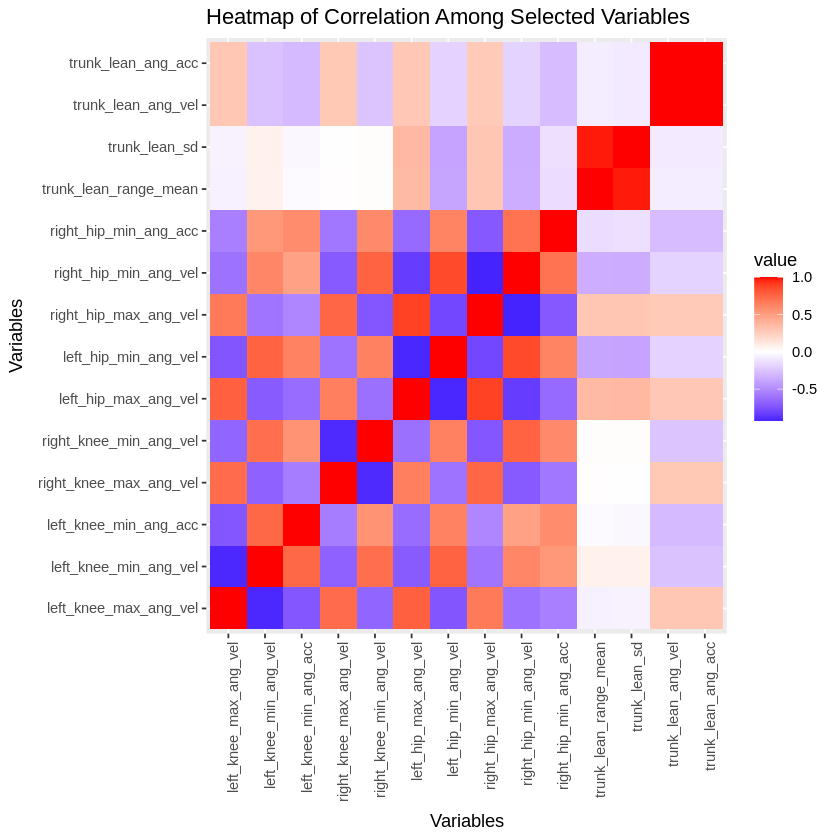

In [ ]:
# Load necessary libraries

library(dplyr)

library(ggplot2)

library(knitr)

library(reshape2)


# Load the dataset

data <- read.csv("dataClean.csv")


# Identify variables that showed moderate to high correlation with time_stand2si and speed_stand2sit
moderate_high_correlation <- read.csv("moderate_high_correlation_results.csv")
selected_vars <- moderate_high_correlation$Variable[moderate_high_correlation$Correlation_Time >= 0.4 | moderate_high_correlation$Correlation_Speed >= 0.4]

# Compute correlation matrix among these selected variables from all dataset variables
existing_selected_vars <- selected_vars[selected_vars %in% names(data)]
cor_selected_matrix <- cor(data[, existing_selected_vars], use = "complete.obs")

# Convert correlation matrix to a long format for visualization
cor_selected_melt <- melt(cor_selected_matrix)

# Print the correlation matrix of selected variables
print(cor_selected_matrix)
kable(cor_selected_matrix, format = "markdown")

# Export the correlation matrix to a CSV file
write.csv(cor_selected_matrix, "selected_variable_correlation_matrix.csv", row.names = TRUE)

# Heatmap of correlation values among selected variables
ggplot(cor_selected_melt, aes(Var1, Var2, fill = value)) +
  geom_tile() +
  scale_fill_gradient2(low = "blue", high = "red", mid = "white", midpoint = 0) +
  theme(axis.text.x = element_text(angle = 90, hjust = 1)) +
  labs(title = "Heatmap of Correlation Among Selected Variables", x = "Variables", y = "Variables")

In [ ]:
# Load necessary libraries

library(dplyr)

library(ggplot2)

library(knitr)

library(reshape2)


# Load the dataset

data <- read.csv("dataClean.csv")


# Identify variables that showed moderate to high correlation with time_stand2si and speed_stand2sit
moderate_high_correlation <- read.csv("moderate_high_correlation_results.csv")
selected_vars <- moderate_high_correlation$Variable[moderate_high_correlation$Correlation_Time >= 0.4 | moderate_high_correlation$Correlation_Speed >= 0.4]

# Compute correlation matrix between selected variables and all dataset variables
existing_selected_vars <- selected_vars[selected_vars %in% names(data)]
existing_all_vars <- names(data)  # Ensure all variables in the dataset are considered
cor_selected_all_matrix <- cor(data[, existing_all_vars], data[, existing_selected_vars], use = "complete.obs")

# Convert correlation matrix to a long format for visualization
cor_selected_all_melt <- melt(cor_selected_all_matrix)

# Print the correlation matrix
print(cor_selected_all_matrix)
kable(cor_selected_all_matrix, format = "markdown")

# Export the correlation matrix to a CSV file
write.csv(cor_selected_all_matrix, "selected_vs_all_variable_correlation_matrix.csv", row.names = TRUE)

# Heatmap of correlation values between selected variables and all dataset variables
ggplot(cor_selected_all_melt, aes(Var1, Var2, fill = value)) +
  geom_tile() +
  scale_fill_gradient2(low = "blue", high = "red", mid = "white", midpoint = 0) +
  theme(axis.text.x = element_text(angle = 90, hjust = 1)) +
  labs(title = "Heatmap of Correlation Between Selected Variables and All Variables", x = "All Dataset Variables", y = "Selected Variables")

ERROR: Error in cor(data[, existing_all_vars], data[, existing_selected_vars], : 'x' must be numeric


Warning message in cor(numeric_data[, existing_all_vars], numeric_data[, existing_selected_vars], :
“the standard deviation is zero”


                                        left_knee_max_ang_vel
X                                                -0.663977049
subjectid                                                  NA
orientation                                                NA
framerate                                        -0.823517089
time                                             -0.883082566
time_diff                                         0.839286906
speed                                             0.951865777
time_sd                                          -0.908962283
speed_sd                                         -0.960797321
n_sit2stand                                                NA
time_sit2stand                                   -0.767964577
time_diff_sit2stand                               0.825002089
speed_sit2stand                                   0.836765490
time_sd_sit2stand                                -0.206110873
speed_sd_sit2stand                                0.402725324
n_stand2



|                                        | left_knee_max_ang_vel| left_knee_min_ang_vel| left_knee_min_ang_acc| right_knee_max_ang_vel| right_knee_min_ang_vel| left_hip_max_ang_vel| left_hip_min_ang_vel| right_hip_max_ang_vel| right_hip_min_ang_vel| right_hip_min_ang_acc| trunk_lean_range_mean| trunk_lean_sd| trunk_lean_ang_vel| trunk_lean_ang_acc|
|:---------------------------------------|---------------------:|---------------------:|---------------------:|----------------------:|----------------------:|--------------------:|--------------------:|---------------------:|---------------------:|---------------------:|---------------------:|-------------:|------------------:|------------------:|
|X                                       |            -0.6639770|             0.4933142|             0.6457366|             -0.6439302|              0.4935163|           -0.7247152|            0.6005951|            -0.5145620|             0.4164425|             0.6126945|            -0.1525032| 

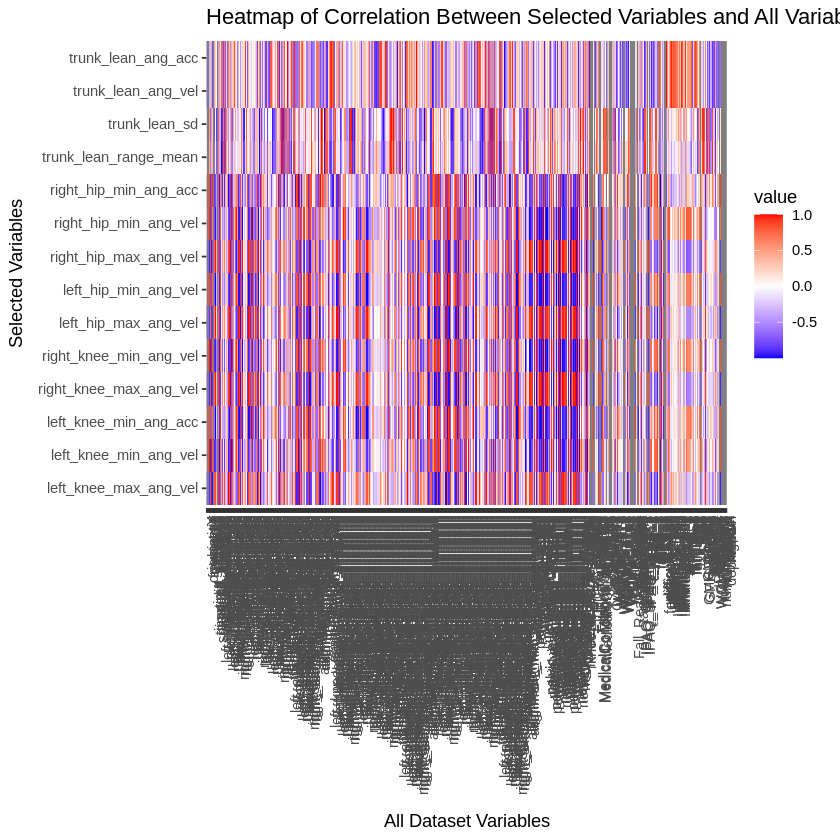

In [ ]:
# Load necessary libraries

library(dplyr)

library(ggplot2)

library(knitr)

library(reshape2)


# Load the dataset

data <- read.csv("dataClean.csv")


# Identify variables that showed moderate to high correlation with time_stand2si and speed_stand2sit
moderate_high_correlation <- read.csv("moderate_high_correlation_results.csv")
selected_vars <- moderate_high_correlation$Variable[moderate_high_correlation$Correlation_Time >= 0.4 | moderate_high_correlation$Correlation_Speed >= 0.4]

# Ensure only numeric variables are selected
numeric_data <- data %>% select(where(is.numeric))
existing_selected_vars <- selected_vars[selected_vars %in% names(numeric_data)]
existing_all_vars <- names(numeric_data)  # Ensure all dataset variables are numeric

# Compute correlation matrix between selected variables and all dataset variables
cor_selected_all_matrix <- cor(numeric_data[, existing_all_vars], numeric_data[, existing_selected_vars], use = "complete.obs")

# Convert correlation matrix to a long format for visualization
cor_selected_all_melt <- melt(cor_selected_all_matrix)

# Print the correlation matrix
print(cor_selected_all_matrix)
kable(cor_selected_all_matrix, format = "markdown")

# Export the correlation matrix to a CSV file
write.csv(cor_selected_all_matrix, "selected_vs_all_variable_correlation_matrix.csv", row.names = TRUE)

# Heatmap of correlation values between selected variables and all dataset variables
ggplot(cor_selected_all_melt, aes(Var1, Var2, fill = value)) +
  geom_tile() +
  scale_fill_gradient2(low = "blue", high = "red", mid = "white", midpoint = 0) +
  theme(axis.text.x = element_text(angle = 90, hjust = 1)) +
  labs(title = "Heatmap of Correlation Between Selected Variables and All Variables", x = "All Dataset Variables", y = "Selected Variables")


In [ ]:
# Load necessary libraries

library(dplyr)

library(ggplot2)

library(knitr)

library(reshape2)


# Load the dataset

data <- read.csv("dataClean.csv")


# Subset data for individuals with osteoarthritis
osteo_data <- data %>% filter(osteoarthritis == 1)  # Assuming osteoarthritis is indicated by 1


# Identify variables that showed moderate to high correlation with time_stand2si and speed_stand2sit
moderate_high_correlation <- read.csv("moderate_high_correlation_results.csv")
selected_vars <- moderate_high_correlation$Variable[moderate_high_correlation$Correlation_Time >= 0.4 | moderate_high_correlation$Correlation_Speed >= 0.4]

# Ensure only numeric variables are selected
numeric_data <- osteo_data %>% select(where(is.numeric))
existing_selected_vars <- selected_vars[selected_vars %in% names(numeric_data)]
existing_all_vars <- names(numeric_data)  # Ensure all dataset variables are numeric

# Compute correlation matrix between selected variables and all dataset variables for osteoarthritis subset
cor_selected_all_matrix <- cor(numeric_data[, existing_all_vars], numeric_data[, existing_selected_vars], use = "complete.obs")

# Convert correlation matrix to a long format for visualization
cor_selected_all_melt <- melt(cor_selected_all_matrix)

# Print the correlation matrix
print(cor_selected_all_matrix)
kable(cor_selected_all_matrix, format = "markdown")

# Export the correlation matrix to a CSV file
write.csv(cor_selected_all_matrix, "selected_vs_all_variable_correlation_matrix_osteo.csv", row.names = TRUE)

# Heatmap of correlation values between selected variables and all dataset variables for osteoarthritis subset
ggplot(cor_selected_all_melt, aes(Var1, Var2, fill = value)) +
  geom_tile() +
  scale_fill_gradient2(low = "blue", high = "red", mid = "white", midpoint = 0) +
  theme(axis.text.x = element_text(angle = 90, hjust = 1)) +
  labs(title = "Heatmap of Correlation Among Selected Variables for Osteoarthritis Subset", x = "All Dataset Variables", y = "Selected Variables")

ERROR: [1m[33mError[39m in `filter()`:[22m
[1m[22m[36mℹ[39m In argument: `osteoarthritis == 1`.
[1mCaused by error:[22m
[33m![39m object 'osteoarthritis' not found


In [ ]:
# Load necessary libraries

library(dplyr)

library(ggplot2)

library(knitr)

library(reshape2)


# Load the dataset

data <- read.csv("dataClean.csv")


# Subset data for individuals with osteoarthritis
osteo_data <- data %>% filter(osteoarthritis == 1)  # Assuming osteoarthritis is indicated by 1


# Compute descriptive statistics for the osteoarthritis subset
descriptive_stats <- osteo_data %>%
  summarise(across(where(is.numeric), list(mean = mean, sd = sd, min = min, max = max, median = median), na.rm = TRUE))

# Print descriptive statistics
print(descriptive_stats)
kable(descriptive_stats, format = "markdown")

# Export descriptive statistics to a CSV file
write.csv(descriptive_stats, "descriptive_statistics_osteo.csv", row.names = FALSE)


# Identify variables that showed moderate to high correlation with time_stand2si and speed_stand2sit
moderate_high_correlation <- read.csv("moderate_high_correlation_results.csv")
selected_vars <- moderate_high_correlation$Variable[moderate_high_correlation$Correlation_Time >= 0.4 | moderate_high_correlation$Correlation_Speed >= 0.4]

# Ensure only numeric variables are selected
numeric_data <- osteo_data %>% select(where(is.numeric))
existing_selected_vars <- selected_vars[selected_vars %in% names(numeric_data)]
existing_all_vars <- names(numeric_data)  # Ensure all dataset variables are numeric

# Compute correlation matrix between selected variables and all dataset variables for osteoarthritis subset
cor_selected_all_matrix <- cor(numeric_data[, existing_all_vars], numeric_data[, existing_selected_vars], use = "complete.obs")

# Convert correlation matrix to a long format for visualization
cor_selected_all_melt <- melt(cor_selected_all_matrix)

# Print the correlation matrix
print(cor_selected_all_matrix)
kable(cor_selected_all_matrix, format = "markdown")

# Export the correlation matrix to a CSV file
write.csv(cor_selected_all_matrix, "selected_vs_all_variable_correlation_matrix_osteo.csv", row.names = TRUE)

# Heatmap of correlation values between selected variables and all dataset variables for osteoarthritis subset
ggplot(cor_selected_all_melt, aes(Var1, Var2, fill = value)) +
  geom_tile() +
  scale_fill_gradient2(low = "blue", high = "red", mid = "white", midpoint = 0) +
  theme(axis.text.x = element_text(angle = 90, hjust = 1)) +
  labs(title = "Heatmap of Correlation Among Selected Variables for Osteoarthritis Subset", x = "All Dataset Variables", y = "Selected Variables")


ERROR: [1m[33mError[39m in `filter()`:[22m
[1m[22m[36mℹ[39m In argument: `osteoarthritis == 1`.
[1mCaused by error:[22m
[33m![39m object 'osteoarthritis' not found


In [ ]:
library(dplyr) # For data manipulation
library(psych) # For descriptive statistics

ERROR: Error in library(psych): there is no package called ‘psych’


In [ ]:
# Basic descriptive statistics for all numeric variables
summary(data)

# More detailed descriptive statistics using the describe function from the psych package
describe(data)

# Descriptive statistics for specific variables
summary(data$variable_name)  # Replace variable_name with the actual variable name
describe(data$variable_name)  # Replace variable_name with the actual variable name

# Grouped descriptive statistics using dplyr
data %>%
  group_by(grouping_variable) %>%  # Replace grouping_variable with the actual grouping variable
  summarise(mean_value = mean(variable_name), sd_value = sd(variable_name))  # Replace variable_name with the actual variable name

       X           subjectid  orientation   framerate           time       
 Min.   :  1.0   Min.   :0   Min.   :0    Min.   : 23.98   Min.   : 4.274  
 1st Qu.:183.0   1st Qu.:0   1st Qu.:0    1st Qu.: 29.97   1st Qu.: 9.142  
 Median :356.0   Median :0   Median :0    Median : 29.97   Median :11.100  
 Mean   :348.9   Mean   :0   Mean   :0    Mean   : 32.13   Mean   :11.399  
 3rd Qu.:518.0   3rd Qu.:0   3rd Qu.:0    3rd Qu.: 30.00   3rd Qu.:13.397  
 Max.   :677.0   Max.   :0   Max.   :0    Max.   :120.00   Max.   :32.875  
                                                                           
   time_diff            speed           time_sd           speed_sd       
 Min.   :-1.07607   Min.   :0.1500   Min.   :0.02357   Min.   :0.004926  
 1st Qu.:-0.13333   1st Qu.:0.3700   1st Qu.:0.14298   1st Qu.:0.037602  
 Median : 0.00000   Median :0.4500   Median :0.25673   Median :0.056387  
 Mean   :-0.03253   Mean   :0.4793   Mean   :0.29764   Mean   :0.060289  
 3rd Qu.: 0.06667   3r

ERROR: Error in describe(data): could not find function "describe"


In [ ]:
# Filter only the existing variables in the dataset
existing_vars <- target_vars[target_vars %in% names(data)]


In [ ]:
# Install the reshape2 package
install.packages("reshape2")

# Load necessary libraries
library(dplyr)
library(ggplot2)
library(reshape2)

# Load the dataset
data <- read.csv("dataClean.csv")

# ... (Rest of your code) ...

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependency ‘plyr’




In [ ]:
install.packages("ggplot2")  # Install ggplot2 if not already installed
library(ggplot2)             # Load ggplot2


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



3-17-2025 - Knee variables

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Warning message in cor(numeric_data[, knee_vars], numeric_data, use = "complete.obs"):
“the standard deviation is zero”


            Knee Variable        Other Variable Correlation
1    left_knee_range_mean  left_knee_range_mean           1
59          left_knee_max         left_knee_max           1
88          left_knee_min         left_knee_min           1
117    left_knee_max_mean    left_knee_max_mean           1
146    left_knee_min_mean    left_knee_min_mean           1
175      left_knee_max_sd      left_knee_max_sd           1
204      left_knee_min_sd      left_knee_min_sd           1
233     left_knee_ang_vel     left_knee_ang_vel           1
234     left_knee_ang_acc     left_knee_ang_vel           1
261     left_knee_ang_vel     left_knee_ang_acc           1
262     left_knee_ang_acc     left_knee_ang_acc           1
291 left_knee_max_ang_vel left_knee_max_ang_vel           1
320 left_knee_max_ang_acc left_knee_max_ang_acc           1
378 left_knee_min_ang_acc left_knee_min_ang_acc           1
407 right_knee_range_mean right_knee_range_mean           1
436         right_knee_sd         right_

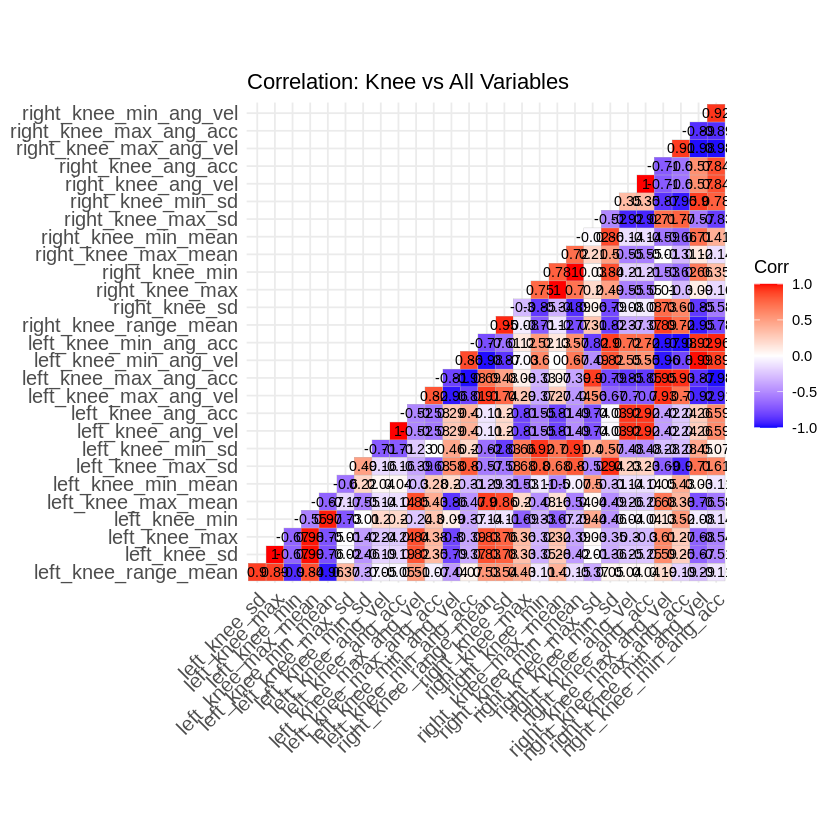

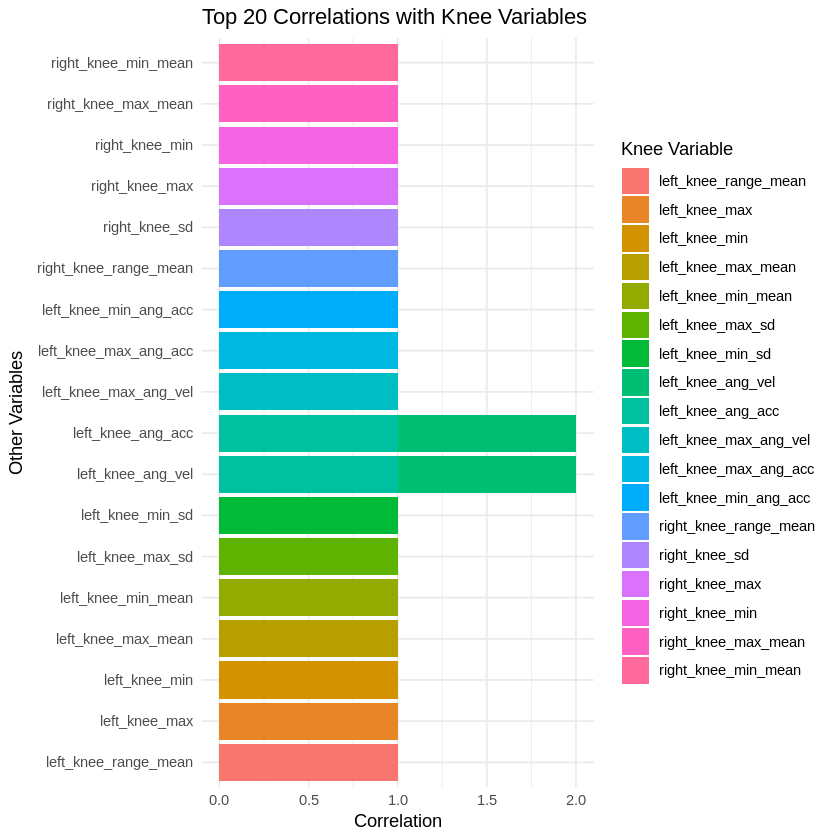

In [ ]:
# Load necessary libraries
install.packages("ggplot2", dependencies = FALSE) # Avoid installing unnecessary dependencies # If not installed
install.packages("ggcorrplot", dependencies = FALSE) # Avoid unnecessary dependencies # If not installed
install.packages("reshape2", dependencies = TRUE) # If not installed

library(ggplot2)
library(ggcorrplot)
library(reshape2)

# Load the dataset
data <- read.csv("dataClean.csv", header = TRUE, sep = ",")

# Define knee variables
knee_vars <- c("left_knee_range_mean", "left_knee_sd", "left_knee_max", "left_knee_min", "left_knee_max_mean",
               "left_knee_min_mean", "left_knee_max_sd", "left_knee_min_sd", "left_knee_ang_vel", "left_knee_ang_acc",
               "left_knee_max_ang_vel", "left_knee_max_ang_acc", "left_knee_min_ang_vel", "left_knee_min_ang_acc",
               "right_knee_range_mean", "right_knee_sd", "right_knee_max", "right_knee_min", "right_knee_max_mean",
               "right_knee_min_mean", "right_knee_max_sd", "right_knee_min_sd", "right_knee_ang_vel", "right_knee_ang_acc",
               "right_knee_max_ang_vel", "right_knee_max_ang_acc", "right_knee_min_ang_vel", "right_knee_min_ang_acc")

# Define all variables (including knee variables)
all_vars <- unique(c(knee_vars, colnames(data)))

# Filter numeric selected variables
numeric_data <- data[, all_vars]
numeric_data <- numeric_data[, sapply(numeric_data, is.numeric)]

# Remove knee variables that have zero variance
knee_vars <- knee_vars[knee_vars %in% colnames(numeric_data)]  # Keep only existing variables
knee_vars <- knee_vars[sapply(numeric_data[knee_vars], function(x) length(unique(na.omit(x))) > 1 & sd(x, na.rm = TRUE) > 0)]
numeric_data <- numeric_data[, apply(numeric_data, 2, function(x) length(unique(na.omit(x))) > 1 & sd(x, na.rm = TRUE) > 0)]
numeric_data <- numeric_data[, sapply(numeric_data, function(x) length(unique(x[!is.na(x)])) > 1)]  # Remove identical-value columns
numeric_data <- numeric_data[, colSums(!is.na(numeric_data)) > 1]  # Ensure at least 2 non-NA values
if (ncol(numeric_data) == 0) {
  print("Warning: No numeric columns with non-zero variance found. Check data preprocessing.")
  quit()
}  # Remove constant columns

# Compute correlation matrix for knee variables against all variables
cor_matrix <- cor(numeric_data[, knee_vars], numeric_data, use = "complete.obs")
cor_matrix[is.na(cor_matrix)] <- 0

# Save correlation matrix to CSV
write.csv(as.data.frame(cor_matrix), "correlation_knee_vs_all.csv", row.names = TRUE)

# Convert correlation matrix to long format and sort values
cor_table <- as.data.frame(as.table(cor_matrix))
names(cor_table) <- c("Knee Variable", "Other Variable", "Correlation")
cor_table <- cor_table[order(-abs(cor_table$Correlation)), ]  # Sort by absolute correlation value

# Save sorted correlation results
write.csv(cor_table, "correlation_knee_sorted.csv", row.names = FALSE)

# Display correlation table
print(head(cor_table, 20))  # Show top correlations

# Generate correlation heatmap
ggcorrplot(cor_matrix, method = "square", type = "lower", lab = TRUE, lab_size = 3,
           colors = c("blue", "white", "red"), title = "Correlation: Knee vs All Variables", ggtheme = theme_minimal())

# Bar plot for top correlations
top_cor <- head(cor_table, 20)  # Select top 20 correlations
ggplot(top_cor, aes(x = reorder(`Other Variable`, Correlation), y = Correlation, fill = `Knee Variable`)) +
  geom_bar(stat = "identity") +
  coord_flip() +
  ggtitle("Top 20 Correlations with Knee Variables") +
  xlab("Other Variables") +
  ylab("Correlation") +
  theme_minimal()


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Warning message in cor(numeric_data[, knee_vars], numeric_data[, !colnames(numeric_data) %in% :
“the standard deviation is zero”


[1] Knee Variable  Other Variable Correlation   
<0 rows> (or 0-length row.names)


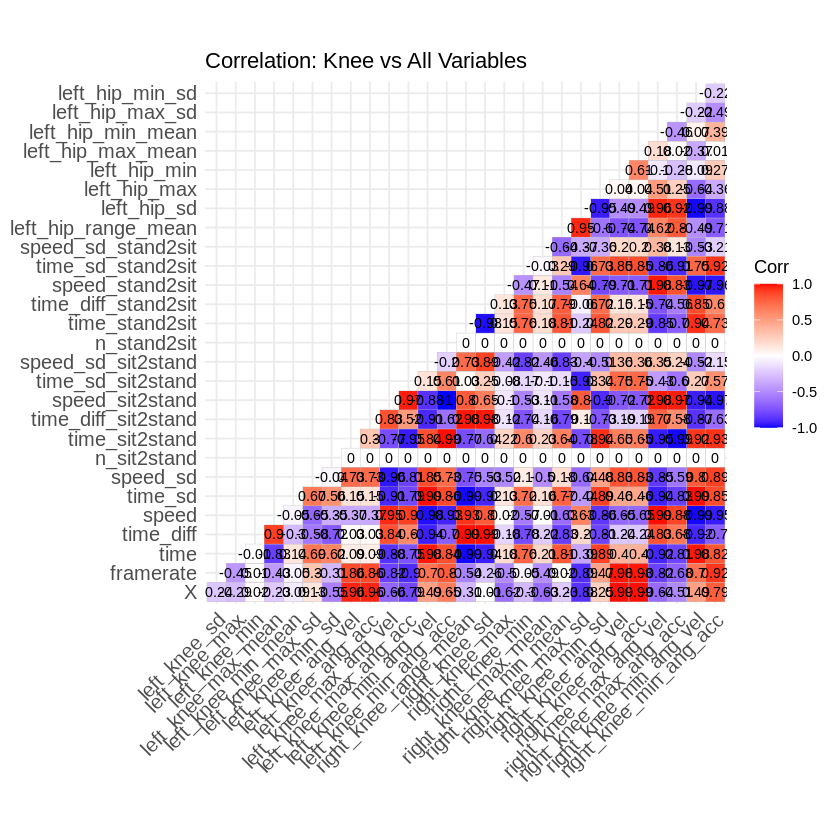

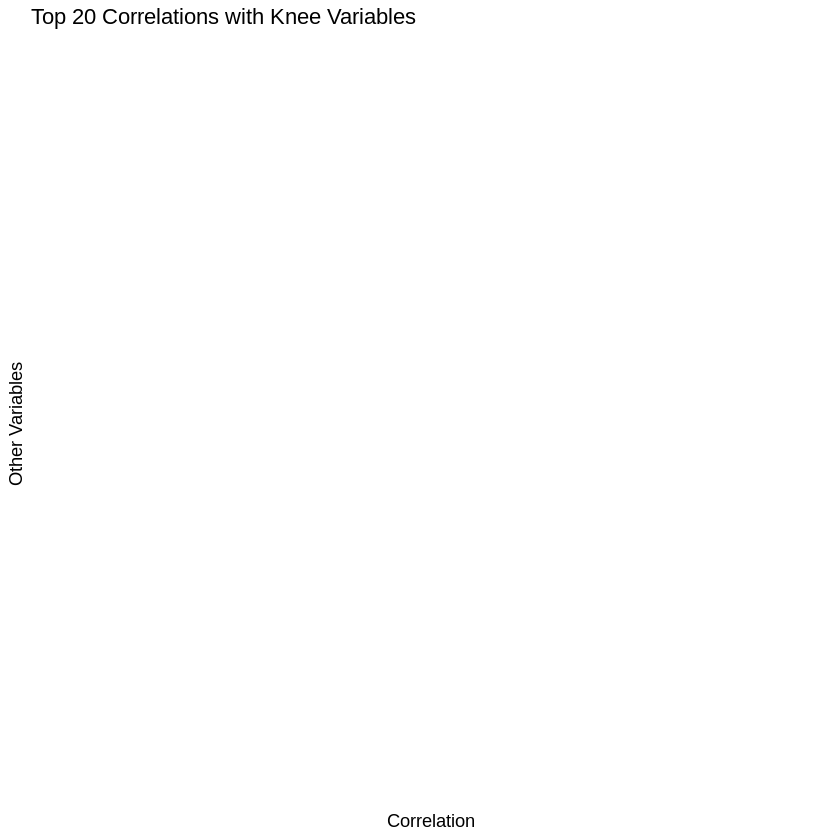

In [ ]:
# Load necessary libraries
install.packages("ggplot2", dependencies = FALSE) # Avoid installing unnecessary dependencies # If not installed
install.packages("ggcorrplot", dependencies = FALSE) # Avoid unnecessary dependencies # If not installed
install.packages("reshape2", dependencies = TRUE) # If not installed

library(ggplot2)
library(ggcorrplot)
library(reshape2)

# Load the dataset
data <- read.csv("dataClean.csv", header = TRUE, sep = ",")

# Define knee variables
knee_vars <- c("left_knee_range_mean", "left_knee_sd", "left_knee_max", "left_knee_min", "left_knee_max_mean",
               "left_knee_min_mean", "left_knee_max_sd", "left_knee_min_sd", "left_knee_ang_vel", "left_knee_ang_acc",
               "left_knee_max_ang_vel", "left_knee_max_ang_acc", "left_knee_min_ang_vel", "left_knee_min_ang_acc",
               "right_knee_range_mean", "right_knee_sd", "right_knee_max", "right_knee_min", "right_knee_max_mean",
               "right_knee_min_mean", "right_knee_max_sd", "right_knee_min_sd", "right_knee_ang_vel", "right_knee_ang_acc",
               "right_knee_max_ang_vel", "right_knee_max_ang_acc", "right_knee_min_ang_vel", "right_knee_min_ang_acc")

# Define all variables (including knee variables)
all_vars <- unique(c(knee_vars, colnames(data)))

# Filter numeric selected variables
numeric_data <- data[, all_vars]
numeric_data <- numeric_data[, sapply(numeric_data, is.numeric)]

# Remove knee variables that have zero variance
knee_vars <- knee_vars[knee_vars %in% colnames(numeric_data)]  # Keep only existing variables
knee_vars <- knee_vars[sapply(numeric_data[knee_vars], function(x) length(unique(na.omit(x))) > 1 & sd(x, na.rm = TRUE) > 0)]
numeric_data <- numeric_data[, apply(numeric_data, 2, function(x) length(unique(na.omit(x))) > 1 & sd(x, na.rm = TRUE) > 0)]
numeric_data <- numeric_data[, sapply(numeric_data, function(x) length(unique(x[!is.na(x)])) > 1)]  # Remove identical-value columns
numeric_data <- numeric_data[, colSums(!is.na(numeric_data)) > 1]  # Ensure at least 2 non-NA values
if (ncol(numeric_data) == 0) {
  print("Warning: No numeric columns with non-zero variance found. Check data preprocessing.")
  quit()
}  # Remove constant columns

# Compute correlation matrix for knee variables against all variables
cor_matrix <- cor(numeric_data[, knee_vars], numeric_data[, !colnames(numeric_data) %in% knee_vars], use = "complete.obs")
cor_matrix[is.na(cor_matrix)] <- 0

# Save correlation matrix to CSV
write.csv(as.data.frame(cor_matrix), "correlation_knee_vs_all.csv", row.names = TRUE)

# Convert correlation matrix to long format and sort values
cor_table <- as.data.frame(as.table(cor_matrix))
cor_table <- cor_table[cor_table$`Knee Variable` != cor_table$`Other Variable`, ]  # Exclude self-correlations
names(cor_table) <- c("Knee Variable", "Other Variable", "Correlation")
cor_table <- cor_table[order(-abs(cor_table$Correlation)), ]  # Sort by absolute correlation value

# Save sorted correlation results
write.csv(cor_table, "correlation_knee_sorted.csv", row.names = FALSE)

# Display correlation table
print(head(cor_table, 20))  # Show top correlations

# Generate correlation heatmap
ggcorrplot(cor_matrix, method = "square", type = "lower", lab = TRUE, lab_size = 3,
           colors = c("blue", "white", "red"), title = "Correlation: Knee vs All Variables", ggtheme = theme_minimal())

# Bar plot for top correlations
top_cor <- head(cor_table, 20)  # Select top 20 correlations
ggplot(top_cor, aes(x = reorder(`Other Variable`, Correlation), y = Correlation, fill = `Knee Variable`)) +
  geom_bar(stat = "identity") +
  coord_flip() +
  ggtitle("Top 20 Correlations with Knee Variables") +
  xlab("Other Variables") +
  ylab("Correlation") +
  theme_minimal()


SEM OUTRAS VARIAVEIS DE JOELHO

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Warning message in cor(numeric_data[, knee_vars], numeric_data[, !colnames(numeric_data) %in% :
“the standard deviation is zero”


[1] Knee Variable  Other Variable Correlation   
<0 rows> (or 0-length row.names)


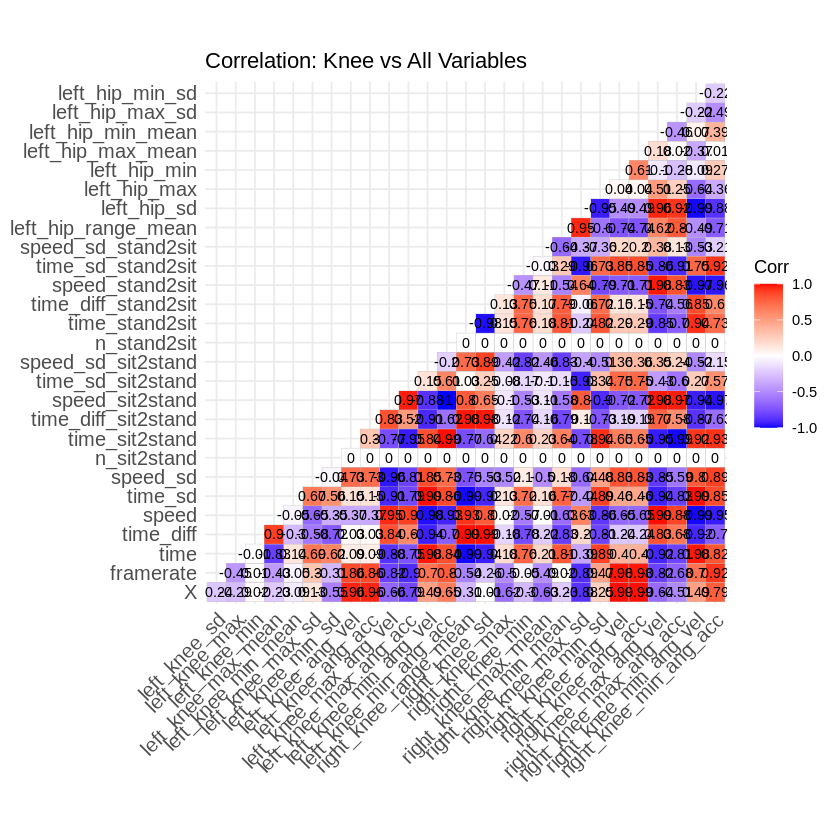

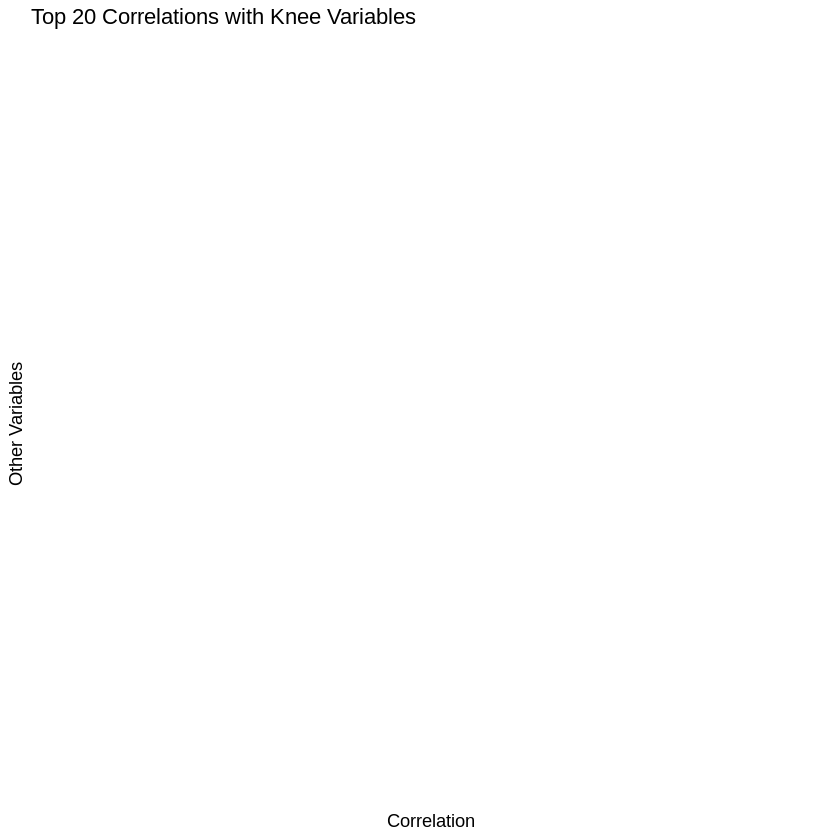

In [ ]:
# Load necessary libraries
install.packages("ggplot2", dependencies = FALSE) # Avoid installing unnecessary dependencies # If not installed
install.packages("ggcorrplot", dependencies = FALSE) # Avoid unnecessary dependencies # If not installed
install.packages("reshape2", dependencies = TRUE) # If not installed

library(ggplot2)
library(ggcorrplot)
library(reshape2)

# Load the dataset
data <- read.csv("dataClean.csv", header = TRUE, sep = ",")

# Define knee variables
knee_vars <- c("left_knee_range_mean", "left_knee_sd", "left_knee_max", "left_knee_min", "left_knee_max_mean",
               "left_knee_min_mean", "left_knee_max_sd", "left_knee_min_sd", "left_knee_ang_vel", "left_knee_ang_acc",
               "left_knee_max_ang_vel", "left_knee_max_ang_acc", "left_knee_min_ang_vel", "left_knee_min_ang_acc",
               "right_knee_range_mean", "right_knee_sd", "right_knee_max", "right_knee_min", "right_knee_max_mean",
               "right_knee_min_mean", "right_knee_max_sd", "right_knee_min_sd", "right_knee_ang_vel", "right_knee_ang_acc",
               "right_knee_max_ang_vel", "right_knee_max_ang_acc", "right_knee_min_ang_vel", "right_knee_min_ang_acc")

# Define all variables (including knee variables)
all_vars <- unique(c(knee_vars, colnames(data)))

# Filter numeric selected variables
numeric_data <- data[, all_vars]
numeric_data <- numeric_data[, sapply(numeric_data, is.numeric)]

# Remove knee variables that have zero variance
knee_vars <- knee_vars[knee_vars %in% colnames(numeric_data)]  # Keep only existing variables
knee_vars <- knee_vars[sapply(numeric_data[knee_vars], function(x) length(unique(na.omit(x))) > 1 & sd(x, na.rm = TRUE) > 0)]
numeric_data <- numeric_data[, apply(numeric_data, 2, function(x) length(unique(na.omit(x))) > 1 & sd(x, na.rm = TRUE) > 0)]
numeric_data <- numeric_data[, sapply(numeric_data, function(x) length(unique(x[!is.na(x)])) > 1)]  # Remove identical-value columns
numeric_data <- numeric_data[, colSums(!is.na(numeric_data)) > 1]  # Ensure at least 2 non-NA values
if (ncol(numeric_data) == 0) {
  print("Warning: No numeric columns with non-zero variance found. Check data preprocessing.")
  quit()
}  # Remove constant columns

# Compute correlation matrix for knee variables against all variables
cor_matrix <- cor(numeric_data[, knee_vars], numeric_data[, !colnames(numeric_data) %in% knee_vars], use = "complete.obs")
cor_matrix[is.na(cor_matrix)] <- 0

# Save correlation matrix to CSV
write.csv(as.data.frame(cor_matrix), "correlation_knee_vs_all.csv", row.names = TRUE)

# Convert correlation matrix to long format and sort values
cor_table <- as.data.frame(as.table(cor_matrix))
cor_table <- cor_table[cor_table$`Knee Variable` != cor_table$`Other Variable`, ]  # Exclude self-correlations
names(cor_table) <- c("Knee Variable", "Other Variable", "Correlation")
cor_table <- cor_table[order(-abs(cor_table$Correlation)), ]  # Sort by absolute correlation value

# Save sorted correlation results
write.csv(cor_table, "correlation_knee_sorted.csv", row.names = FALSE)

# Display correlation table
print(head(cor_table, 20))  # Show top correlations

# Generate correlation heatmap
ggcorrplot(cor_matrix, method = "square", type = "lower", lab = TRUE, lab_size = 3,
           colors = c("blue", "white", "red"), title = "Correlation: Knee vs All Variables", ggtheme = theme_minimal())

# Bar plot for top correlations
top_cor <- head(cor_table, 20)  # Select top 20 correlations
ggplot(top_cor, aes(x = reorder(`Other Variable`, Correlation), y = Correlation, fill = ifelse(Correlation > 0, "Positive", "Negative"))) +
  geom_bar(stat = "identity") +
  coord_flip() +
  ggtitle("Top 20 Correlations with Knee Variables") +
  xlab("Other Variables") +
  ylab("Correlation") +
  theme_minimal()


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Warning message in cor(numeric_data[, knee_vars], numeric_data[, !colnames(numeric_data) %in% :
“the standard deviation is zero”


[1] Knee Variable  Other Variable Correlation   
<0 rows> (or 0-length row.names)
[1] "Warning: No significant correlations found for visualization."


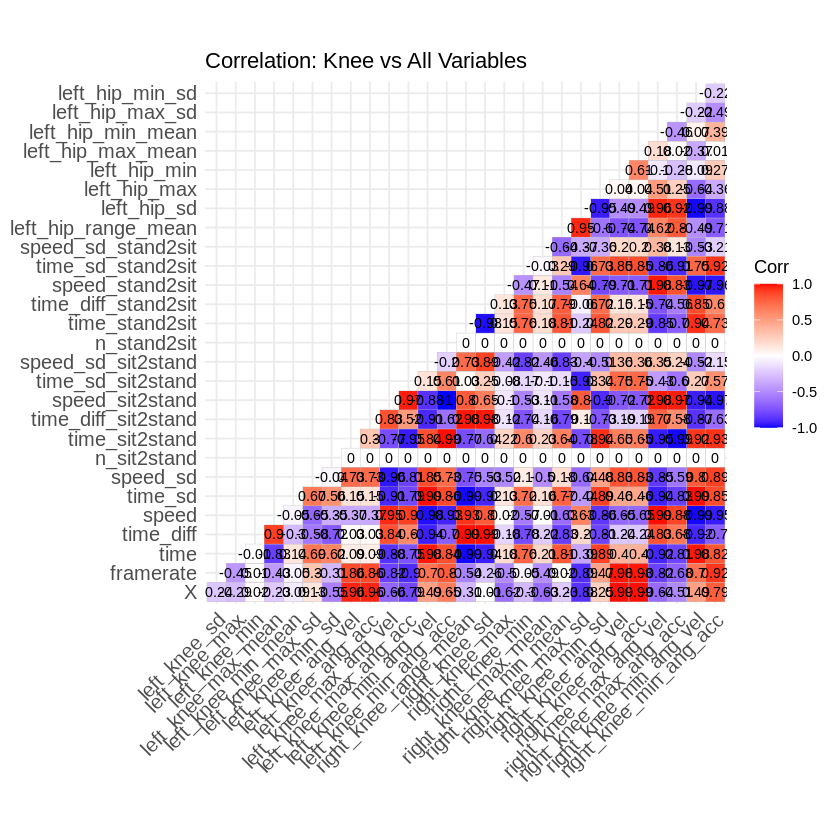

In [ ]:
# Load necessary libraries
install.packages("ggplot2", dependencies = FALSE) # Avoid installing unnecessary dependencies # If not installed
install.packages("ggcorrplot", dependencies = FALSE) # Avoid unnecessary dependencies # If not installed
install.packages("reshape2", dependencies = TRUE) # If not installed

library(ggplot2)
library(ggcorrplot)
library(reshape2)

# Load the dataset
data <- read.csv("dataClean.csv", header = TRUE, sep = ",")

# Define knee variables
knee_vars <- c("left_knee_range_mean", "left_knee_sd", "left_knee_max", "left_knee_min", "left_knee_max_mean",
               "left_knee_min_mean", "left_knee_max_sd", "left_knee_min_sd", "left_knee_ang_vel", "left_knee_ang_acc",
               "left_knee_max_ang_vel", "left_knee_max_ang_acc", "left_knee_min_ang_vel", "left_knee_min_ang_acc",
               "right_knee_range_mean", "right_knee_sd", "right_knee_max", "right_knee_min", "right_knee_max_mean",
               "right_knee_min_mean", "right_knee_max_sd", "right_knee_min_sd", "right_knee_ang_vel", "right_knee_ang_acc",
               "right_knee_max_ang_vel", "right_knee_max_ang_acc", "right_knee_min_ang_vel", "right_knee_min_ang_acc")

# Define all variables (including knee variables)
all_vars <- unique(c(knee_vars, colnames(data)))

# Filter numeric selected variables
numeric_data <- data[, all_vars]
numeric_data <- numeric_data[, sapply(numeric_data, is.numeric)]

# Remove knee variables that have zero variance
knee_vars <- knee_vars[knee_vars %in% colnames(numeric_data)]  # Keep only existing variables
knee_vars <- knee_vars[sapply(numeric_data[knee_vars], function(x) length(unique(na.omit(x))) > 1 & sd(x, na.rm = TRUE) > 0)]
numeric_data <- numeric_data[, apply(numeric_data, 2, function(x) length(unique(na.omit(x))) > 1 & sd(x, na.rm = TRUE) > 0)]
numeric_data <- numeric_data[, sapply(numeric_data, function(x) length(unique(x[!is.na(x)])) > 1)]  # Remove identical-value columns
numeric_data <- numeric_data[, colSums(!is.na(numeric_data)) > 1]  # Ensure at least 2 non-NA values
if (ncol(numeric_data) == 0) {
  print("Warning: No numeric columns with non-zero variance found. Check data preprocessing.")
  quit()
}  # Remove constant columns

# Compute correlation matrix for knee variables against all variables
cor_matrix <- cor(numeric_data[, knee_vars], numeric_data[, !colnames(numeric_data) %in% knee_vars], use = "complete.obs")
cor_matrix[is.na(cor_matrix)] <- 0

# Save correlation matrix to CSV
write.csv(as.data.frame(cor_matrix), "correlation_knee_vs_all.csv", row.names = TRUE)

# Convert correlation matrix to long format and sort values
cor_table <- as.data.frame(as.table(cor_matrix))
cor_table <- cor_table[cor_table$`Knee Variable` != cor_table$`Other Variable`, ]  # Exclude self-correlations
names(cor_table) <- c("Knee Variable", "Other Variable", "Correlation")
cor_table <- cor_table[order(-abs(cor_table$Correlation)), ]  # Sort by absolute correlation value

# Save sorted correlation results
write.csv(cor_table, "correlation_knee_sorted.csv", row.names = FALSE)

# Display correlation table
print(head(cor_table, 20))  # Show top correlations

# Generate correlation heatmap
ggcorrplot(cor_matrix, method = "square", type = "lower", lab = TRUE, lab_size = 3,
           colors = c("blue", "white", "red"), title = "Correlation: Knee vs All Variables", ggtheme = theme_minimal())

# Bar plot for top correlations
if(nrow(cor_table) > 0) {
  top_cor <- head(cor_table, 20)
} else {
  print("Warning: No significant correlations found for visualization.")
  top_cor <- NULL
}  # Select top 20 correlations
if (!is.null(top_cor)) {
  ggplot(top_cor, aes(x = reorder(`Other Variable`, Correlation), y = Correlation, fill = factor(ifelse(Correlation > 0, "Positive", "Negative")))) +
  geom_bar(stat = "identity") +
  coord_flip() +
  ggtitle("Top 20 Correlations with Knee Variables") +
  xlab("Other Variables") +
  ylab("Correlation") +
  theme_minimal()
}


In [ ]:
# Load necessary libraries
install.packages("ggplot2", dependencies = FALSE) # Avoid installing unnecessary dependencies # If not installed
install.packages("ggcorrplot", dependencies = FALSE) # Avoid unnecessary dependencies # If not installed
install.packages("reshape2", dependencies = TRUE) # If not installed

library(ggplot2)
library(ggcorrplot)
library(reshape2)

# Load the dataset
data <- read.csv("dataClean.csv", header = TRUE, sep = ",")

# Define knee variables
knee_vars <- c("left_knee_range_mean", "left_knee_sd", "left_knee_max", "left_knee_min", "left_knee_max_mean",
               "left_knee_min_mean", "left_knee_max_sd", "left_knee_min_sd", "left_knee_ang_vel", "left_knee_ang_acc",
               "left_knee_max_ang_vel", "left_knee_max_ang_acc", "left_knee_min_ang_vel", "left_knee_min_ang_acc",
               "right_knee_range_mean", "right_knee_sd", "right_knee_max", "right_knee_min", "right_knee_max_mean",
               "right_knee_min_mean", "right_knee_max_sd", "right_knee_min_sd", "right_knee_ang_vel", "right_knee_ang_acc",
               "right_knee_max_ang_vel", "right_knee_max_ang_acc", "right_knee_min_ang_vel", "right_knee_min_ang_acc")

# Define all variables (including knee variables)
all_vars <- unique(c(knee_vars, colnames(data)))

# Filter numeric selected variables
numeric_data <- data[, all_vars]
numeric_data <- numeric_data[, sapply(numeric_data, is.numeric)]

# Remove knee variables that have zero variance
knee_vars <- knee_vars[knee_vars %in% colnames(numeric_data)]  # Keep only existing variables
knee_vars <- knee_vars[sapply(numeric_data[knee_vars], function(x) length(unique(na.omit(x))) > 1 & sd(x, na.rm = TRUE) > 0)]
numeric_data <- numeric_data[, apply(numeric_data, 2, function(x) length(unique(na.omit(x))) > 1 & sd(x, na.rm = TRUE) > 0)]
numeric_data <- numeric_data[, sapply(numeric_data, function(x) length(unique(x[!is.na(x)])) > 1)]  # Remove identical-value columns
numeric_data <- numeric_data[, colSums(!is.na(numeric_data)) > 1]  # Ensure at least 2 non-NA values
if (ncol(numeric_data) == 0) {
  print("Warning: No numeric columns with non-zero variance found. Check data preprocessing.")
  quit()
}  # Remove constant columns

# Compute correlation matrix for knee variables against all variables
cor_matrix <- cor(numeric_data[, knee_vars], numeric_data[, !colnames(numeric_data) %in% knee_vars], use = "complete.obs")
cor_matrix[is.na(cor_matrix)] <- 0

# Save correlation matrix to CSV
write.csv(as.data.frame(cor_matrix), "correlation_knee_vs_all.csv", row.names = TRUE)

# Convert correlation matrix to long format and sort values
cor_table <- as.data.frame(as.table(cor_matrix))
cor_table <- cor_table[cor_table$`Knee Variable` != cor_table$`Other Variable`, ]  # Exclude self-correlations
names(cor_table) <- c("Knee Variable", "Other Variable", "Correlation")
cor_table <- cor_table[order(-abs(cor_table$Correlation)), ]  # Sort by absolute correlation value

# Save sorted correlation results
write.csv(cor_table, "correlation_knee_sorted.csv", row.names = FALSE)

# Display correlation table
print(head(cor_table, 20))  # Show top correlations

# Generate correlation heatmap
ggcorrplot(cor_matrix, method = "square", type = "lower", lab = TRUE, lab_size = 3,
           colors = c("blue", "white", "red"), title = "Correlation: Knee vs All Variables", ggtheme = theme_minimal() + scale_fill_manual(name = "Correlation Type", values = c("Negative" = "red", "Positive" = "blue")))

# Bar plot for top correlations
if(nrow(cor_table) > 0) {
  top_cor <- head(cor_table, 20)
} else {
  print("Warning: No significant correlations found for visualization.")
  top_cor <- NULL
}  # Select top 20 correlations
if (!is.null(top_cor) && nrow(top_cor) > 0) {
  ggplot(top_cor, aes(x = reorder(`Other Variable`, Correlation), y = Correlation, fill = factor(ifelse(Correlation > 0, "Positive", "Negative")))) +
  geom_bar(stat = "identity") +
  coord_flip() +
  ggtitle("Top 20 Correlations with Knee Variables") +
  xlab("Other Variables") +
  ylab("Correlation") +
  theme_minimal()
}


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Warning message in cor(numeric_data[, knee_vars], numeric_data[, !colnames(numeric_data) %in% :
“the standard deviation is zero”


[1] Knee Variable  Other Variable Correlation   
<0 rows> (or 0-length row.names)


ERROR: [1m[33mError[39m in `ggcorrplot()`:[22m
[1m[22m[33m![39m Can't add `scale_fill_manual(name = "Correlation Type", values =
  c(Negative = "red", ` and ` Positive = "blue"))` to a theme object.


In [ ]:
# Load necessary libraries
install.packages("ggplot2", dependencies = FALSE) # Avoid installing unnecessary dependencies # If not installed
install.packages("ggcorrplot", dependencies = FALSE) # Avoid unnecessary dependencies # If not installed
install.packages("reshape2", dependencies = TRUE) # If not installed

library(ggplot2)
library(ggcorrplot)
library(reshape2)

# Load the dataset
data <- read.csv("dataClean.csv", header = TRUE, sep = ",")

# Define knee variables
knee_vars <- c("left_knee_range_mean", "left_knee_sd", "left_knee_max", "left_knee_min", "left_knee_max_mean",
               "left_knee_min_mean", "left_knee_max_sd", "left_knee_min_sd", "left_knee_ang_vel", "left_knee_ang_acc",
               "left_knee_max_ang_vel", "left_knee_max_ang_acc", "left_knee_min_ang_vel", "left_knee_min_ang_acc",
               "right_knee_range_mean", "right_knee_sd", "right_knee_max", "right_knee_min", "right_knee_max_mean",
               "right_knee_min_mean", "right_knee_max_sd", "right_knee_min_sd", "right_knee_ang_vel", "right_knee_ang_acc",
               "right_knee_max_ang_vel", "right_knee_max_ang_acc", "right_knee_min_ang_vel", "right_knee_min_ang_acc")

# Define all variables (including knee variables)
all_vars <- unique(c(knee_vars, colnames(data)))

# Filter numeric selected variables
numeric_data <- data[, all_vars]
numeric_data <- numeric_data[, sapply(numeric_data, is.numeric)]

# Remove knee variables that have zero variance
knee_vars <- knee_vars[knee_vars %in% colnames(numeric_data)]  # Keep only existing variables
knee_vars <- knee_vars[sapply(numeric_data[knee_vars], function(x) length(unique(na.omit(x))) > 1 & sd(x, na.rm = TRUE) > 0)]
numeric_data <- numeric_data[, apply(numeric_data, 2, function(x) length(unique(na.omit(x))) > 1 & sd(x, na.rm = TRUE) > 0)]
numeric_data <- numeric_data[, sapply(numeric_data, function(x) length(unique(x[!is.na(x)])) > 1)]  # Remove identical-value columns
numeric_data <- numeric_data[, colSums(!is.na(numeric_data)) > 1]  # Ensure at least 2 non-NA values
if (ncol(numeric_data) == 0) {
  print("Warning: No numeric columns with non-zero variance found. Check data preprocessing.")
  quit()
}  # Remove constant columns

# Compute correlation matrix for knee variables against all variables
cor_matrix <- cor(numeric_data[, knee_vars], numeric_data[, !colnames(numeric_data) %in% knee_vars], use = "complete.obs")
cor_matrix[is.na(cor_matrix)] <- 0

# Save correlation matrix to CSV
write.csv(as.data.frame(cor_matrix), "correlation_knee_vs_all.csv", row.names = TRUE)

# Convert correlation matrix to long format and sort values
cor_table <- as.data.frame(as.table(cor_matrix))
cor_table <- cor_table[cor_table$`Knee Variable` != cor_table$`Other Variable`, ]  # Exclude self-correlations
names(cor_table) <- c("Knee Variable", "Other Variable", "Correlation")
cor_table <- cor_table[order(-abs(cor_table$Correlation)), ]  # Sort by absolute correlation value

# Save sorted correlation results
write.csv(cor_table, "correlation_knee_sorted.csv", row.names = FALSE)

# Display correlation table
print(head(cor_table, 20))  # Show top correlations

# Generate correlation heatmap
ggcorrplot(cor_matrix, method = "square", type = "lower", lab = TRUE, lab_size = 3,
           colors = c("blue", "white", "red"), title = "Correlation: Knee vs All Variables", ggtheme = theme_minimal() + scale_fill_manual(name = "Correlation Type", values = c("Negative" = "red", "Positive" = "blue")))

# Bar plot for top correlations
if(nrow(cor_table) > 0) {
  top_cor <- head(cor_table, 20)
} else {
  print("Warning: No significant correlations found for visualization.")
  top_cor <- NULL
}  # Select top 20 correlations
if (!is.null(top_cor) && nrow(top_cor) > 0) {
  ggplot(top_cor, aes(x = reorder(`Other Variable`, Correlation), y = Correlation, fill = factor(ifelse(Correlation > 0, "Positive", "Negative")))) +
  geom_bar(stat = "identity") +
  coord_flip() +
  ggtitle("Top 20 Correlations with Knee Variables") +
  xlab("Other Variables") +
  ylab("Correlation") +
  theme_minimal()
}


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Warning message in cor(numeric_data[, knee_vars], numeric_data[, !colnames(numeric_data) %in% :
“the standard deviation is zero”


[1] Knee Variable  Other Variable Correlation   
<0 rows> (or 0-length row.names)


ERROR: [1m[33mError[39m in `ggcorrplot()`:[22m
[1m[22m[33m![39m Can't add `scale_fill_manual(name = "Correlation Type", values =
  c(Negative = "red", ` and ` Positive = "blue"))` to a theme object.


In [ ]:
BMI = weight (kg) / (height (m))^2

ERROR: Error in weight(kg): could not find function "weight"


In [ ]:
data <- read.csv("dataClean.csv")  # Assuming your data is in 'dataClean.csv'